<center><font size=5> Seasonal variation in mortality in Brazil </center></font>

After [Gathering](https://medium.com/@victorfoscarini/unlocking-brazils-mortality-data-a-guide-to-extracting-sim-datasus-data-with-the-microdatasus-d7ea7bb1cc61) and [Preprocessing](https://medium.com/@victorfoscarini/refining-brazils-mortality-data-a-guide-to-transforming-sim-datasus-data-with-standardization-to-13ed10d6f808) the data, we investigate the seasonality of mortality in Brazil, comparing the size and timing of the seasonal component of the country's states. Since we correctly standardized death rates across states using Brazil as the standard population and sex and age as confounding factors, we can compare the values of different states.

Brazil is an excellent case study for analyzing seasonal mortality patterns because its heterogeneous socioeconomic and climatic conditions are coupled with a homogeneous healthcare database.

For the plots, we chose colors using color pickers (such as https://colorpicker.me/) and tried to make them color-blind friendly using online guides (such as https://www.tableau.com/blog/examining-data-viz-rules-dont-use-red-green-together).

Note: I'm using an integrated Colab + Google Drive environment for this project, but this could be done similarly with a local Jupyter lab, Jupyter notebook, or even just a regular Python compiler.

# Data Extraction and Transformation

## Importing Libraries

In [ ]:
!pip install numpy==1.23.5
!pip install pandas==2.1.1
!pip install xlrd==2.0.1
!pip install matplotlib==3.7.1
!pip install seaborn==0.13.0
!pip install ipython==7.34.0
!pip install geopandas==0.13.2
!pip install statsmodels==0.14.1
!pip install scikit-learn==1.2.2
!pip install scikit-posthocs==0.8.0
!pip install tslearn==0.6.2
!pip install joblib==1.3.2
!pip install geobr==0.2.1
!pip install rtree==1.2.0
!pip install pygeos==0.14
!pip install ruptures==1.1.9

In [ ]:
#importing libraries

#basic ds libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import missingno as msno
from IPython.display import display
from datetime import date
import os
import re

#visualization
import geopandas as gpd
from geobr import read_state
from shapely.geometry import Polygon
from matplotlib.cm import ScalarMappable
from matplotlib.patheffects import withStroke
from matplotlib import colors
import matplotlib.colors as mcolors

#hypothesis testing
from scipy import stats
import scikit_posthocs as sp
from scipy.stats import kurtosis, skew
from scipy.stats import shapiro, levene, f_oneway
import scikit_posthocs as sp
from scipy.stats import chisquare

#ts libraries
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.stattools import adfuller
from scipy import signal
import ruptures as rpt

#ts decompose and measures
from tslearn.barycenters import dtw_barycenter_averaging, softdtw_barycenter
from tslearn.utils import ts_zeros
from statsmodels.tsa.seasonal import seasonal_decompose

#ml and clustering
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import KMeans

#print
BOLD = '\033[1m'
END = '\033[0m'

#ignore warnings for now
import warnings
warnings.filterwarnings("ignore")


from google.colab import drive
drive.mount('/content/drive/')
path = '/content/drive/My Drive/seasonal_mortality_hub/data/'
models_path = '/content/drive/My Drive/seasonal_mortality_hub/models/'

## Data Processing

I set up dictionaries for ICD-10 codes and states.

I used data from 2000 to 2019, as the data quality before 2000 was not optimal, and the COVID-19 pandemic substantially influenced data post-2019.

Additionally, I identified the leading causes of death, allowing me to focus on these primary causes in further analyses.

In [3]:
icd_dict = {
  'A00-B99':  'Certain infectious and parasitic diseases',
  'C00-D49':  'Neoplasms',
  'D50-D89':  'Diseases of the blood and blood-forming organs and certain disorders involving the immune mechanism',
  'E00-E89':  'Endocrine, nutritional and metabolic diseases',
  'F01-F99':  'Mental, Behavioral and Neurodevelopmental disorders',
  'G00-G99':  'Diseases of the nervous system',
  'H00-H59':  'Diseases of the eye and adnexa',
  'H60-H95':  'Diseases of the ear and mastoid process',
  'I00-I99':  'Diseases of the circulatory system',
  'J00-J99':  'Diseases of the respiratory system',
  'K00-K95':  'Diseases of the digestive system',
  'L00-L99':  'Diseases of the skin and subcutaneous tissue',
  'M00-M99':  'Diseases of the musculoskeletal system and connective tissue',
  'N00-N99':  'Diseases of the genitourinary system',
  'O00-O9A':  'Pregnancy, childbirth and the puerperium',
  'P00-P96':  'Certain conditions originating in the perinatal period',
  'Q00-Q99':  'Congenital malformations, deformations and chromosomal abnormalities',
  'R00-R99':  'Symptoms, signs and abnormal clinical and laboratory findings, not elsewhere classified',
  'S00-T88':  'Injury, poisoning and certain other consequences of external causes',
  'U00-U85':  'Codes for special purposes',
  'V00-Y99':  'External causes of morbidity',
  'Z00-Z99':  'Factors influencing health status and contact with health services'
}

# Ranked from latitude: https://gist.github.com/ricardobeat/674646
state_dict = {
  'RR': 'Roraima',
  'AP': 'Amapá',
  'MA': 'Maranhão',
  'AM': 'Amazonas',
  'CE': 'Ceará',
  'RN': 'Rio Grande do Norte',
  'PA': 'Pará',
  'PB': 'Paraíba',
  'PI': 'Piauí',
  'PE': 'Pernambuco',
  'AC': 'Acre',
  'AL': 'Alagoas',
  'TO': 'Tocantins',
  'SE': 'Sergipe',
  'RO': 'Rondônia',
  'MT': 'Mato Grosso',
  'BA': 'Bahia',
  'DF': 'Distrito Federal',
  'GO': 'Goiás',
  'MG': 'Minas Gerais',
  'ES': 'Espírito Santo',
  'MS': 'Mato Grosso do Sul',
  'RJ': 'Rio de Janeiro',
  'SP': 'São Paulo',
  'PR': 'Paraná',
  'SC': 'Santa Catarina',
  'RS': 'Rio Grande do Sul'
}

states = list(state_dict.keys())

In [4]:
death_column = 'DEATHS_STANDARDIZED_BR'
icd_dict_keys = list(icd_dict.keys())
divide_codes = [x.split('-') for x in icd_dict_keys]
def f(x):
  for i in range(len(divide_codes)):
    if divide_codes[i][0]<=x<=divide_codes[i][1]:
      return icd_dict[icd_dict_keys[i]]#f'{icd_dict_keys[i]}: {icd_dict[icd_dict_keys[i]]}'
df = None
for state in states:
  data = pd.read_csv(path+f'sim/states_standardized/{state}_standardized_1996_2022.csv')
  data = data[['DT', 'CAUSE', death_column, 'DEATH_COUNT']]
  data['DT'] = pd.to_datetime(data['DT'])
  data = data[(data.DT.dt.year>=2000)&(data.DT.dt.year<=2019)]
  data['CAUSE'] = data['CAUSE'].str[:3].apply(lambda x: f(x))
  data['STATE'] = state
  if df is None:
    df = data
  else:
    df = pd.concat([df, data])
# I group all data from 2000-2019 in a single year that I set as
# 2024 only to be able to perform operations with it
df.DT = df.DT.dt.strftime('%m-%d')
df = df[df.DT!='02-29'] #delete ferbruary 29th
df = df.groupby(by=['DT', 'CAUSE', 'STATE']).sum().reset_index()
df.DT = pd.to_datetime('2024-'+df.DT, format="%Y-%m-%d")
df = df.sort_values(by=['DT'])
df['DT_right'] = df.DT.dt.strftime('%m-%d')
dic = {df.DT_right.unique()[i]: i for i in np.arange(len(df.DT_right.unique()))}
df['DT_numeric'] = df.DT_right.apply(lambda x: dic[x])
date_dict = pd.Series(df['DT_numeric'].unique(), index=df['DT_right'].unique()).to_dict()
inverse_date_dict = {v: k for k, v in date_dict.items()}

In [5]:
#top-10 causes of death
top_causes = df[['CAUSE', death_column]].groupby('CAUSE').sum(
    ).sort_values(by=death_column, ascending=False)
display(top_causes[:10])
top_causes = list(top_causes.index[:10])

,DEATHS_STANDARDIZED_BR
CAUSE,
Diseases of the circulatory system,85390.795944
Neoplasms,44954.597545
External causes of morbidity,41945.874156
Diseases of the respiratory system,30727.729331
"Symptoms, signs and abnormal clinical and laboratory findings, not elsewhere classified",27488.962943
"Endocrine, nutritional and metabolic diseases",20169.713471
Diseases of the digestive system,15135.499357
Certain infectious and parasitic diseases,13646.014918
Certain conditions originating in the perinatal period,7812.237472


## Defining processing functions


In [7]:
# Define death column
death_column = 'DEATHS_STANDARDIZED_BR'

def seasonality_by_cause_subcalculation(data, cause, measure_name,
                                        start_day=None, end_day=None, n=None):
    data = data[data.CAUSE==cause]
    if measure_name=='EWDi':
        winter_count = data[data.DT.dt.month.isin([6,7,8,9])][death_column].sum()
        non_winter_count = data[~data.DT.dt.month.isin([6,7,8,9])][death_column].sum()
        # winter_count = data[(data.DT_numeric>=start_day)&(data.DT_numeric<end_day)][death_column].sum()
        # non_winter_count = data[death_column].sum() - greatest_deaths
        ewdi = (winter_count - 0.5*non_winter_count)/(0.5*non_winter_count)
        return ewdi
    else:
        greatest_deaths = data[(data.DT_numeric>=start_day)&(data.DT_numeric<end_day)][death_column].sum()
        expected_deaths = (data[death_column].sum() - greatest_deaths) * (n/(365-n))
        edi = (greatest_deaths - expected_deaths)/expected_deaths
        return edi

def seasonality_by_cause_calculation(measure_name):

    # Reading data
    data = df.copy()[['DT', 'DT_numeric', 'STATE', 'CAUSE', death_column]]

    # Arrays for storing results
    seasonality_by_cause = []
    contribution_to_seasonality_by_cause = []

    # Calculating EWDi by cause
    for state in list(state_dict.keys()):

      # Arrays for storing subresults
      seasonality_by_cause_in_state = {}
      seasonality_by_cause_in_state['state'] = state
      contribution_to_seasonality_by_cause_in_state = {}
      contribution_to_seasonality_by_cause_in_state['state'] = state

      # Get data by state - subdata
      new_data = data[data.STATE==state]

      # Get start/end day and n for the state if not given general ones
      if measure_name=='EWDi':
        n = None
        start_day = date_dict['06-01']
        end_day = date_dict['09-30']
      elif measure_name=='EDi-1':
        n = 120
        support_data = pd.read_csv(f"{path}measures/{measure_name.lower().replace('-', '_')}_by_state.csv")
        start_day = int(support_data[support_data.state==state]['center_day'] - n/2)
        end_day = int(support_data[support_data.state==state]['center_day'] + n/2)
      elif measure_name=='EDi-2':
        support_data = pd.read_csv(f"{path}measures/{measure_name.lower().replace('-', '_')}_by_state.csv")
        n = support_data[support_data.state==state]['size'].values[0]
        start_day = int(support_data[support_data.state==state]['center_day'] - n/2)
        end_day = int(support_data[support_data.state==state]['center_day'] + n/2)

      # What percentage of deaths in the deadly period come from each cause
      deaths_by_cause_deadly_period = new_data[(new_data.DT_numeric>=start_day)&
          (new_data.DT_numeric<end_day)][['CAUSE', death_column]].groupby(by='CAUSE').sum()
      deaths_by_cause_deadly_period = deaths_by_cause_deadly_period/deaths_by_cause_deadly_period.sum()

      for cause in top_causes:
        # Calculate seasonality for the cause
        measure = seasonality_by_cause_subcalculation(new_data, cause, measure_name, start_day, end_day, n)
        # Get ewdi and contribution to ewdi for the cause
        seasonality_by_cause_in_state[cause] = measure
        contribution_to_seasonality_by_cause_in_state[cause] = measure*deaths_by_cause_deadly_period.loc[cause].values[0]

      seasonality_by_cause.append(seasonality_by_cause_in_state)
      contribution_to_seasonality_by_cause.append(contribution_to_seasonality_by_cause_in_state)

    seasonality_by_cause = pd.DataFrame(seasonality_by_cause)
    contribution_to_seasonality_by_cause = pd.DataFrame(contribution_to_seasonality_by_cause)
    con_sum = contribution_to_seasonality_by_cause.iloc[:,1:].abs().sum(axis=1) #absolute percentage
    contribution_to_seasonality_by_cause.iloc[:,1:] = contribution_to_seasonality_by_cause.iloc[:,1:].div(con_sum/100, axis=0)

    # Sort states according to latitude
    order = ['AC', 'AM', 'AP', 'PA', 'RO', 'RR', 'TO', 'AL', 'BA', 'CE', 'MA',
             'PB', 'PE', 'PI', 'RN', 'SE', 'GO', 'MT', 'MS', 'DF', 'ES', 'MG',
             'RJ', 'SP', 'PR', 'RS', 'SC']
    seasonality_by_cause['state'] = pd.Categorical(
        seasonality_by_cause['state'], categories=order, ordered=True)
    seasonality_by_cause = seasonality_by_cause.sort_values('state').set_index('state').T
    contribution_to_seasonality_by_cause['state'] = pd.Categorical(
        contribution_to_seasonality_by_cause['state'], categories = order, ordered=True)
    contribution_to_seasonality_by_cause = contribution_to_seasonality_by_cause.sort_values(
                                              'state').set_index('state').T

    seasonality_by_cause.to_csv(
        f"{path}measures/{measure_name.lower().replace('-', '_')}_by_cause_by_state.csv", index=True)
    contribution_to_seasonality_by_cause.to_csv(
        f"{path}measures/contribution_to_{measure_name.lower().replace('-', '_')}_by_cause_by_state.csv", index=True)

# Visualizing mortality

I visualize the all-cause mortality for the whole country in a polar seasonal plot.

There is a pronounced peak in mortality during the colder months, with the highest mortality being around July, at the beginning of winter in the southern hemisphere, that starts around the end of June. Additionally, we see some deviations, the main one being the peak in mortality on January 1st, linked to New Year's Eve celebrations.

In [8]:
data = df.copy()
data = data[['DT_right', 'DEATH_COUNT']].groupby(by='DT_right').sum().reset_index(names='date')
data['deaths'] = 100*data['DEATH_COUNT']/data['DEATH_COUNT'].sum()
data = data.drop(columns=['DEATH_COUNT'])

# Create a polar plot
fig = px.line_polar(data, r='deaths', theta='date', line_close=True,)

# Create axis labels
axis_labels = data['date'].apply(lambda x: x if x[3:] in ['01','15'] else '')

# Update layout
fig.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            griddash='dot',
            gridcolor='black',
            gridwidth=2,
            range=[0, data['deaths'].max()],
        ),
        angularaxis=dict(
            type='category',
            direction='clockwise',
            rotation=90,
            tickmode='array',
            tickvals=data['date'],
            ticktext=axis_labels,
        )
    ),
    showlegend=False,
    title={
        'text': 'Year-Round All-Cause Mortality Distribution (%)',
        'x':0.5,
        'font':{'size':24},
    }
)

# Update traces
fig.update_traces(fill='toself',)
                  #line_color='black')

# Show plot
fig.show()

# PTR

The Peak-to-Trough Ratio (PTR) is a good baseline to compare with novel seasonality metrics. It is the current state-of-the-art technique. The PTR quantifies seasonality by comparing the highest and lowest mortality points in a yearly time series.

$$PTR = \frac{Deaths_{peak}}{Deaths_{trough}}$$

Before calculating the PTR, we need to smooth the curve to avoid making the measure meaningless due to the presence of outliers. We do that by modeling the aggregated yearly time series over 2000-2019 with cyclic cubic splines for the whole country and separately for each state. We can visualize this modeling with a combination of line and scatter plots.

After the modeling, we visualize the results of seasonality across states with a choropleth map. We then cluster the results of the PTR metric (the PTR value, the peak, and the trough) using K-Nearest Neighbors (KNN) clustering.

We noticed that the PTR typically records different mortality peaks for the north and south of Brazil. Notice that I use north and south as general cardinal directions, not the official regions of Brazil:
 - North: smaller seasonality, an early-autumn mortality peak, and a late-spring trough.
 - South: larger seasonality, an early-winter peak, and a late-summer trough.

Still, the clustering reveals a more complicated pattern, with a central region between the north and south. This region is a mix of both, with a small seasonality (similar to the north), an early-winter peak (similar to the south), and a mid-spring trough (close to the north but slightly different).

Roraima is an exception to this pattern, as it is a northern state with a seasonality similar to that of southern states. However, the fact that Roraima's weather is markedly different from the other states due to its positioning to the north of the Amazon forest, with a rainy season at the same time as the winter of the southern state, might explain that.

Another less marked but still substantial breaking of the geographical pattern is the state of Rio de Janeiro, which belongs to the central cluster, while all of its neighbors belong to the southern cluster. Again, the climate might explain that difference, as most of the population concentrates on the capital and metropolitan area, which experiences a more tropical, warmer, and humid climate due to its proximity to the Atlantic Ocean.

Comparing the seasonality of the whole country with the different seasonal mortality regions, we see that it resembles the south more. It is not surprising, as that's the most populated region. It is also worth noting that, as the whole country's seasonality encompasses the sum of considerable differences across the country, it is normal to be smaller than the seasonality of most singular regions since it sums opposing seasonalities.

## In Brazil

Brazil
PTR = 1.07
Peak day = 07-08, n_deaths = 883.73
Trough day = 11-16, n_deaths = 822.58


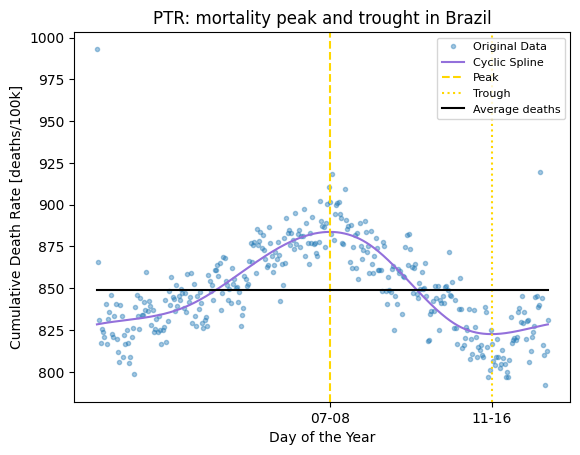

In [9]:
import statsmodels.api as sm
import joblib
# Statsmodels uses the same spline basis as patsy for Cyclic Cubic Splines
# https://patsy.readthedocs.io/en/latest/spline-regression.html#natural-and-cyclic-cubic-regression-splines
# https://www.statsmodels.org/dev/generated/statsmodels.gam.smooth_basis.CyclicCubicSplines.html
# https://www.statsmodels.org/dev/generated/statsmodels.regression.linear_model.OLS.from_formula.html

data = df.copy()
data = data[['DT', 'DT_right', 'DT_numeric', death_column]].groupby(by=['DT', 'DT_right', 'DT_numeric']).sum().reset_index()

# Create a cyclical spline with 4 degrees of freedom
formula = f"{death_column} ~ cc(DT_numeric, df=4, constraints='center')"
spl = sm.OLS.from_formula(formula, data=data)

# Fit the model
spline_model = spl.fit()

# Get predictions
predictions = spline_model.predict(data) #needs a variable called DT_numeric to predict
data['predictions'] = predictions

# Calculate stats
max_value = data[data['predictions']==data['predictions'].max()]
min_value = data[data['predictions']==data['predictions'].min()]
avg_value = data.predictions.mean()
data['relative_risk'] = data['predictions'] / avg_value
peak_day = max_value.DT_numeric.values[0]
trough_day = min_value.DT_numeric.values[0]
peak_date = max_value.DT_right.values[0]
trough_date = min_value.DT_right.values[0]
peak_deaths = max_value['predictions'].values[0]
trough_deaths = min_value['predictions'].values[0]
ptr = peak_deaths/trough_deaths

# Print the results
print(BOLD+f'Brazil'+END)
print(BOLD+f'PTR = {round(ptr,2)}'+END)
print(f'Peak day = {str(peak_date)[:10]}, n_deaths = {round(peak_deaths,2)}')
print(f'Trough day = {str(trough_date)[:10]}, n_deaths = {round(trough_deaths,2)}')

# Set subplot
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6.4,4.8))

# Plot the results
ax.plot(data['DT_right'], data[death_column], 'o', alpha=0.4, ms=3, label='Original Data')
ax.plot(data['DT_right'], predictions, color='mediumpurple', label='Cyclic Spline')
ax.axvline(x=max_value.DT_right.values[0], color='gold', ls='--', label='Peak') #peak
ax.axvline(x=min_value.DT_right.values[0], color='gold', ls=':', label='Trough') #trough
ax.plot(data['DT_right'], [avg_value]*len(data['DT_right']), color='black', label='Average deaths')
ax.set_title(f'PTR: mortality peak and trought in Brazil')
ax.set_xlabel('Day of the Year')
ax.set_ylabel('Cumulative Death Rate [deaths/100k]')
ax.set_xticks([peak_day, trough_day])
ax.legend(loc='upper right', fontsize=8)
plt.show()

## Modelling

### Modelling annual mortality

In [10]:
%%time

import statsmodels.api as sm
import joblib

for state in states:

  print(BOLD+state+END)

  data = df.copy()
  data = data[data['STATE']==state].drop(['STATE'], axis=1)
  data = data[['DT', 'DT_right', 'DT_numeric', death_column]].groupby(by=['DT', 'DT_right', 'DT_numeric']).sum().reset_index()

  # Create a cyclical spline with 4 degrees of freedom
  formula = f"{death_column} ~ cc(DT_numeric, df=4, constraints='center')"
  spl = sm.OLS.from_formula(formula, data=data)

  # Fit the model
  spline_model = spl.fit()

  #Save model
  joblib.dump(spline_model, f'{models_path}/spline_states/{state}_spline.pkl')

  # Get predictions
  predictions = spline_model.predict(data)

RR
AP
MA
AM
CE
RN
PA
PB
PI
PE
AC
AL
TO
SE
RO
MT
BA
DF
GO
MG
ES
MS
RJ
SP
PR
SC
RS
CPU times: user 3.08 s, sys: 4.24 s, total: 7.32 s
Wall time: 17.7 s


### Visualizing

State: Roraima
PTR = 1.18
Peak day = 07-16, n_deaths = 34.25
Trough day = 03-03, n_deaths = 29.12


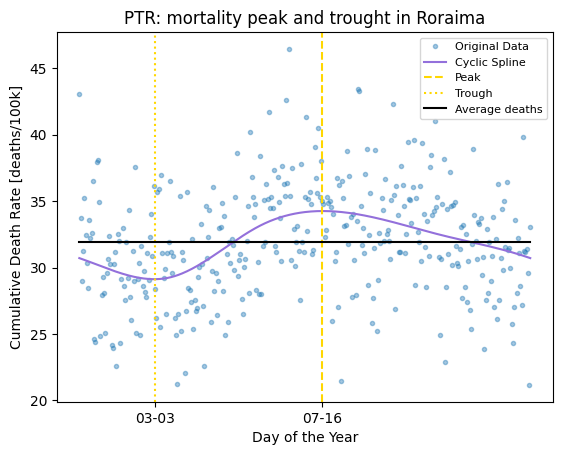

State: Amapá
PTR = 1.11
Peak day = 04-20, n_deaths = 30.97
Trough day = 12-21, n_deaths = 28.01


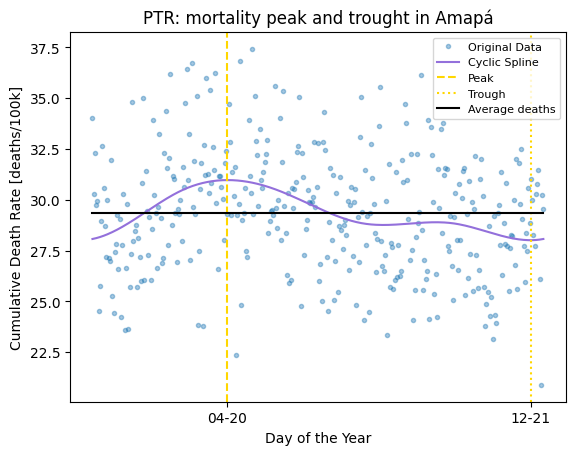

State: Maranhão
PTR = 1.11
Peak day = 04-02, n_deaths = 27.9
Trough day = 11-27, n_deaths = 25.02


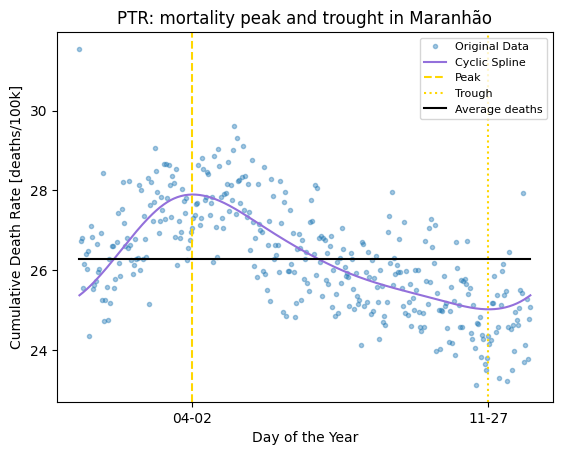

State: Amazonas
PTR = 1.07
Peak day = 04-02, n_deaths = 31.19
Trough day = 12-08, n_deaths = 29.12


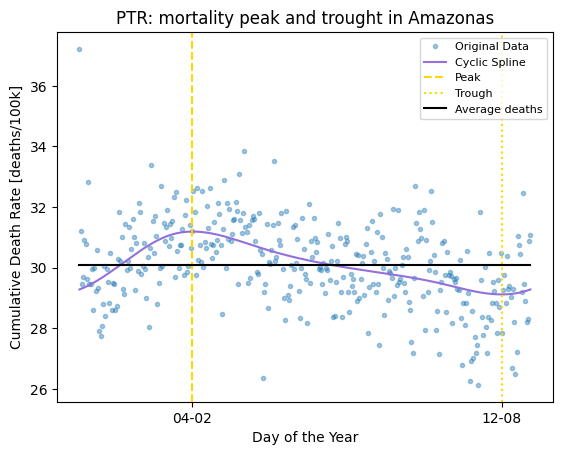

State: Ceará
PTR = 1.13
Peak day = 04-12, n_deaths = 31.6
Trough day = 09-04, n_deaths = 27.92


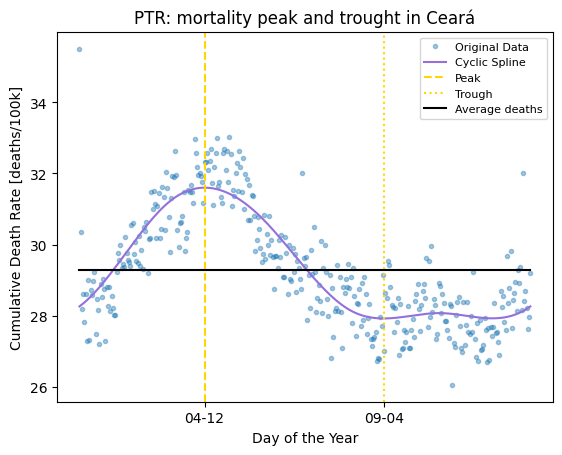

State: Rio Grande do Norte
PTR = 1.11
Peak day = 04-26, n_deaths = 29.25
Trough day = 11-11, n_deaths = 26.42


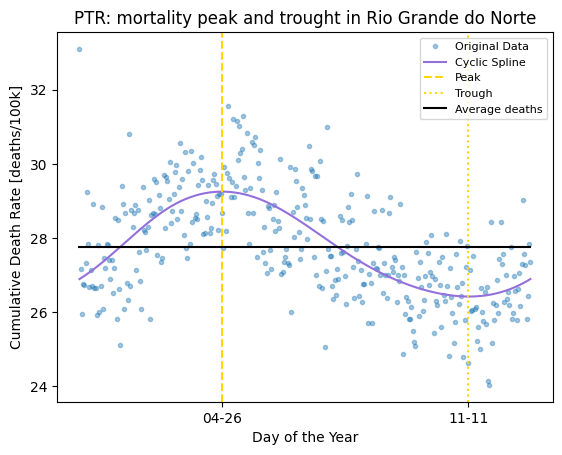

State: Pará
PTR = 1.08
Peak day = 04-04, n_deaths = 30.46
Trough day = 11-28, n_deaths = 28.2


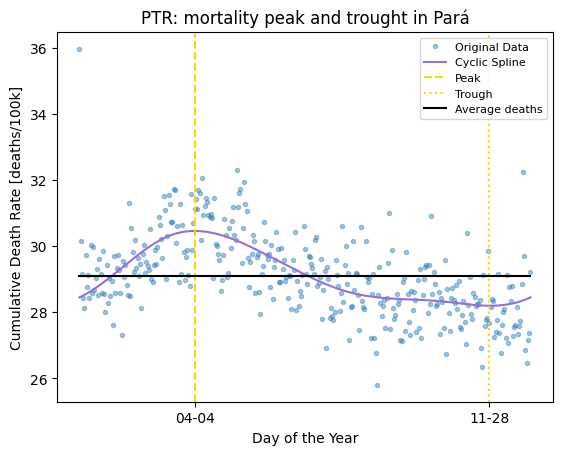

State: Paraíba
PTR = 1.1
Peak day = 06-04, n_deaths = 31.73
Trough day = 11-06, n_deaths = 28.93


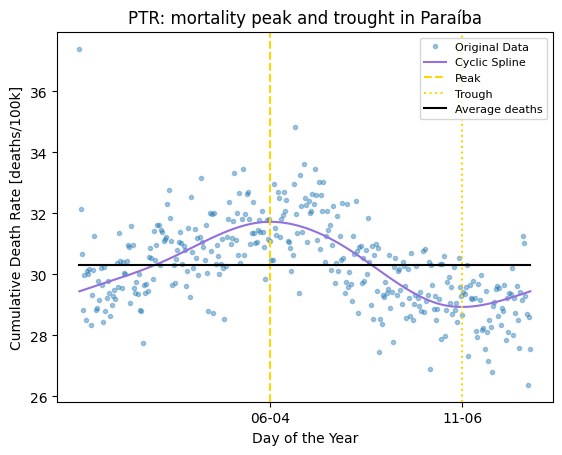

State: Piauí
PTR = 1.1
Peak day = 04-16, n_deaths = 30.29
Trough day = 12-26, n_deaths = 27.41


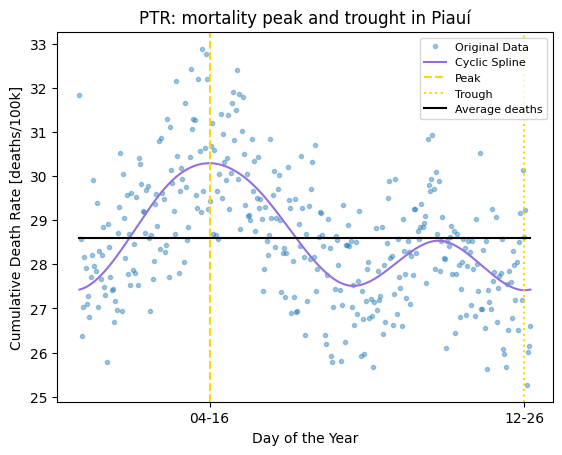

State: Pernambuco
PTR = 1.08
Peak day = 07-05, n_deaths = 36.74
Trough day = 10-23, n_deaths = 34.08


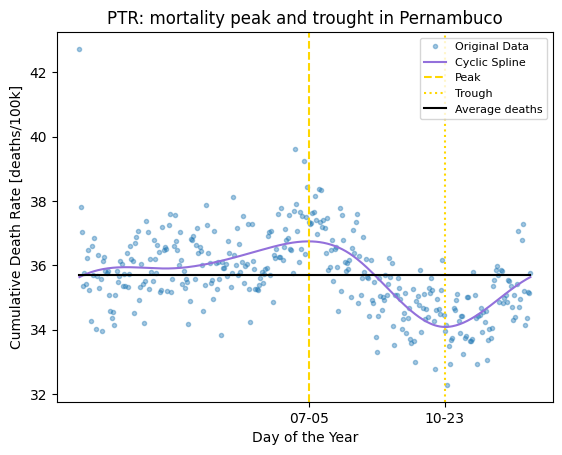

State: Acre
PTR = 1.06
Peak day = 03-20, n_deaths = 33.33
Trough day = 12-05, n_deaths = 31.53


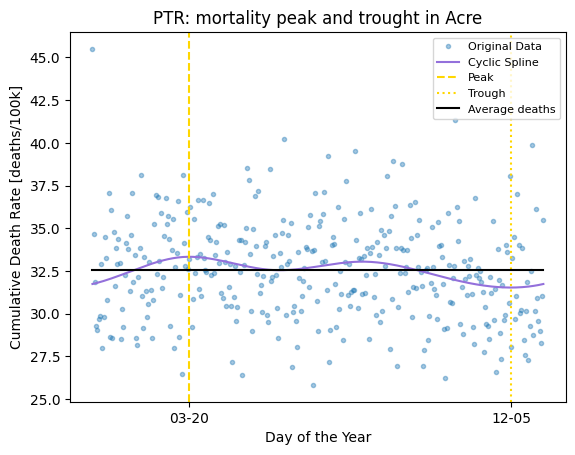

State: Alagoas
PTR = 1.1
Peak day = 06-28, n_deaths = 36.73
Trough day = 10-20, n_deaths = 33.43


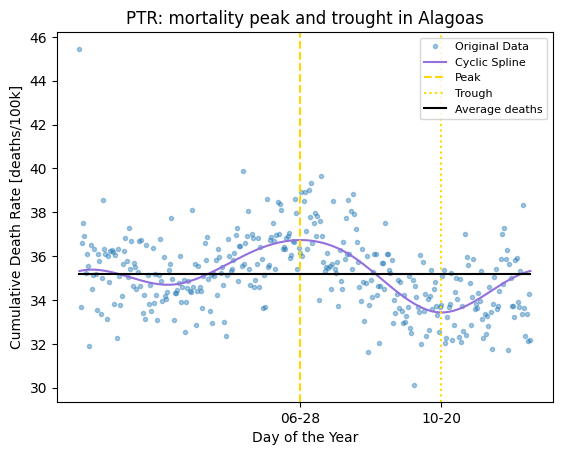

State: Tocantins
PTR = 1.04
Peak day = 03-18, n_deaths = 29.12
Trough day = 12-12, n_deaths = 27.93


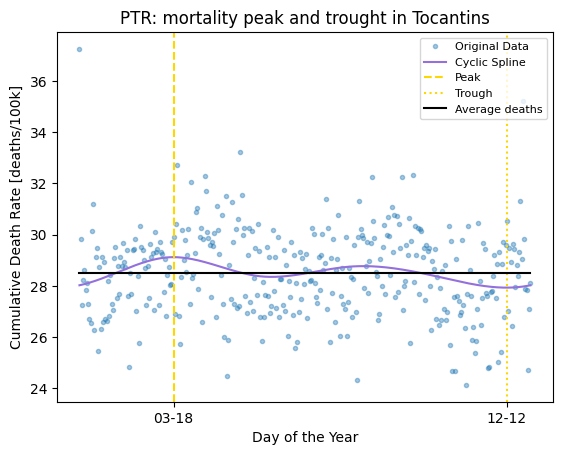

State: Sergipe
PTR = 1.09
Peak day = 06-24, n_deaths = 34.4
Trough day = 10-22, n_deaths = 31.63


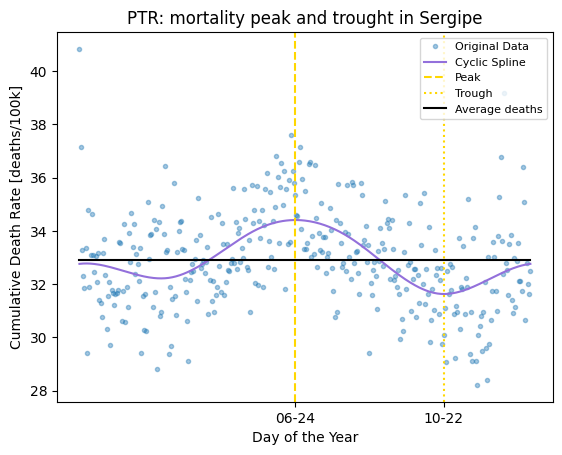

State: Rondônia
PTR = 1.03
Peak day = 04-02, n_deaths = 31.59
Trough day = 12-14, n_deaths = 30.6


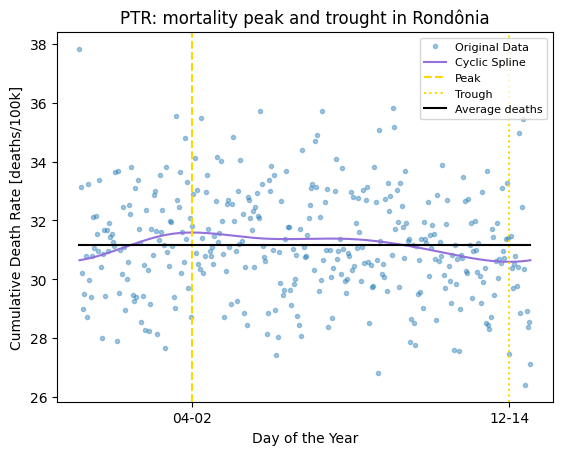

State: Mato Grosso
PTR = 1.07
Peak day = 08-06, n_deaths = 34.45
Trough day = 12-12, n_deaths = 32.11


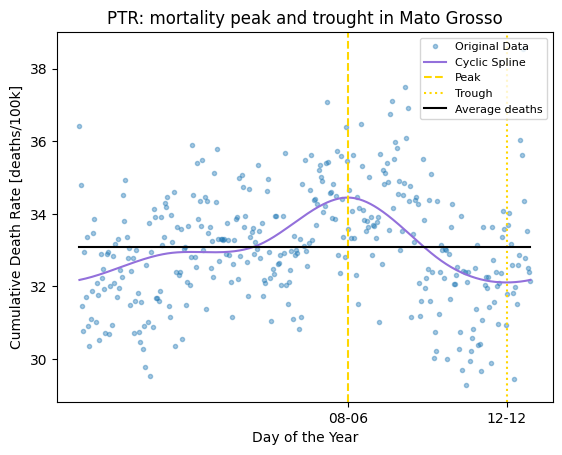

State: Bahia
PTR = 1.08
Peak day = 07-15, n_deaths = 29.78
Trough day = 10-26, n_deaths = 27.69


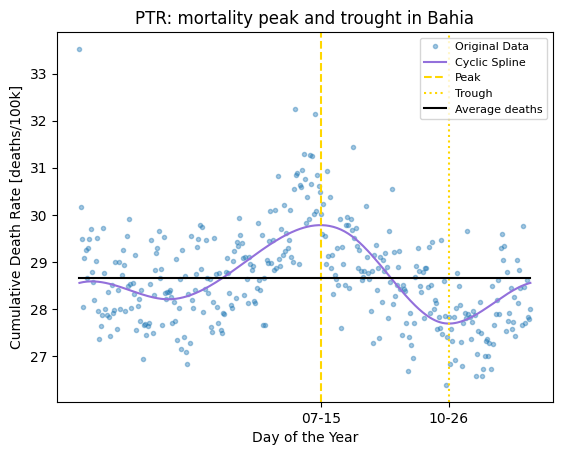

State: Distrito Federal
PTR = 1.07
Peak day = 07-02, n_deaths = 30.73
Trough day = 03-05, n_deaths = 28.78


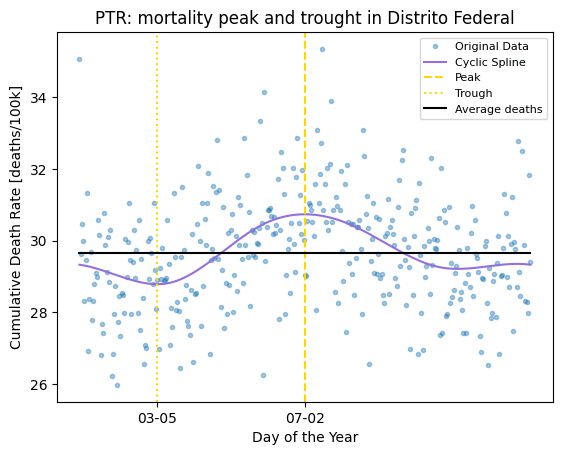

State: Goiás
PTR = 1.04
Peak day = 07-22, n_deaths = 33.16
Trough day = 01-14, n_deaths = 31.81


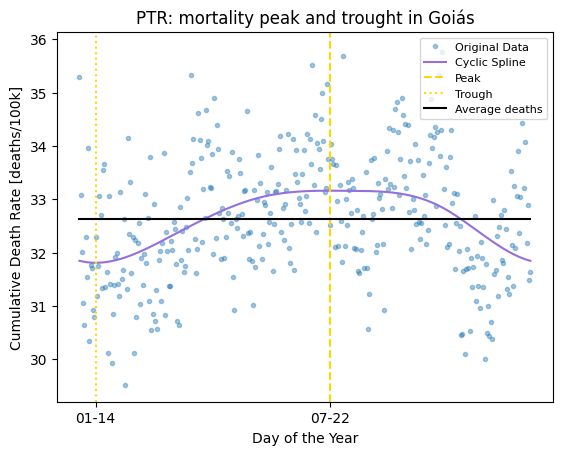

State: Minas Gerais
PTR = 1.14
Peak day = 07-16, n_deaths = 33.0
Trough day = 03-04, n_deaths = 28.92


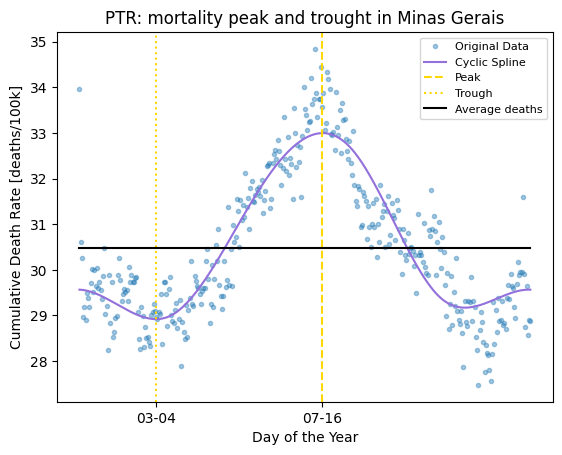

State: Espírito Santo
PTR = 1.08
Peak day = 07-22, n_deaths = 33.61
Trough day = 03-16, n_deaths = 31.16


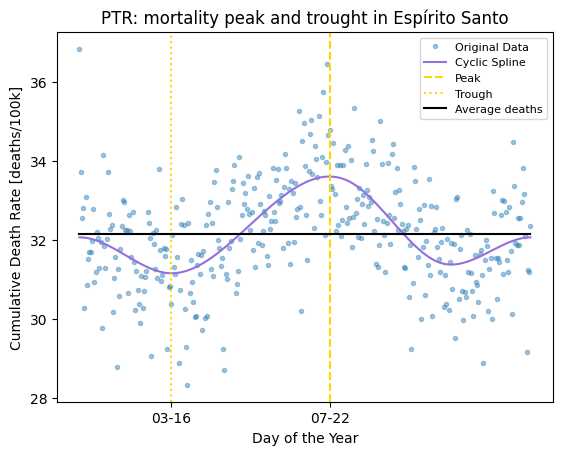

State: Mato Grosso do Sul
PTR = 1.13
Peak day = 07-27, n_deaths = 36.0
Trough day = 02-22, n_deaths = 31.78


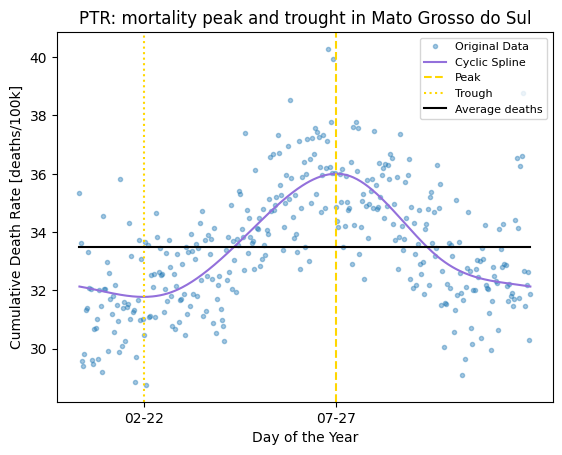

State: Rio de Janeiro
PTR = 1.1
Peak day = 07-12, n_deaths = 40.52
Trough day = 10-22, n_deaths = 36.73


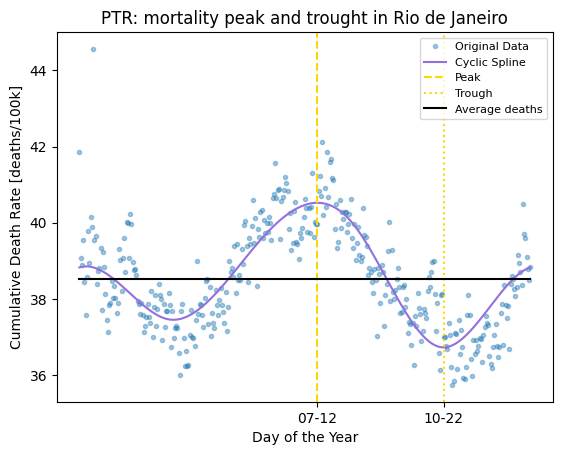

State: São Paulo
PTR = 1.16
Peak day = 07-09, n_deaths = 36.27
Trough day = 03-01, n_deaths = 31.31


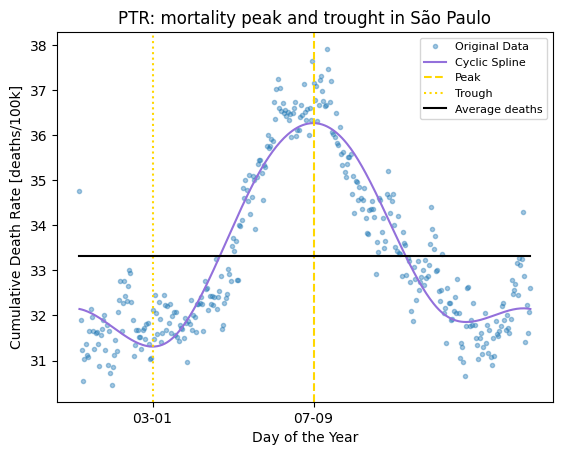

State: Paraná
PTR = 1.22
Peak day = 07-20, n_deaths = 37.82
Trough day = 03-03, n_deaths = 31.02


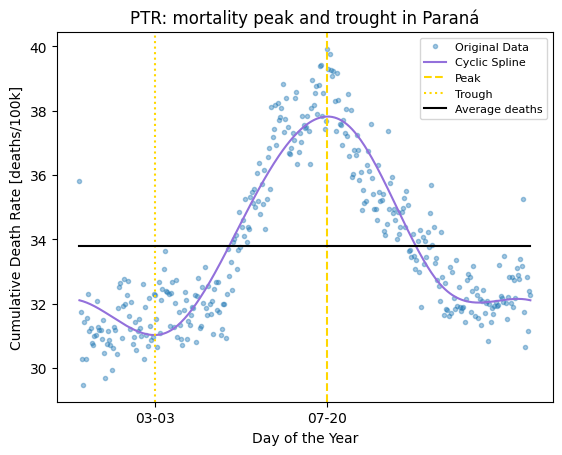

State: Santa Catarina
PTR = 1.22
Peak day = 07-27, n_deaths = 35.1
Trough day = 03-05, n_deaths = 28.81


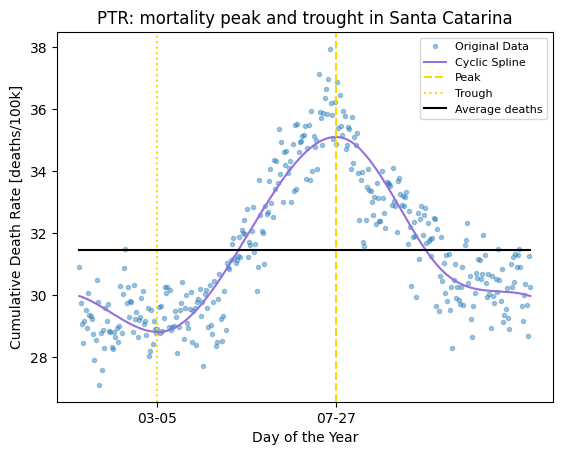

State: Rio Grande do Sul
PTR = 1.28
Peak day = 07-28, n_deaths = 38.31
Trough day = 03-11, n_deaths = 30.01


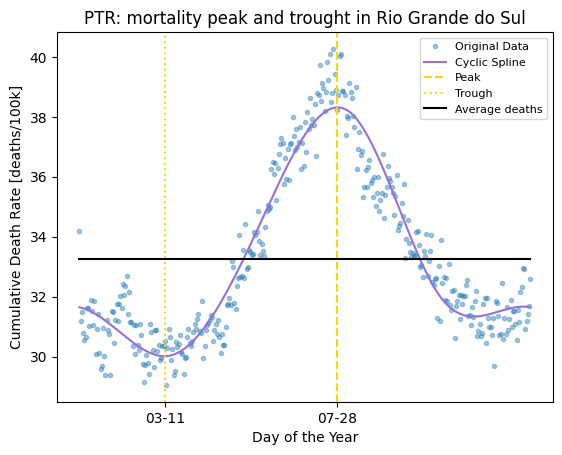

In [11]:
import statsmodels.api as sm
import joblib
# Statsmodels uses the same spline basis as patsy for Cyclic Cubic Splines
# https://patsy.readthedocs.io/en/latest/spline-regression.html#natural-and-cyclic-cubic-regression-splines
# https://www.statsmodels.org/dev/generated/statsmodels.gam.smooth_basis.CyclicCubicSplines.html
# https://www.statsmodels.org/dev/generated/statsmodels.regression.linear_model.OLS.from_formula.html

state_list = []
ptr_list = []
peak_day_list = []
peak_date_list = []
peak_deaths_list = []
trough_day_list = []
trough_date_list = []
trough_deaths_list = []

for state in states:

  data = df.copy()
  data = data[data['STATE']==state].drop(['STATE'], axis=1)
  data = data[['DT', 'DT_right', 'DT_numeric', death_column]].groupby(by=['DT', 'DT_right', 'DT_numeric']).sum().reset_index()

  # Read model
  spline_model = joblib.load(f'{models_path}/spline_states/{state}_spline.pkl')

  # Get predictions
  predictions = spline_model.predict(data) #needs a variable called DT_numeric to predict
  data['predictions'] = predictions

  # Calculate stats
  max_value = data[data['predictions']==data['predictions'].max()]
  min_value = data[data['predictions']==data['predictions'].min()]
  avg_value = data.predictions.mean()
  data['relative_risk'] = data['predictions'] / avg_value
  peak_day = max_value.DT_numeric.values[0]
  trough_day = min_value.DT_numeric.values[0]
  peak_date = max_value.DT_right.values[0]
  trough_date = min_value.DT_right.values[0]
  peak_deaths = max_value['predictions'].values[0]
  trough_deaths = min_value['predictions'].values[0]
  ptr = peak_deaths/trough_deaths

  # Print the results
  print(BOLD+f'State: {state_dict[state]}'+END)
  print(BOLD+f'PTR = {round(ptr,2)}'+END)
  # print(f'Peak day = {peak_date}, n_deaths = {round(peak_deaths,2)}')
  # print(f'Trough day = {trough_date}, n_deaths = {round(trough_deaths,2)}')
  print(f'Peak day = {str(peak_date)[:10]}, n_deaths = {round(peak_deaths,2)}')
  print(f'Trough day = {str(trough_date)[:10]}, n_deaths = {round(trough_deaths,2)}')

  # Save the results
  state_list.append(state)
  ptr_list.append(ptr)
  peak_day_list.append(peak_day)
  peak_date_list.append(peak_date)
  peak_deaths_list.append(peak_deaths)
  trough_day_list.append(trough_day)
  trough_date_list.append(trough_date)
  trough_deaths_list.append(trough_deaths)

  # Set subplot
  # fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,6))
  fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6.4,4.8))

  # Plot the results
  ax.plot(data['DT_right'], data[death_column], 'o', alpha=0.4, ms=3, label='Original Data')
  ax.plot(data['DT_right'], predictions, color='mediumpurple', label='Cyclic Spline')
  ax.axvline(x=max_value.DT_right.values[0], color='gold', ls='--', label='Peak') #peak
  ax.axvline(x=min_value.DT_right.values[0], color='gold', ls=':', label='Trough') #trough
  ax.plot(data['DT_right'], [avg_value]*len(data['DT_right']), color='black', label='Average deaths')
  ax.set_title(f'PTR: mortality peak and trought in {state_dict[state]}')
  ax.set_xlabel('Day of the Year')
  ax.set_ylabel('Cumulative Death Rate [deaths/100k]')
  ax.set_xticks([peak_day, trough_day])
  ax.legend(loc='upper right', fontsize=8)

  # Plot the relative risk
  # ax.plot(data['DT'], data['relative_risk'])
  # ax.plot(data['DT'], [1]*len(data['DT']), color='black')
  # ax.set_title(f'{state} - Relative risk')
  # ax.set_xlabel('Date')
  # ax.set_ylabel('Relative Risk')
  # ax.set_ylim(2-ptr, ptr)

  plt.show()

## PTR by state

### Calculating

In [12]:
import statsmodels.api as sm
import joblib
# Statsmodels uses the same spline basis as patsy for Cyclic Cubic Splines
# https://patsy.readthedocs.io/en/latest/spline-regression.html#natural-and-cyclic-cubic-regression-splines
# https://www.statsmodels.org/dev/generated/statsmodels.gam.smooth_basis.CyclicCubicSplines.html
# https://www.statsmodels.org/dev/generated/statsmodels.regression.linear_model.OLS.from_formula.html

state_list = []
ptr_list = []
peak_day_list = []
peak_date_list = []
peak_deaths_list = []
trough_day_list = []
trough_date_list = []
trough_deaths_list = []
#data containing the time series
ts_observed = None
ts_predicted = None

for state in states:

  data = df.copy()
  data = data[data['STATE']==state].drop(['STATE'], axis=1)
  data = data[['DT', 'DT_right', 'DT_numeric', death_column]].groupby(by=['DT', 'DT_right', 'DT_numeric']).sum().reset_index()

  # Read model
  spline_model = joblib.load(f'{models_path}/spline_states/{state}_spline.pkl')

  # Get predictions
  predictions = spline_model.predict(data) #needs a variable called DT_numeric to predict
  data['predictions'] = predictions

  # Save the time series
  data_observed = data[['DT', 'DEATHS_STANDARDIZED_BR']].set_index('DT')
  data_observed.columns = [state]
  data_predicted = data[['DT', 'predictions']].set_index('DT')
  data_predicted.columns = [state]
  if ts_observed is None:
    ts_observed = data_observed
    ts_predicted = data_predicted
  else:
    ts_observed = pd.merge(ts_observed, data_observed, how='inner',
                                    left_index=True, right_index=True)
    ts_predicted = pd.merge(ts_predicted, data_predicted, how='inner',
                                    left_index=True, right_index=True)

  # Calculate stats
  max_value = data[data['predictions']==data['predictions'].max()]
  min_value = data[data['predictions']==data['predictions'].min()]
  avg_value = data.predictions.mean()
  data['relative_risk'] = data['predictions'] / avg_value
  peak_day = max_value.DT_numeric.values[0]
  trough_day = min_value.DT_numeric.values[0]
  peak_date = max_value.DT_right.values[0]
  trough_date = min_value.DT_right.values[0]
  peak_deaths = max_value['predictions'].values[0]
  trough_deaths = min_value['predictions'].values[0]
  ptr = peak_deaths/trough_deaths

  # Print the results
  print(BOLD+f'State: {state_dict[state]}'+END)
  print(BOLD+f'PTR = {round(ptr,2)}'+END)
  # print(f'Peak day = {peak_date}, n_deaths = {round(peak_deaths,2)}')
  # print(f'Trough day = {trough_date}, n_deaths = {round(trough_deaths,2)}')
  print(f'Peak day = {str(peak_date)[:10]}, n_deaths = {round(peak_deaths,2)}')
  print(f'Trough day = {str(trough_date)[:10]}, n_deaths = {round(trough_deaths,2)}')

  # Save the results
  state_list.append(state)
  ptr_list.append(ptr)
  peak_day_list.append(peak_day)
  peak_date_list.append(peak_date)
  peak_deaths_list.append(peak_deaths)
  trough_day_list.append(trough_day)
  trough_date_list.append(trough_date)
  trough_deaths_list.append(trough_deaths)

# Save stats in dataframe
ptr_df = pd.DataFrame({'state':state_list,
                       'PTR':ptr_list,
                       'peak_day':peak_day_list,
                       'peak_date':peak_date_list,
                       'peak_deaths':peak_deaths_list,
                       'trough_day':trough_day_list,
                       'trough_date':trough_date_list,
                       'trough_deaths':trough_deaths_list})
ptr_df.to_csv(f"{path}measures/ptr_by_state.csv", index=False)

#Dictionary to convert dates to numeric
date_dict = pd.Series(data['DT_numeric'].values, index=data['DT_right']).to_dict()

State: Roraima
PTR = 1.18
Peak day = 07-16, n_deaths = 34.25
Trough day = 03-03, n_deaths = 29.12
State: Amapá
PTR = 1.11
Peak day = 04-20, n_deaths = 30.97
Trough day = 12-21, n_deaths = 28.01
State: Maranhão
PTR = 1.11
Peak day = 04-02, n_deaths = 27.9
Trough day = 11-27, n_deaths = 25.02
State: Amazonas
PTR = 1.07
Peak day = 04-02, n_deaths = 31.19
Trough day = 12-08, n_deaths = 29.12
State: Ceará
PTR = 1.13
Peak day = 04-12, n_deaths = 31.6
Trough day = 09-04, n_deaths = 27.92
State: Rio Grande do Norte
PTR = 1.11
Peak day = 04-26, n_deaths = 29.25
Trough day = 11-11, n_deaths = 26.42
State: Pará
PTR = 1.08
Peak day = 04-04, n_deaths = 30.46
Trough day = 11-28, n_deaths = 28.2
State: Paraíba
PTR = 1.1
Peak day = 06-04, n_deaths = 31.73
Trough day = 11-06, n_deaths = 28.93
State: Piauí
PTR = 1.1
Peak day = 04-16, n_deaths = 30.29
Trough day = 12-26, n_deaths = 27.41
State: Pernambuco
PTR = 1.08
Peak day = 07-05, n_deaths = 36.74
Trough day = 10-23, n_deaths = 34.08
State: Acre
PTR =

### Visualizing

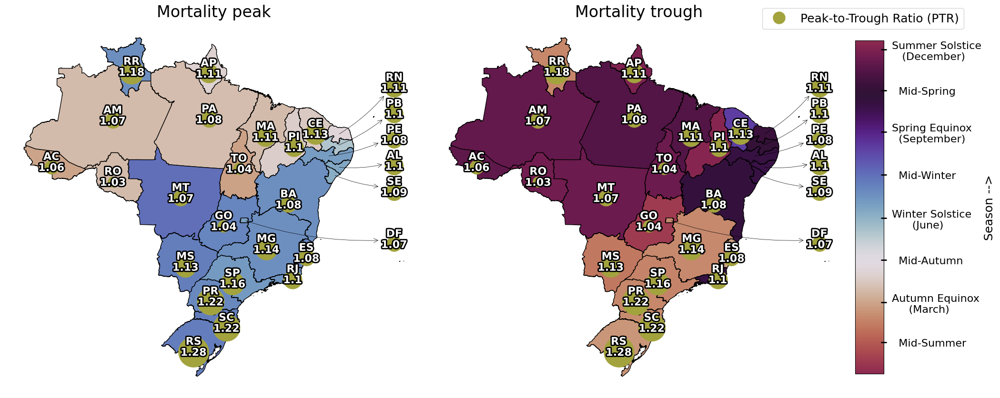

In [13]:
# Create a GeoDataFrame for peaks and troughs
data = pd.read_csv(f"{path}measures/ptr_by_state.csv")

# Read Brazil state data
br = read_state(year=2020)
# Dictionary to correct state names
dic = {'Amazônas': 'Amazonas', 'Rio Grande Do Norte': 'Rio Grande do Norte',
       'Rio De Janeiro': 'Rio de Janeiro', 'Rio Grande Do Sul': 'Rio Grande do Sul',
       'Mato Grosso Do Sul': 'Mato Grosso do Sul'}
br.name_state = br.name_state.map(dic).fillna(br.name_state)

# Merge peak and trough data with the GeoDataFrame
br_df = br.merge(data, left_on='abbrev_state', right_on='state')
br_df['coords'] = br_df['geometry'].apply(lambda x: x.representative_point().coords[:])
br_df['coords'] = [coords[0] for coords in br_df['coords']]

# Getting seasons dates
summer_solstice_day, autumn_equinox_day, winter_solstice_day, spring_equinox_day = \
 date_dict['12-21'], date_dict['03-20'], date_dict['06-20'], date_dict['09-22']
mid_summer_day = ((summer_solstice_day-364) + autumn_equinox_day)/2
mid_autumn_day = (autumn_equinox_day + winter_solstice_day)/2
mid_winter_day = (winter_solstice_day + spring_equinox_day)/2
mid_spring_day = (spring_equinox_day + summer_solstice_day)/2

# Define the colormap and normalizer
cmap = plt.get_cmap('twilight_shifted_r')
norm = mcolors.Normalize(vmin=0, vmax=45)
# Shift the colormap and normalizer
def cyclic_norm(value, n=60):
    if value+n<=364: return value+n
    else: return value+n-364
for i in range(364+1):
    norm.vmin = min(norm.vmin, cyclic_norm(i))
    norm.vmax = max(norm.vmax, cyclic_norm(i))
cmap = mcolors.LinearSegmentedColormap.from_list("twilight_shifted_cyclic",
                                                 [cmap(norm(cyclic_norm(i))) for i in range(365)])

# Plotting both datasets side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), sharey=True)
arrow_positions = {'RN':(-30, -0), 'PB':(-30, -3),'PE':(-30, -6),'AL':(-30, -9),'SE':(-30, -12),
                           'DF':(-30, -18)}
circle_color='#a3a33e'
circle_size=7500

# Define a function to plot each state with scatter points and colorbar
def plot_states(data, column, ax, title):
    data.plot(column=column, cmap=cmap, norm=norm, legend=False, edgecolor='black', ax=ax)

    offset=1
    for idx, row in data.iterrows():
        state_annotation = f"{row['abbrev_state']}"
        measure_annotation = f"{round(row['PTR'],2)}"
        # measure_annotation = f"PTR: {round(row['PTR'],2)}"
        if not np.isnan(row['PTR']):
            if row['abbrev_state'] in arrow_positions.keys():
                # Mark the ammount of seasonality
                ax.scatter(arrow_positions[row['abbrev_state']][0],
                           arrow_positions[row['abbrev_state']][1]-offset/2,
                           s=(row['PTR']-1)*circle_size, color=circle_color, alpha=1)
                # Annotate state abbreviation and measure
                ax.annotate(f'{state_annotation}\n{measure_annotation}',
                            xy=row['coords'],
                            xytext=arrow_positions[row['abbrev_state']],  # Text is now at the position of the arrow
                            arrowprops=dict(arrowstyle="<-", lw=0.5, color='black',
                                            connectionstyle="arc3,rad=-0.1"),
                            ha='center', va='center',
                            weight='bold', fontsize=16,
                            color='white', path_effects=[
                            withStroke(linewidth=4, foreground="black")
                ])
            else:
                # Mark the ammount of seasonality
                ax.scatter(row['coords'][0],
                           row['coords'][1]-offset/2,
                           s=(row['PTR']-1)*circle_size, color=circle_color, alpha=1)
                # Annotate state abbreviation and measure
                ax.annotate(f'{state_annotation}\n{measure_annotation}',
                            xy=row['coords'],
                            ha='center', va='center',
                            weight='bold', fontsize=16,
                            color='white', path_effects=[
                            withStroke(linewidth=4, foreground="black")
                ])

    # Add title and remove axis
    ax.set_title(title, fontsize=24)
    ax.axis('off')

# Plot peaks on the left
plot_states(br_df, 'peak_day', ax1, 'Mortality peak')

# Plot troughs on the right
plot_states(br_df, 'trough_day', ax2, 'Mortality trough')

# Adding a shared color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical',
                    ticks=[summer_solstice_day, autumn_equinox_day, winter_solstice_day, spring_equinox_day,
                           mid_summer_day, mid_autumn_day, mid_winter_day, mid_spring_day])
cbar.set_ticklabels(['Summer Solstice\n   (December)', 'Autumn Equinox\n     (March)',
                     'Winter Solstice\n      (June)', 'Spring Equinox\n  (September)',
                     '  Mid-Summer', '  Mid-Autumn', '  Mid-Winter', '  Mid-Spring'])
# cbar.set_ticklabels(['Summer Solstice\n(≈12-21)', 'Autumn Equinox\n(≈03-21)',
#                      'Winter Solstice\n(≈06-21)', 'Spring Equinox\n(≈09-21)',
#                      'Mid-Summer', 'Mid-Autumn', 'Mid-Winter', 'Mid-Spring'])
cbar.ax.tick_params(labelsize=16, width=2, length=8, direction='inout', pad=8, labelcolor='black')
cbar.set_label('Season -->', fontsize=18)

# Adding a shared legend
legend_elements = [plt.Line2D([], [], marker='o', color='w', label='Peak-to-Trough Ratio (PTR)',
                               markerfacecolor=circle_color, markersize=20)]
fig.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.02, 0.93), fontsize=18)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

## PTR clustering

In [14]:
data = pd.read_csv(f"{path}measures/ptr_by_state.csv").set_index('state')
data = data[['PTR', 'peak_day', 'trough_day']]
cluster_data = MinMaxScaler().fit_transform(data.fillna(0))
cluster_data.shape

(27, 3)

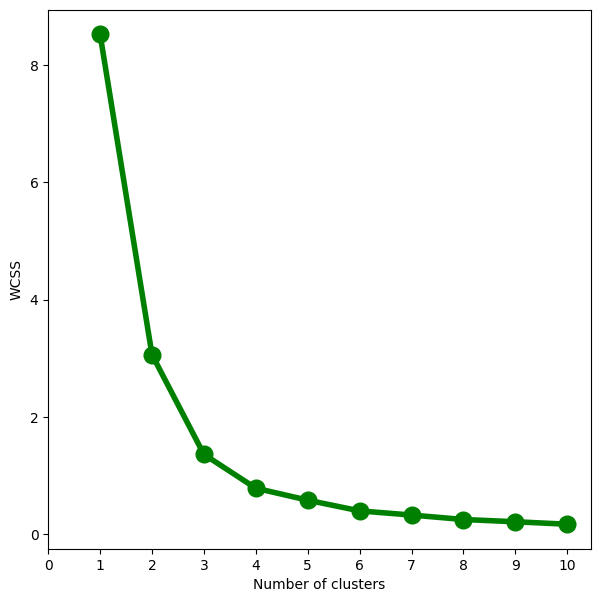

[8.530408089358465, 3.0609397336486, 1.3583687677282275, 0.7805215266063639, 0.5765604536993764, 0.3935962802103412, 0.32274899516896394, 0.24656878647941266, 0.2080501732024102, 0.16607362981090162]


In [15]:
# KNN: finding optimal number of clusters using elbow rule
WCSS = []
for i in range(1,11):
    model = KMeans(n_clusters=i,init='k-means++', random_state=42)
    model.fit(cluster_data)
    WCSS.append(model.inertia_)
fig = plt.figure(figsize = (7,7))
plt.plot(range(1,11), WCSS, linewidth=4, markersize=12, marker='o',color = 'green')
plt.xticks(np.arange(11))
plt.xlabel("Number of clusters")
plt.ylabel("WCSS")
plt.show()
print(WCSS)

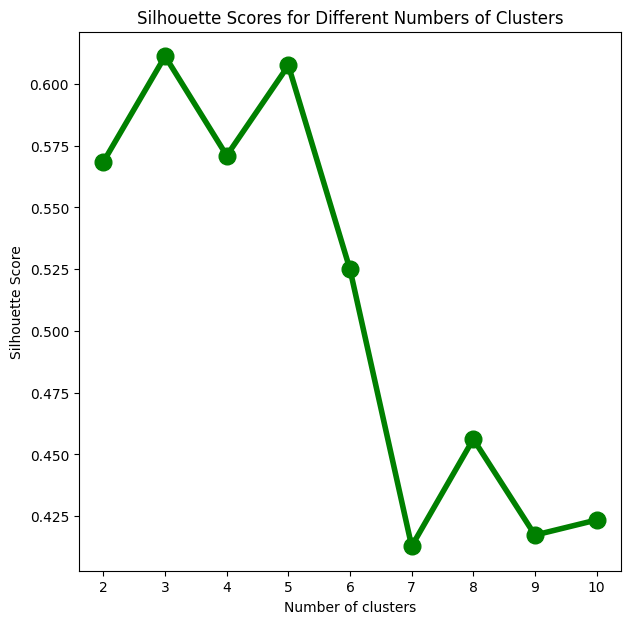

[0.5685078163856072, 0.6112359256347816, 0.5710055813981805, 0.607497185586624, 0.5248915523681265, 0.4128604488984, 0.45622877665743355, 0.4173678840647727, 0.4234844800398054]


In [16]:
# KNN: finding optimal number of clusters using Silhouette Score
from sklearn.metrics import silhouette_score
silhouette_scores = []
for i in range(2, 11):
    model = KMeans(n_clusters=i, init='k-means++', random_state=42)
    cluster_labels = model.fit_predict(cluster_data)
    score = silhouette_score(cluster_data, cluster_labels)
    silhouette_scores.append(score)

fig = plt.figure(figsize=(7,7))
plt.plot(range(2,11), silhouette_scores, linewidth=4, markersize=12, marker='o', color='green')
plt.xticks(np.arange(2,11))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different Numbers of Clusters")
plt.show()
print(silhouette_scores)

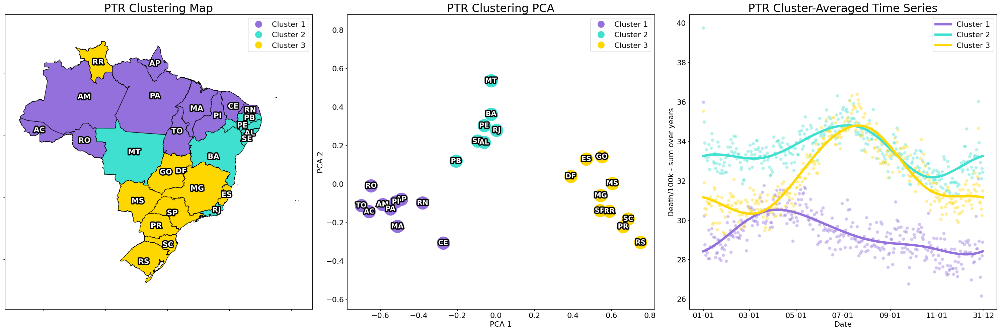

In [17]:
n=3

#https://matplotlib.org/stable/gallery/color/named_colors.html
colors = {2:['mediumpurple', 'gold'],
          3:['mediumpurple', 'turquoise', 'gold']}

#fitting chosen model
model = KMeans(n_clusters=n, init="k-means++", max_iter=300, n_init=10, random_state=42)
y_clusters = model.fit_predict(cluster_data)

#calculate clustering PCA
from sklearn.decomposition import PCA
pca = PCA(2)
data_cluster_pca = pca.fit_transform(cluster_data)
data_cluster_pca = np.concatenate((data_cluster_pca, y_clusters.reshape(-1,1),
                                   np.array(data.index).reshape(-1,1)), axis=1)
data_cluster_pca = pd.DataFrame(data_cluster_pca,
                                columns=['x', 'y', 'cluster', 'state'])

# Define each cluster from the 3 main states
cluster_sp = data_cluster_pca.loc[data_cluster_pca['state'] == 'SP', 'cluster'].iloc[0]
cluster_rj = data_cluster_pca.loc[data_cluster_pca['state'] == 'RJ', 'cluster'].iloc[0]
cluster_ce = data_cluster_pca.loc[data_cluster_pca['state'] == 'CE', 'cluster'].iloc[0]

# Update the entire cluster based on the state
data_cluster_pca.loc[data_cluster_pca['cluster'] == cluster_sp, 'cluster'] = '2'
data_cluster_pca.loc[data_cluster_pca['cluster'] == cluster_rj, 'cluster'] = '1'
data_cluster_pca.loc[data_cluster_pca['cluster'] == cluster_ce, 'cluster'] = '0'
data_cluster_pca['cluster'] = data_cluster_pca['cluster'].astype(int)

# Sort clusters
data_cluster_pca = data_cluster_pca.sort_values(by='cluster')

import geopandas as gpd
from geobr import read_state
# Read Brazil state data
br = read_state(year=2020)
# Dictionary to correct state names
dic = {'Amazônas': 'Amazonas', 'Rio Grande Do Norte': 'Rio Grande do Norte',
       'Rio De Janeiro': 'Rio de Janeiro', 'Rio Grande Do Sul': 'Rio Grande do Sul',
       'Mato Grosso Do Sul': 'Mato Grosso do Sul'}
br.name_state = br.name_state.map(dic).fillna(br.name_state)
br['coords'] = br['geometry'].apply(lambda x: x.representative_point().coords[:])
br['coords'] = [coords[0] for coords in br['coords']]
# Merge with pca data
br_df = br.merge(data_cluster_pca[['cluster', 'state']], left_on='abbrev_state', right_on='state')

#viridis is colorblind-friendly
#https://www.cta-observatory.org/wp-content/uploads/2020/10/CTA_ColourBlindness_BestPractices-1.pdf

from matplotlib.gridspec import GridSpec
import matplotlib.dates as mdates
from matplotlib.lines import Line2D
from matplotlib.patheffects import withStroke

ticks_fontsize=16
legend_fontsize=16
axlabel_fontsize = 16
title_fontsize=24

# Set up the figure and GridSpec
fig = plt.figure(figsize=(30, 10))
gs = GridSpec(1, 3, figure=fig)

# Plot 1 - clustering map
from matplotlib.colors import ListedColormap
ax1 = fig.add_subplot(gs[0, 0])
br_df.plot(column='cluster', legend=False, edgecolor='black', ax=ax1,
           cmap=ListedColormap(colors[n]))
# Create annotations
for idx, row in br.iterrows():
    plt.annotate(row['abbrev_state'], xy=row['coords'],
                 ha='center', va='center',
                 weight='bold', fontsize=legend_fontsize,
                 color='white', path_effects=[
                 withStroke(linewidth=5, foreground="black")
                  ])
# Add the custom legend
legend_elements = [Line2D([], [], marker='o', color='w', label='Cluster {}'.format(i+1),
                          markerfacecolor=colors[n][i], markersize=legend_fontsize) for i in range(n)]
ax1.legend(handles=legend_elements, loc='upper right', fontsize=legend_fontsize)

# Add title and labels
ax1.set_title('PTR Clustering Map', fontsize=title_fontsize)
# ax1.set_xlabel('Longitude', fontsize=axlabel_fontsize)
# ax1.set_ylabel('Latitude', fontsize=axlabel_fontsize)
# ax1.tick_params(axis='x', labelsize=ticks_fontsize)
# ax1.tick_params(axis='y', labelsize=ticks_fontsize)
ax1.tick_params(labelbottom=False, labelleft=False)
ax1.axis('equal')

# Plot 2 - clustering PCA
ax2 = fig.add_subplot(gs[0, 1])
for i in range(n):
    new_cluster_data = data_cluster_pca[data_cluster_pca['cluster'] == i]
    ax2.scatter(new_cluster_data['x'], new_cluster_data['y'], label=f'Cluster {i}',
                color=colors[n][i], s=750)
    # Center the text annotations for states
    for i, row in new_cluster_data.iterrows():
        ax2.text(row['x'], row['y'], str(row['state']),
                 horizontalalignment='center', verticalalignment='center',
                 color='white', path_effects=[withStroke(linewidth=5, foreground="black")],
                 fontsize=15, fontweight='bold')
# Add title and labels
ax2.set_title('PTR Clustering PCA', fontsize=title_fontsize)
legend_elements = [Line2D([], [], marker='o', color='w', label='Cluster {}'.format(i+1),
                          markerfacecolor=colors[n][i], markersize=legend_fontsize) for i in range(n)]
ax2.legend(handles=legend_elements, fontsize=legend_fontsize)
# ax2.legend(fontsize=legend_fontsize)
ax2.set_xlabel('PCA 1', fontsize=axlabel_fontsize)
ax2.set_ylabel('PCA 2', fontsize=axlabel_fontsize)
ax2.axis('equal')
ax2.tick_params(axis='x', labelsize=ticks_fontsize)
ax2.tick_params(axis='y', labelsize=ticks_fontsize)

# Plot 3 - Comparing mean values
ax3 = fig.add_subplot(gs[0, 2])
for i in range(n):
    cluster_cols = data_cluster_pca[data_cluster_pca.cluster == i].state
    mean_observed = ts_observed[cluster_cols].mean(axis=1)
    mean_predicted = ts_predicted[cluster_cols].mean(axis=1)
    sns.lineplot(data=mean_predicted, color=colors[n][i],
                 label=f'Cluster {i+1}', linewidth=5, ax=ax3)
    sns.scatterplot(data=mean_observed, color=colors[n][i], alpha=0.4, s=50, ax=ax3)
# Change xlabels and remove last one - next year
ax3.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
xtick_labels = ax3.get_xticklabels()
if xtick_labels: xtick_labels[-1].set_text('31-12')
ax3.set_xticklabels(xtick_labels)
# Title, labels, and ticks
ax3.set_title('PTR Cluster-Averaged Time Series', fontsize=title_fontsize)
ax3.legend(fontsize=legend_fontsize)
ax3.set_xlabel('Date', fontsize=axlabel_fontsize)
ax3.set_ylabel('Death/100k - sum over years', fontsize=axlabel_fontsize)
ax3.tick_params(axis='x', labelsize=ticks_fontsize)
ax3.tick_params(axis='y', labelsize=ticks_fontsize)

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

In [18]:
for i in range(2+1):
  print(f"ptr_cluster_{i+1} = {[x for x in data_cluster_pca[data_cluster_pca.cluster==i]['state']]}")

ptr_cluster_1 = ['AP', 'MA', 'AM', 'CE', 'RN', 'PA', 'PI', 'AC', 'RO', 'TO']
ptr_cluster_2 = ['SE', 'BA', 'MT', 'PE', 'AL', 'RJ', 'PB']
ptr_cluster_3 = ['SP', 'PR', 'MS', 'RR', 'MG', 'GO', 'DF', 'SC', 'ES', 'RS']


# EWDi

Similarly to the PTR, we calculate, visualize, and cluster seasonality using the Excess Winter Death index (EWDi) metric. The EWDi is a very simple and straight-up metric that quantifies the excess winter death compared to the other seasons:

$$ EWDi = \frac{Winter \, Deaths - Expected \, Winter \, Deaths}{Expected \, Winter \, Deaths} $$

The index defines a winter of 4-month length and for the southern hemisphere, the equation is:

$$ EWDi = \frac{Deaths \, (Jun\rightarrow Sep) - 0.5 \, Deaths (Feb\rightarrow May, Oct\rightarrow Jan)}{0.5 \, Deaths (Feb\rightarrow May, Oct\rightarrow Jan)} $$

Although often used, this metric is very limited since it depends on assumptions that excess mortality primarily occurs in winter (position constraint) and that the length of winter is consistent across regions (length constraint), which is often not the case.

Additionally, the EWDi can reveal the underlying causes of death contributing to this seasonality. We, therefore, visualize the percentage contribution to the excess winter mortality by cause of death by the state in Brazil.

Here, we see a pattern that is very different from the one we saw with the PTR. This simple metric fails to capture the seasonal mortality patterns across regions correctly. It is a reasonable metric for the southern states, which have temperate climates and values similar to those of some European countries. However, in the northern states, the fact that some states have negative values shows the failure of the metric, showing that the seasonality is in a state different from winter, and, in fact, there is less seasonality in winter than in the rest of the year. Other states have minimal values because the larger seasonality is not in winter. In reality, the climate in those states is very different from the southern states, without a defined winter, and the year is marked by a dry and a wet season rather than due to temperature differences.

Moreover, the causes of death contributing to this seasonality are also inconsistent in the northern states, with external causes of morbidity as the primary contributor. In the southern states, we see diseases of the circulatory and respiratory system as the main contributors, which is in line with the current literature that identifies those two causes as the drivers of the seasonal variation in mortality.

Yet, the clustering reveals three regions similar to the PTR. Still, they differ slightly, with the northern region having slightly less seasonality than the central one and the states belonging to each cluster being slightly different.

## In Brazil

In [ ]:
death_column = 'DEATHS_STANDARDIZED_BR'
data = df.copy()[['DT', death_column]]
winter_count = data[data.DT.dt.month.isin([6,7,8,9])][death_column].sum()
non_winter_count = data[~data.DT.dt.month.isin([6,7,8,9])][death_column].sum()
ewdi = (winter_count - 0.5*non_winter_count)/(0.5*non_winter_count)
ewdi

0.04390742534954344

## Calculating EWDi

### EWDi by country in Europe

From article "Excess winter deaths in 30 European countries 1980-2013: a critical review of methods"; Liddel et al., 2016.

In [ ]:
# Calculating

europe_ewdi = {
    'Malta': 29.4,
    'Portugal': 28.0,
    'Cyprus': 23.6,
    'Spain': 20.6,
    'Ireland': 19.7,
    'United Kingdom': 18.6,
    'Greece': 17.9,
    'Bulgaria': 17.8,
    'Romania': 17.5,
    'Italy': 16.0,
    'Switzerland': 14.2,
    'France': 13.8,
    'Belgium': 13.6,
    'Sweden': 13.3,
    'Austria': 13.2,
    'Slovenia': 13.2,
    'Hungary': 12.3,
    'Denmark': 12.2,
    'Norway': 12.1,
    'Netherlands': 11.8,
    'Germany': 11.7,
    'Poland': 11.7,
    'Latvia': 11.5,
    'Lithuania': 11.5,
    'Luxembourg': 11.2,
    'Estonia': 10.9,
    'Czechia': 10.8,
    'Finland': 9.5,
    'Iceland': 8.4,
    'Slovakia': 8.2
}
europe_ewdi = pd.DataFrame.from_dict(europe_ewdi, orient='index').reset_index()
europe_ewdi.columns = ['country', 'number']
europe_ewdi.to_csv(f"{path}measures/ewdi_europe.csv", index=False)

### EWDi by state in Brazil

In [ ]:
# Calculating

death_column = 'DEATHS_STANDARDIZED_BR'
data = df.copy()[['DT', 'STATE', death_column]]
data['STATE'] = data['STATE'].map(state_dict)
winter_count = data[data.DT.dt.month.isin([6,7,8,9])][['STATE', death_column]].groupby(by='STATE').sum()
non_winter_count = data[~data.DT.dt.month.isin([6,7,8,9])][['STATE', death_column]].groupby(by='STATE').sum()
ewdi = (winter_count - 0.5*non_winter_count)/(0.5*non_winter_count)
ewdi = ewdi.reset_index()
ewdi.columns = ['state', 'number']
ewdi.to_csv(f"{path}measures/ewdi_by_state.csv", index=False)

## EWDi in Brazilian states vs European countries

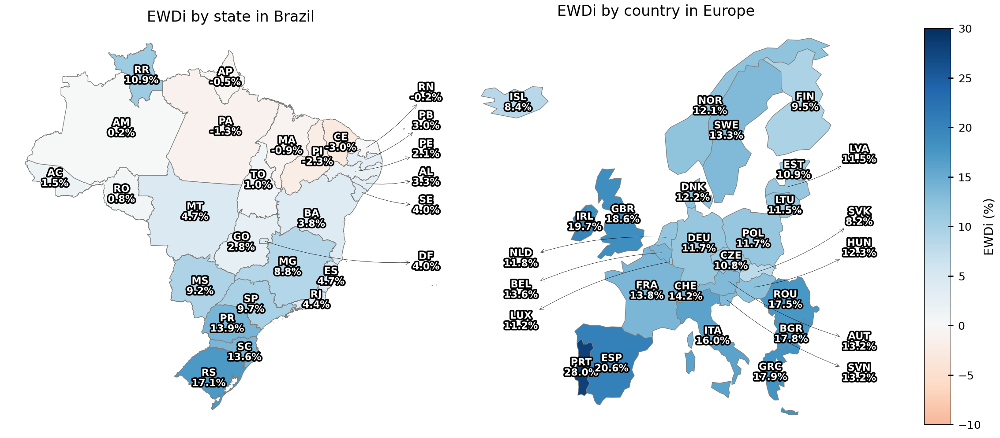

In [ ]:
# Reading data
brazil_data = pd.read_csv(f"{path}measures/ewdi_by_state.csv")
brazil_data['number'] = brazil_data['number']*100
europe_data = pd.read_csv(f"{path}measures/ewdi_europe.csv")

def preprocess_gdf(gdf, data, key_left, key_right):
  gdf = gdf.merge(data, left_on=key_left, right_on=key_right, how='left')
  gdf['coords'] = gdf['geometry'].apply(lambda x: x.representative_point().coords[:])
  gdf['coords'] = [coords[0] for coords in gdf['coords']]
  return gdf

# Preprocessing Brazil
brazil = read_state(year=2020)
dic = {'Amazônas': 'Amazonas', 'Rio Grande Do Norte': 'Rio Grande do Norte',
       'Rio De Janeiro': 'Rio de Janeiro', 'Rio Grande Do Sul': 'Rio Grande do Sul',
       'Mato Grosso Do Sul': 'Mato Grosso do Sul'}
brazil.name_state = brazil.name_state.map(dic).fillna(brazil.name_state)
brazil = preprocess_gdf(brazil, brazil_data, 'name_state', 'state')

# Preprocessing Europe
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
europe = world[(world.continent=='Europe')&(world.name!='Russian')]
polygon = Polygon([(-25,35), (40,35), (40,75),(-25,75)])
europe = gpd.clip(europe, polygon)
europe = preprocess_gdf(europe, europe_data, 'name', 'country')

# Define the colormap and normalizer
divnorm = mcolors.TwoSlopeNorm(vmin=-30., vcenter=0., vmax=30)
cmap = plt.cm.RdBu

# Set up the figure with two subplots
# Need to set aspect ratios because Brazil and Europe maps have different scales
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), gridspec_kw={'width_ratios': [1, .85]})
common_aspect_ratio = 1.2
ax1.set_aspect(common_aspect_ratio)
ax2.set_aspect(common_aspect_ratio)


# Define a function to plot each geodataframe
def plot_gdf(gdf, ax, title, location_code, arrow_positions):
    gdf.plot(column='number', cmap=cmap, norm=divnorm, edgecolor='gray', ax=ax,
             legend_kwds={'shrink':1, 'orientation': 'vertical', 'format': '%.0f%%'})
    ax.set_title(title, fontsize=24)
    ax.axis('off')
    for idx, row in gdf.iterrows():
        if not np.isnan(row['number']):
            if row[location_code] in arrow_positions.keys():
              ax.annotate(f"{row[location_code]}\n{round(row['number'],1)}%",
                            xy=row['coords'],
                            xytext=arrow_positions[row[location_code]],  # Text is now at the position of the arrow
                            arrowprops=dict(arrowstyle="<-", lw=0.5, color='black',
                                            connectionstyle="arc3,rad=-0.1"),
                            ha='center', va='center',
                            weight='bold', fontsize=16,
                            color='white', path_effects=[
                                withStroke(linewidth=5, foreground="black")
                            ])
            else:
              annotation_text = f"{row[location_code]}\n{round(row['number'],1)}%"
              ax.annotate(annotation_text, xy=row['coords'],
                            ha='center', va='center',
                            weight='bold', fontsize=16,
                            color='white', path_effects=[
                                withStroke(linewidth=5, foreground="black")
                            ])

# Plot Brazil
plot_gdf(brazil, ax1, 'EWDi by state in Brazil', 'abbrev_state',
         arrow_positions = {'RN':(-30, -0), 'PB':(-30, -3),'PE':(-30, -6),'AL':(-30, -9),'SE':(-30, -12),
                            'DF':(-30, -18)})

# Plot Europe
plot_gdf(europe, ax2, 'EWDi by country in Europe', 'iso_a3',
         arrow_positions = {'NLD':(-18, 50), 'BEL':(-18, 47), 'LUX':(-18, 44),
                            'LVA':(36, 60),'SVK':(36,54), 'HUN':(36, 51), 'AUT':(36, 42), 'SVN':(36,39)})

# Adding a shared colorbar
sm = ScalarMappable(norm=divnorm, cmap=cmap)
sm._A = []
cbar_ax = fig.add_axes([1.05, .05, .03, .9])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('EWDi (%)', fontsize=20)
cbar.ax.set_ylim(-10, 30)
cbar.ax.tick_params(labelsize=18, width=2, length=8, direction='inout', pad=8, labelcolor='black')

# Plotting
plt.tight_layout()
plt.show()

## EWDi clustering

In [ ]:
data = pd.read_csv(f"{path}measures/ewdi_by_state.csv").set_index('state')
data = data[['number']]
cluster_data = MinMaxScaler().fit_transform(data.fillna(0))
cluster_data.shape

(27, 1)

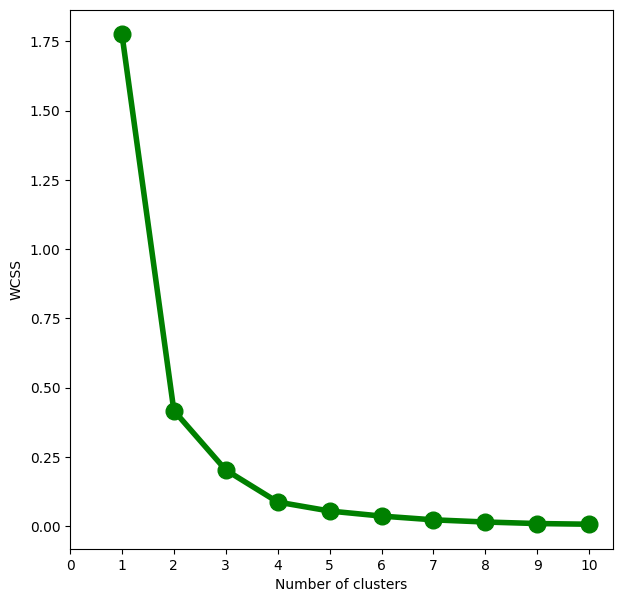

[1.7756416732841553, 0.41696675906308955, 0.2025354158273357, 0.08686091390959, 0.054440287254354194, 0.036233683285584385, 0.02264833556528715, 0.01479752090118008, 0.009232344598169458, 0.006797736357955495]


In [ ]:
# KNN: finding optimal number of clusters using elbow rule
WCSS = []
for i in range(1,11):
    model = KMeans(n_clusters=i,init='k-means++', random_state=42)
    model.fit(cluster_data)
    WCSS.append(model.inertia_)
fig = plt.figure(figsize = (7,7))
plt.plot(range(1,11), WCSS, linewidth=4, markersize=12, marker='o',color = 'green')
plt.xticks(np.arange(11))
plt.xlabel("Number of clusters")
plt.ylabel("WCSS")
plt.show()
print(WCSS)

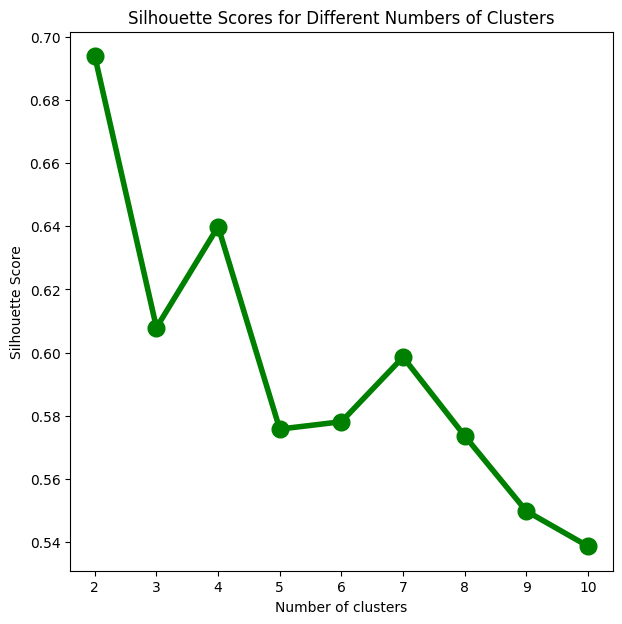

[0.6938953932503854, 0.6079176194414343, 0.63992568125299, 0.5757818163716882, 0.5781161011429086, 0.5985795282850298, 0.5736176384558463, 0.5498072057762533, 0.5386757618116389]


In [ ]:
# KNN: finding optimal number of clusters using Silhouette Score
from sklearn.metrics import silhouette_score
silhouette_scores = []
for i in range(2, 11):
    model = KMeans(n_clusters=i, init='k-means++', random_state=42)
    cluster_labels = model.fit_predict(cluster_data)
    score = silhouette_score(cluster_data, cluster_labels)
    silhouette_scores.append(score)

fig = plt.figure(figsize=(7,7))
plt.plot(range(2,11), silhouette_scores, linewidth=4, markersize=12, marker='o', color='green')
plt.xticks(np.arange(2,11))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different Numbers of Clusters")
plt.show()
print(silhouette_scores)

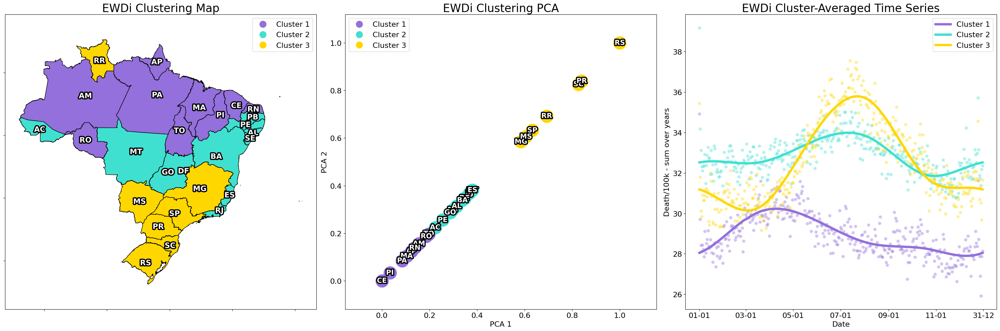

In [ ]:
n=3

#https://matplotlib.org/stable/gallery/color/named_colors.html
colors = {2:['mediumpurple', 'gold'],
          3:['mediumpurple', 'turquoise', 'gold']}

#fitting chosen model
model = KMeans(n_clusters=n, init="k-means++", max_iter=300, n_init=10, random_state=42)
y_clusters = model.fit_predict(cluster_data)

# #calculate clustering PCA
# from sklearn.decomposition import PCA
# pca = PCA(2)
# data_cluster_pca = pca.fit_transform(cluster_data)
# data_cluster_pca = np.concatenate((data_cluster_pca, y_clusters.reshape(-1,1),
#                                    np.array(data.index).reshape(-1,1)), axis=1)
# data_cluster_pca = pd.DataFrame(data_cluster_pca,
#                                 columns=['x', 'y', 'cluster', 'state'])

data_cluster_pca = np.concatenate((cluster_data.reshape(-1,1), cluster_data.reshape(-1,1),
                                   y_clusters.reshape(-1,1),
                                   np.array(data.index).reshape(-1,1)), axis=1)
data_cluster_pca = pd.DataFrame(data_cluster_pca,
                                columns=['x', 'y', 'cluster', 'state'])
data_cluster_pca['state'] = data_cluster_pca['state'].map({v:k for k, v in state_dict.items()})

# Define each cluster from the 3 main states
cluster_sp = data_cluster_pca.loc[data_cluster_pca['state'] == 'SP', 'cluster'].iloc[0]
cluster_rj = data_cluster_pca.loc[data_cluster_pca['state'] == 'RJ', 'cluster'].iloc[0]
cluster_ce = data_cluster_pca.loc[data_cluster_pca['state'] == 'CE', 'cluster'].iloc[0]

# Update the entire cluster based on the state
data_cluster_pca.loc[data_cluster_pca['cluster'] == cluster_sp, 'cluster'] = '2'
data_cluster_pca.loc[data_cluster_pca['cluster'] == cluster_rj, 'cluster'] = '1'
data_cluster_pca.loc[data_cluster_pca['cluster'] == cluster_ce, 'cluster'] = '0'
data_cluster_pca['cluster'] = data_cluster_pca['cluster'].astype(int)

# Sort clusters
data_cluster_pca = data_cluster_pca.sort_values(by='cluster')

import geopandas as gpd
from geobr import read_state
# Read Brazil state data
br = read_state(year=2020)
# Dictionary to correct state names
dic = {'Amazônas': 'Amazonas', 'Rio Grande Do Norte': 'Rio Grande do Norte',
       'Rio De Janeiro': 'Rio de Janeiro', 'Rio Grande Do Sul': 'Rio Grande do Sul',
       'Mato Grosso Do Sul': 'Mato Grosso do Sul'}
br.name_state = br.name_state.map(dic).fillna(br.name_state)
br['coords'] = br['geometry'].apply(lambda x: x.representative_point().coords[:])
br['coords'] = [coords[0] for coords in br['coords']]
# Merge with pca data
br_df = br.merge(data_cluster_pca[['cluster', 'state']], left_on='abbrev_state', right_on='state')

#viridis is colorblind-friendly
#https://www.cta-observatory.org/wp-content/uploads/2020/10/CTA_ColourBlindness_BestPractices-1.pdf

from matplotlib.gridspec import GridSpec
import matplotlib.dates as mdates
from matplotlib.lines import Line2D
from matplotlib.patheffects import withStroke

ticks_fontsize=16
legend_fontsize=16
axlabel_fontsize = 16
title_fontsize=24

# Set up the figure and GridSpec
fig = plt.figure(figsize=(30, 10))
gs = GridSpec(1, 3, figure=fig)

# Plot 1 - clustering map
from matplotlib.colors import ListedColormap
ax1 = fig.add_subplot(gs[0, 0])
br_df.plot(column='cluster', legend=False, edgecolor='black', ax=ax1,
           cmap=ListedColormap(colors[n]))
# Create annotations
for idx, row in br.iterrows():
    plt.annotate(row['abbrev_state'], xy=row['coords'],
                 ha='center', va='center',
                 weight='bold', fontsize=legend_fontsize,
                 color='white', path_effects=[
                 withStroke(linewidth=5, foreground="black")
                  ])
# Add the custom legend
legend_elements = [Line2D([], [], marker='o', color='w', label='Cluster {}'.format(i+1),
                          markerfacecolor=colors[n][i], markersize=legend_fontsize) for i in range(n)]
ax1.legend(handles=legend_elements, loc='upper right', fontsize=legend_fontsize)

# Add title and labels
ax1.set_title('EWDi Clustering Map', fontsize=title_fontsize)
# ax1.set_xlabel('Longitude', fontsize=axlabel_fontsize)
# ax1.set_ylabel('Latitude', fontsize=axlabel_fontsize)
# ax1.tick_params(axis='x', labelsize=ticks_fontsize)
# ax1.tick_params(axis='y', labelsize=ticks_fontsize)
ax1.tick_params(labelbottom=False, labelleft=False)
ax1.axis('equal')

# Plot 2 - clustering PCA
ax2 = fig.add_subplot(gs[0, 1])
for i in range(n):
    new_cluster_data = data_cluster_pca[data_cluster_pca['cluster'] == i]
    ax2.scatter(new_cluster_data['x'], new_cluster_data['y'], label=f'Cluster {i}',
                color=colors[n][i], s=750)
    # Center the text annotations for states
    for i, row in new_cluster_data.iterrows():
        ax2.text(row['x'], row['y'], str(row['state']),
                 horizontalalignment='center', verticalalignment='center',
                 color='white', path_effects=[withStroke(linewidth=5, foreground="black")],
                 fontsize=15, fontweight='bold')
# Add title and labels
ax2.set_title('EWDi Clustering PCA', fontsize=title_fontsize)
legend_elements = [Line2D([], [], marker='o', color='w', label='Cluster {}'.format(i+1),
                          markerfacecolor=colors[n][i], markersize=legend_fontsize) for i in range(n)]
ax2.legend(handles=legend_elements, fontsize=legend_fontsize)
# ax2.legend(fontsize=legend_fontsize)
ax2.set_xlabel('PCA 1', fontsize=axlabel_fontsize)
ax2.set_ylabel('PCA 2', fontsize=axlabel_fontsize)
ax2.axis('equal')
ax2.tick_params(axis='x', labelsize=ticks_fontsize)
ax2.tick_params(axis='y', labelsize=ticks_fontsize)

# Plot 3 - Comparing mean values
ax3 = fig.add_subplot(gs[0, 2])
for i in range(n):
    cluster_cols = data_cluster_pca[data_cluster_pca.cluster == i].state
    mean_observed = ts_observed[cluster_cols].mean(axis=1)
    mean_predicted = ts_predicted[cluster_cols].mean(axis=1)
    sns.lineplot(data=mean_predicted, color=colors[n][i],
                 label=f'Cluster {i+1}', linewidth=5, ax=ax3)
    sns.scatterplot(data=mean_observed, color=colors[n][i], alpha=0.4, s=50, ax=ax3)
# Change xlabels and remove last one - next year
ax3.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
xtick_labels = ax3.get_xticklabels()
if xtick_labels: xtick_labels[-1].set_text('31-12')
ax3.set_xticklabels(xtick_labels)
# Title, labels, and ticks
ax3.set_title('EWDi Cluster-Averaged Time Series', fontsize=title_fontsize)
ax3.legend(fontsize=legend_fontsize)
ax3.set_xlabel('Date', fontsize=axlabel_fontsize)
ax3.set_ylabel('Death/100k - sum over years', fontsize=axlabel_fontsize)
ax3.tick_params(axis='x', labelsize=ticks_fontsize)
ax3.tick_params(axis='y', labelsize=ticks_fontsize)

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
for i in range(2+1):
  print(f"ewdi_cluster_{i+1} = {[x for x in data_cluster_pca[data_cluster_pca.cluster==i]['state']]}")

ewdi_cluster_1 = ['TO', 'AP', 'AM', 'RO', 'CE', 'RN', 'PI', 'MA', 'PA']
ewdi_cluster_2 = ['SE', 'RJ', 'PE', 'PB', 'AC', 'MT', 'GO', 'ES', 'DF', 'BA', 'AL']
ewdi_cluster_3 = ['MG', 'MS', 'RS', 'RR', 'SC', 'SP', 'PR']


## EWDi by cause

We display the contribution to EWDi by cause in a heatmap with the x-axis sorted by cluster so that we can better visualize the different patterns.

In [ ]:
# Calculating measure
measure_name = 'EWDi'
seasonality_by_cause_calculation(measure_name)

Text(0.5, 25.722222222222214, 'State')

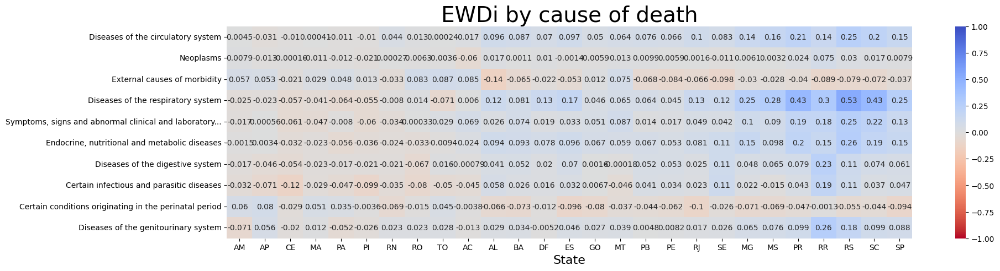

In [ ]:
data = pd.read_csv(f"{path}measures/{measure_name.lower()}_by_cause_by_state.csv", index_col=0)
data.index = [' '.join(x[:x.rfind(' ', 0, 60)].split()) + '...' if len(x) > 60 else x for x in data.index]
data = data[data_cluster_pca.sort_values(by=['cluster', 'state']).state] # sort by cluster
plt.figure(figsize=(20,5))
plt.title(f'{measure_name} by cause of death', fontsize=28)
sns.heatmap(data, vmin=-1, vmax=1, cmap='coolwarm_r', annot=True)
plt.ylabel('', fontsize=16)
plt.xlabel('State', fontsize=16)

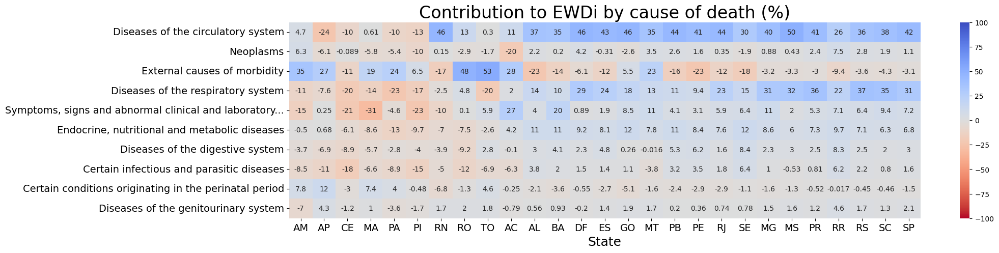

In [ ]:
data = pd.read_csv(f"{path}measures/contribution_to_{measure_name.lower()}_by_cause_by_state.csv", index_col=0)
data.index = [' '.join(x[:x.rfind(' ', 0, 60)].split()) + '...' if len(x) > 60 else x for x in data.index]
data = data[data_cluster_pca.sort_values(by=['cluster', 'state']).state] # sort by cluster
plt.figure(figsize=(20,5))
plt.title(f'Contribution to {measure_name} by cause of death (%)', fontsize=24)
sns.heatmap(data, vmin=-100, vmax=100, cmap='coolwarm_r', annot=True)
plt.ylabel('', fontsize=18)
plt.xlabel('State', fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

# EDi

To refine our analysis of the mortality seasonality patterns, we propose a new measure, the Excess Death index (EDi), by removing the constraint of the position of the period of excess death in the EWDi:

$$ EDi = \frac{Deaths(Excess \, Period) - \frac{120}{245} Deaths(Regular \, Period)}{\frac{120}{245} Deaths(Regular \, Period)} $$

To do so, we need to first determine the excess death period by evaluating which out of all of the possible 120-day spans of the 365 days of the year would lead to the highest excess death compared to the other 245 days.

The advantage of the EDi over the PTR is that it is a simple and easily reproducible metric since it does not depend on modeling and does not have any subjective choices that hinder its reproducibility. Additionally, it can be used to evaluate what causes of death contribute to the seasonality, which is not possible with the PTR since it depends on modeling and is obtained over the modeled data, not the actual data.

Similarly to the EWDi, we calculate, cluster, and see the contributions to the seasonality using our first version of the EDi.

The results of the EDi differ substantially from the EWDi, all due to the simple change of removing the position constraint of the excess death period. Although the EDi values are still more pronounced in the southern states, the northern states also exhibit a notable seasonality. We reveal these results because the period of excess death differs across the regions.

We see that the center of the period of excess deaths of the EDi is similar to the peak of mortality of the PTR. For the northern states, we see an autumn peak, while for the southern states, we see a winter peak. The clustering also similarly reveals three regions equivalent to the PTR, with slight differences in individual states at the border of the clusters.

Another considerable difference between the EDi and the EWDi is the contribution to the seasonality by cause. In the EDi, all states have the same leading causes of death contributing to seasonality, circulatory, and respiratory diseases, which aligns with the literature, while in the EWDi, that was only valid for the southern states.

OBS: I call the EDi by the name EDi-1 in the code, as I originally called the EDi by the name EDi-1 and the EDVLi by the name EDi-2.

## In Brazil

Brazil
EDi = 4.8%


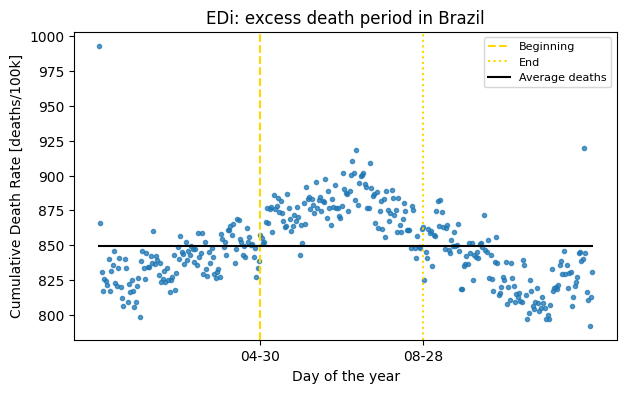

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

n = 120 # I'm using n to analyse the period of 4 months as in EWDi (365/x = n)

# DataFrame
data = df.groupby(by=['DT', 'DT_right', 'DT_numeric']).sum(numeric_only=True).reset_index()

# Create array linking yearly death counts in a cycle (0-364, 364-728)
array = data[death_column]
array = pd.concat([array, array], ignore_index=True)

# Find interval of n days in which there are more deaths
# Using Kadane's algorithm
len_array = len(array)
current_sum = 0
end_index = n-1

# Calculate first window
for i in range(n):
  current_sum += array[i]
max_sum = current_sum
end_index = n

# Calculate following windows
for i in range(n, int(len_array/2+n)):
  current_sum = current_sum + array[i] - array[i-n]

  if current_sum>max_sum:
    max_sum = current_sum
    end_index = i

# Get the period
start_day = end_index - n
if end_index>=365: end_day = end_index-365
else: end_day = end_index
start_date = data[data.DT_numeric==start_day]['DT_right'].values[0]
end_date = data[data.DT_numeric==end_day]['DT_right'].values[0]

# Get stats
avg_value = data[death_column].mean()

# Excess Death index (deaths in the n weeks with more deaths versus rest of the year )
# for expected deaths, we take the proportion between the n_days of greatest and n_days of the rest
expected_deaths = (data[death_column].sum() - max_sum)*(n/(365-n))
greatest_deaths = max_sum
edi = (greatest_deaths - expected_deaths)/expected_deaths

print(BOLD+f'Brazil'+END)
print(BOLD+f'EDi = {round(edi*100, 1)}%'+END)

# Plot results
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7,4))
ax.plot(data['DT_right'], data[death_column], 'o', alpha=0.75, ms=3)
ax.axvline(x=start_date, color='gold', ls='--', label='Beginning') #start_day
ax.axvline(x=end_date, color='gold', ls=':', label= 'End') #end_day
ax.plot(data['DT_right'], [avg_value]*len(data['DT_right']), color='black', label='Average deaths') #average deaths
ax.set_title(f'EDi: excess death period in Brazil')
ax.set_xlabel('Day of the year')
ax.set_ylabel('Cumulative Death Rate [deaths/100k]')
ax.set_xticks([start_date, end_date])
ax.legend(loc='upper right', fontsize=8)
plt.show()

## EDi calculation

State: RR
EDi = 10.6%


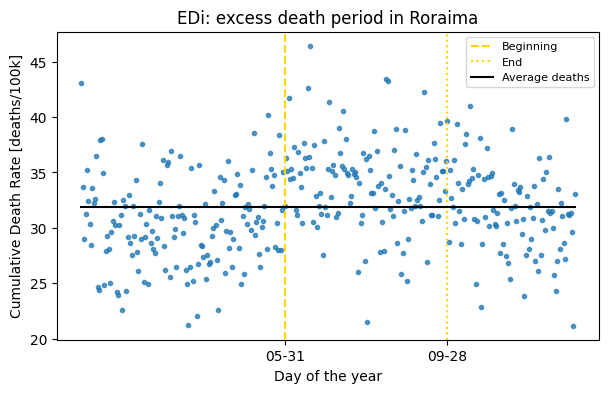

State: AP
EDi = 7.1%


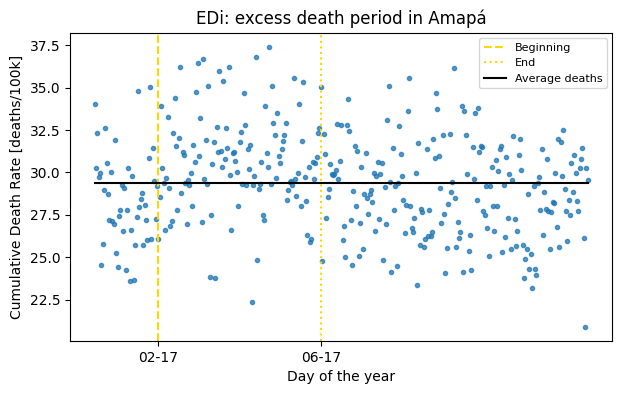

State: MA
EDi = 7.1%


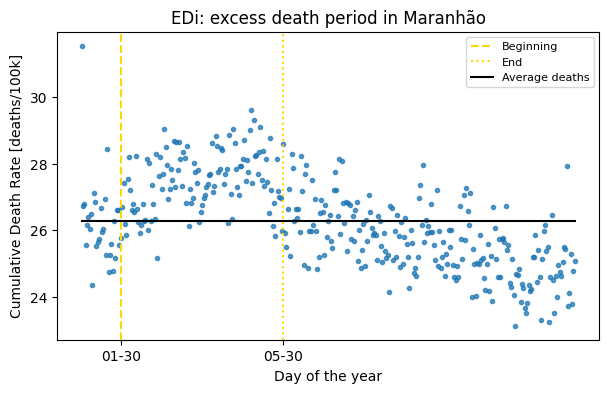

State: AM
EDi = 4.2%


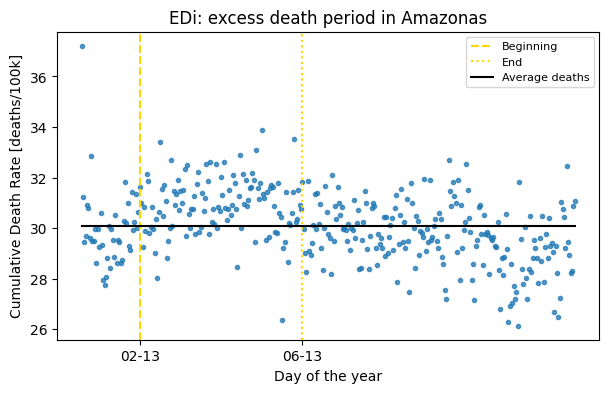

State: CE
EDi = 9.4%


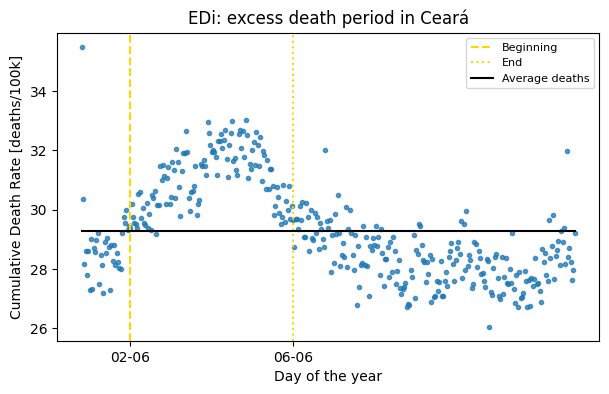

State: RN
EDi = 6.8%


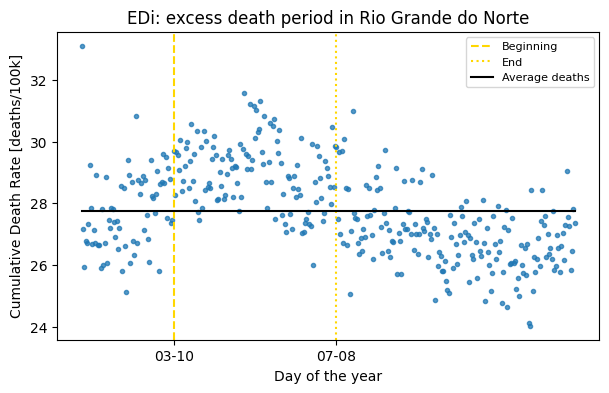

State: PA
EDi = 5.4%


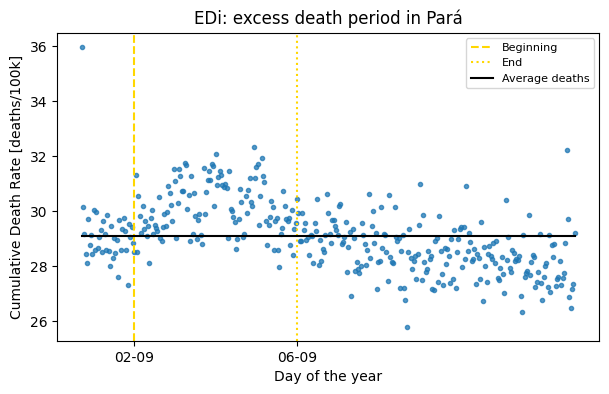

State: PB
EDi = 5.9%


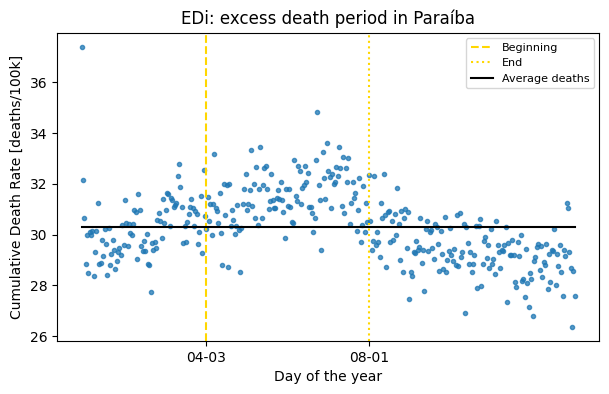

State: PI
EDi = 6.4%


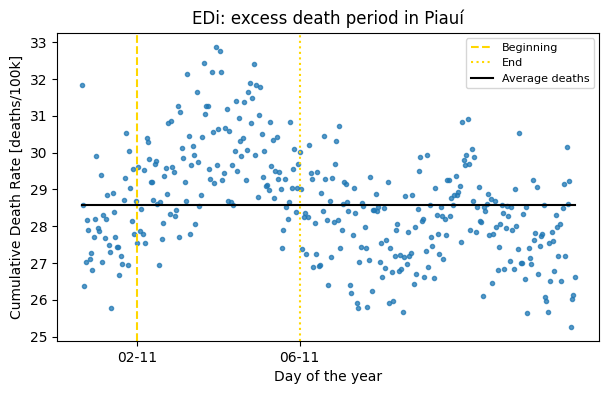

State: PE
EDi = 3.4%


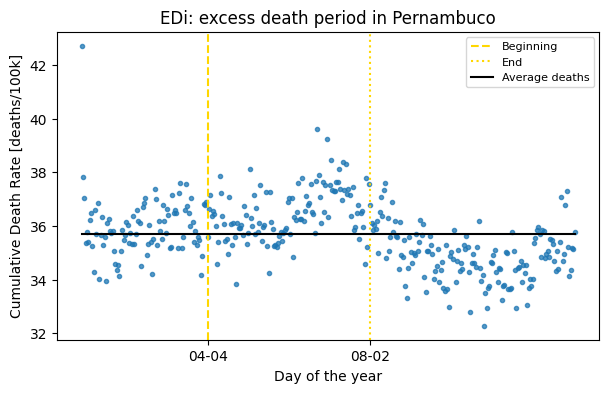

State: AC
EDi = 2.4%


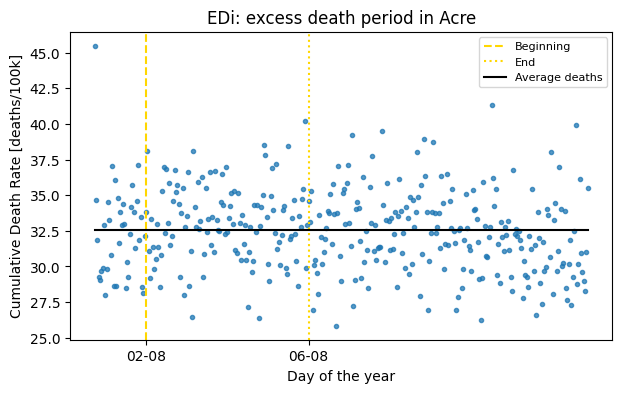

State: AL
EDi = 5.0%


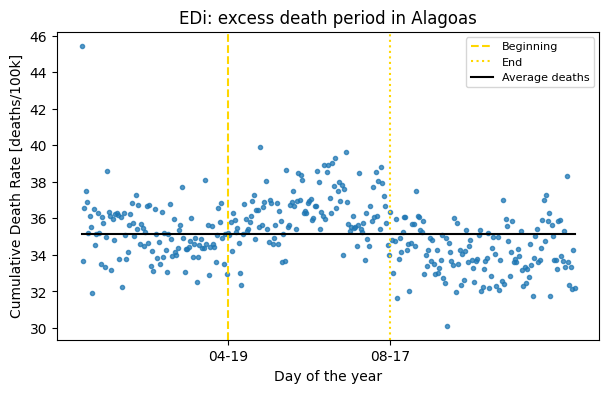

State: TO
EDi = 1.9%


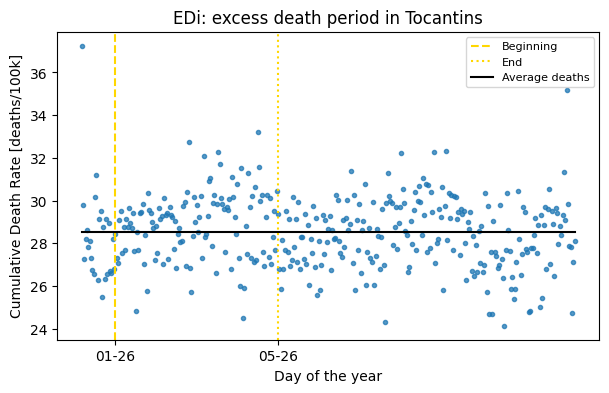

State: SE
EDi = 5.0%


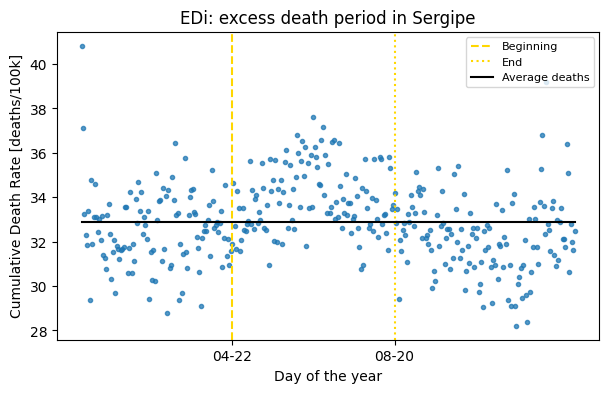

State: RO
EDi = 2.0%


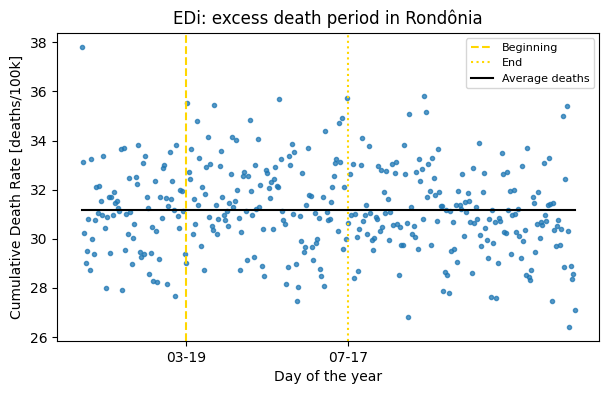

State: MT
EDi = 4.3%


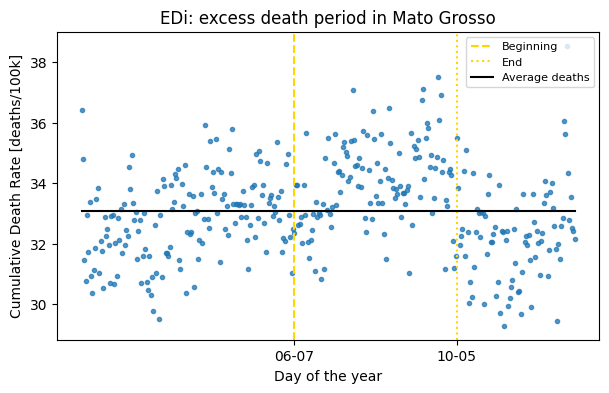

State: BA
EDi = 4.0%


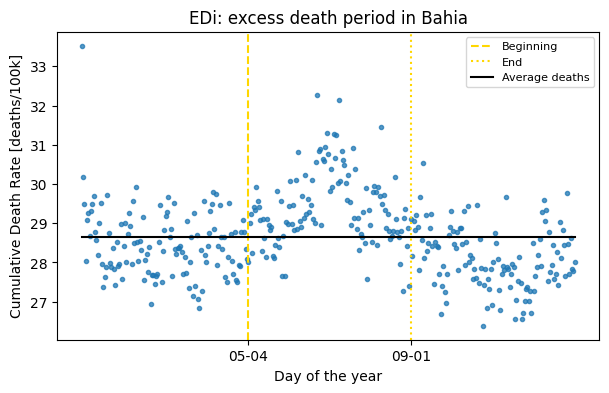

State: DF
EDi = 4.0%


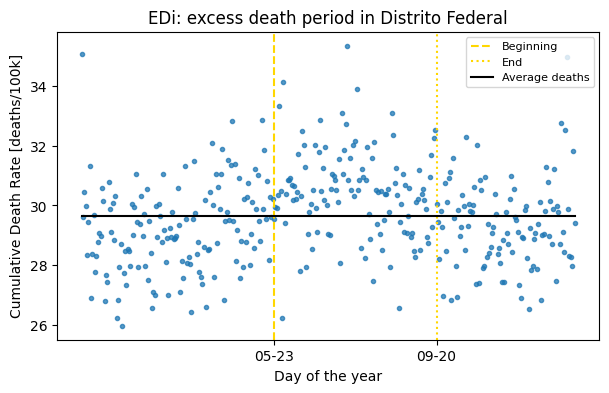

State: GO
EDi = 3.0%


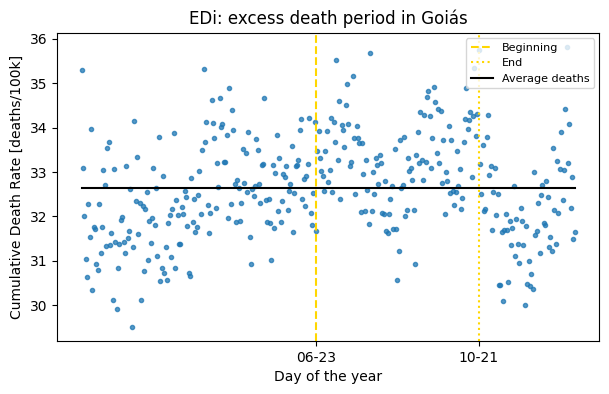

State: MG
EDi = 9.2%


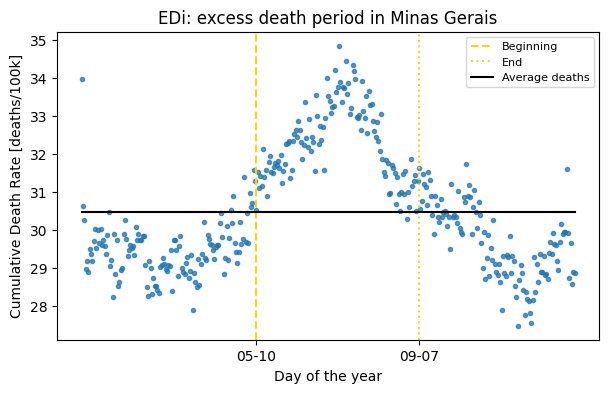

State: ES
EDi = 4.6%


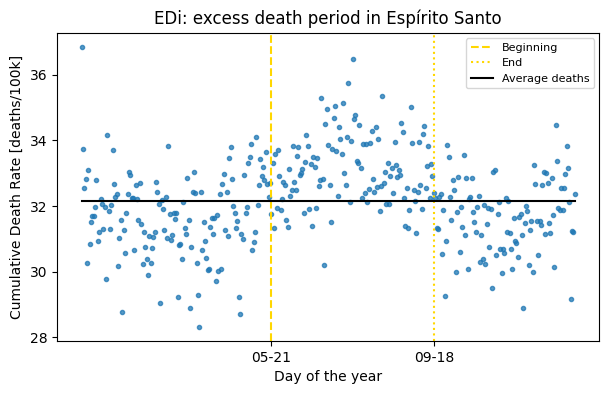

State: MS
EDi = 8.9%


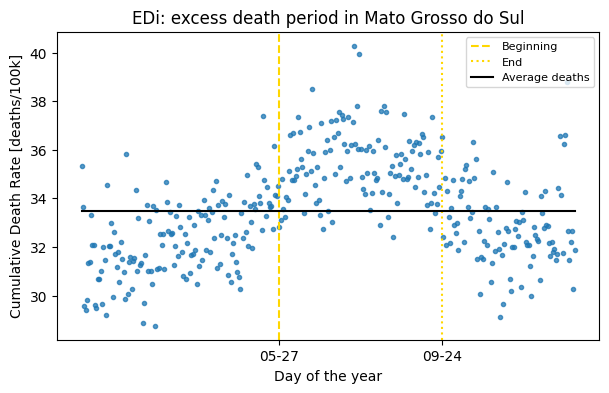

State: RJ
EDi = 5.4%


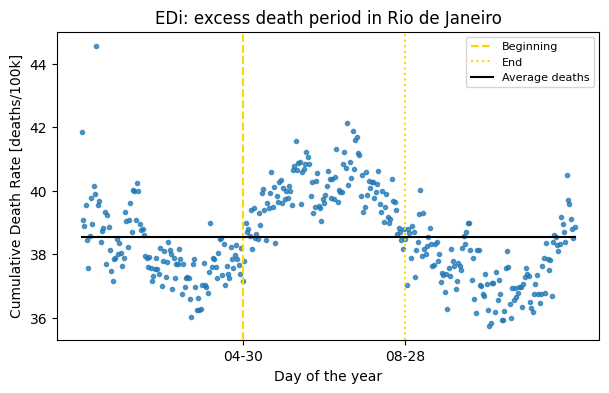

State: SP
EDi = 10.6%


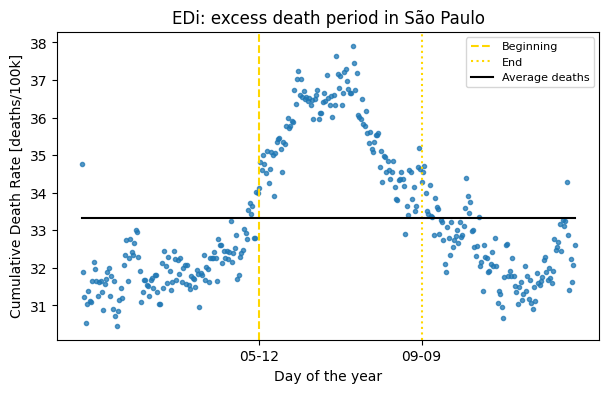

State: PR
EDi = 14.1%


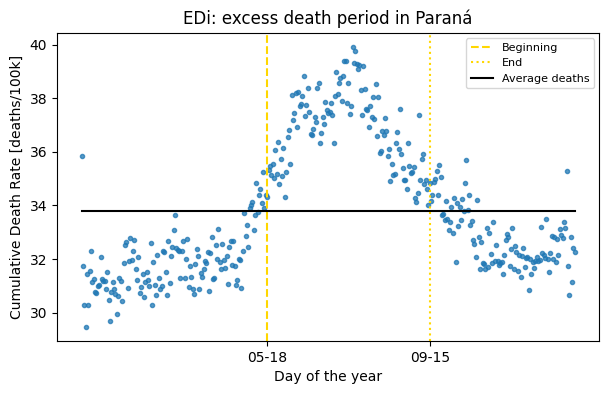

State: SC
EDi = 13.5%


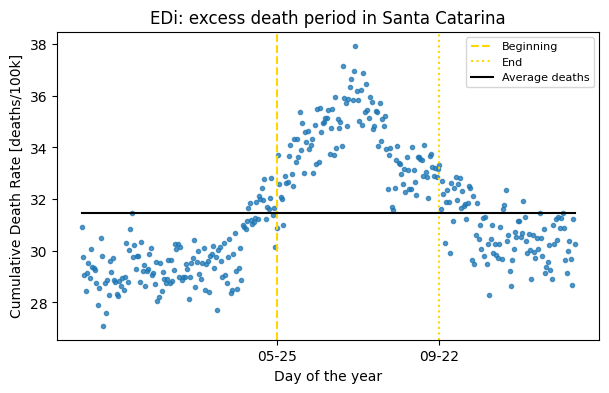

State: RS
EDi = 16.8%


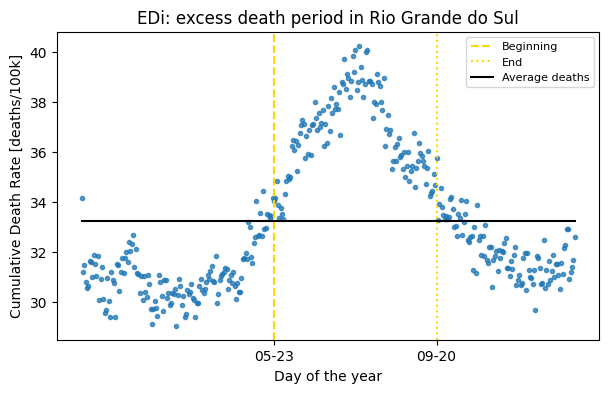

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Create a seaonality df that contains the state and start week of the n-week period with more deaths
seasonality_df = {}
n = 120 #I'm using n to analyse the period of 4 months as in EWDi (365/x = n)

for state, i in zip(states, range(len(states))):

  # DataFrame
  data = df[df.STATE==state]
  data = data.groupby(by=['DT', 'DT_right', 'DT_numeric']).sum(numeric_only=True).reset_index()

  # Create array linking yearly death counts in a cycle (0-364, 364-728)
  array = data[death_column]
  array = pd.concat([array, array], ignore_index=True)

  # Find interval of n days in which there are more deaths
  # Using Kadane's algorithm
  len_array = len(array)
  current_sum = 0
  end_index = n-1

  # Calculate first window
  for i in range(n):
    current_sum += array[i]
  max_sum = current_sum
  end_index = n

  # Calculate following windows
  for i in range(n, int(len_array/2+n)):
    current_sum = current_sum + array[i] - array[i-n]

    if current_sum>max_sum:
      max_sum = current_sum
      end_index = i

  # Get the period
  start_day = end_index - n
  if end_index>=365: end_day = end_index-365
  else: end_day = end_index
  start_date = data[data.DT_numeric==start_day]['DT_right'].values[0]
  end_date = data[data.DT_numeric==end_day]['DT_right'].values[0]

  # Get stats
  avg_value = data[death_column].mean()

  # Excess Death index (deaths in the n weeks with more deaths versus rest of the year )
  # for expected deaths, we take the proportion between the n_days of greatest and n_days of the rest
  expected_deaths = (data[death_column].sum() - max_sum)*(n/(365-n))
  greatest_deaths = max_sum
  edi = (greatest_deaths - expected_deaths)/expected_deaths
  seasonality_df[state] = f'{start_day},{edi}'

  print(BOLD+f'State: {state}'+END)
  print(BOLD+f'EDi = {round(edi*100, 1)}%'+END)

  # Plot results
  fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7,4))
  ax.plot(data['DT_right'], data[death_column], 'o', alpha=0.75, ms=3)
  ax.axvline(x=start_date, color='gold', ls='--', label='Beginning') #start_day
  ax.axvline(x=end_date, color='gold', ls=':', label= 'End') #end_day
  ax.plot(data['DT_right'], [avg_value]*len(data['DT_right']), color='black', label='Average deaths') #average deaths
  ax.set_title(f'EDi: excess death period in {state_dict[state]}')
  ax.set_xlabel('Day of the year')
  ax.set_ylabel('Cumulative Death Rate [deaths/100k]')
  ax.set_xticks([start_date, end_date])
  ax.legend(loc='upper right', fontsize=8)
  plt.show()

# Save seasonality calculation results (edi and week)
seasonality_df = pd.DataFrame([seasonality_df]).T
seasonality_df = seasonality_df[0].str.split(',', expand=True).reset_index()
seasonality_df = seasonality_df.rename(columns={0:'center_day', 1:'edi', 'index':'state'})
seasonality_df['center_day'] = seasonality_df['center_day'].astype(int) + int(n/2)
seasonality_df['edi'] = seasonality_df['edi'].astype(float)
seasonality_df.to_csv(f"{path}measures/edi_by_state_1.csv", index=False)

## EDi by state

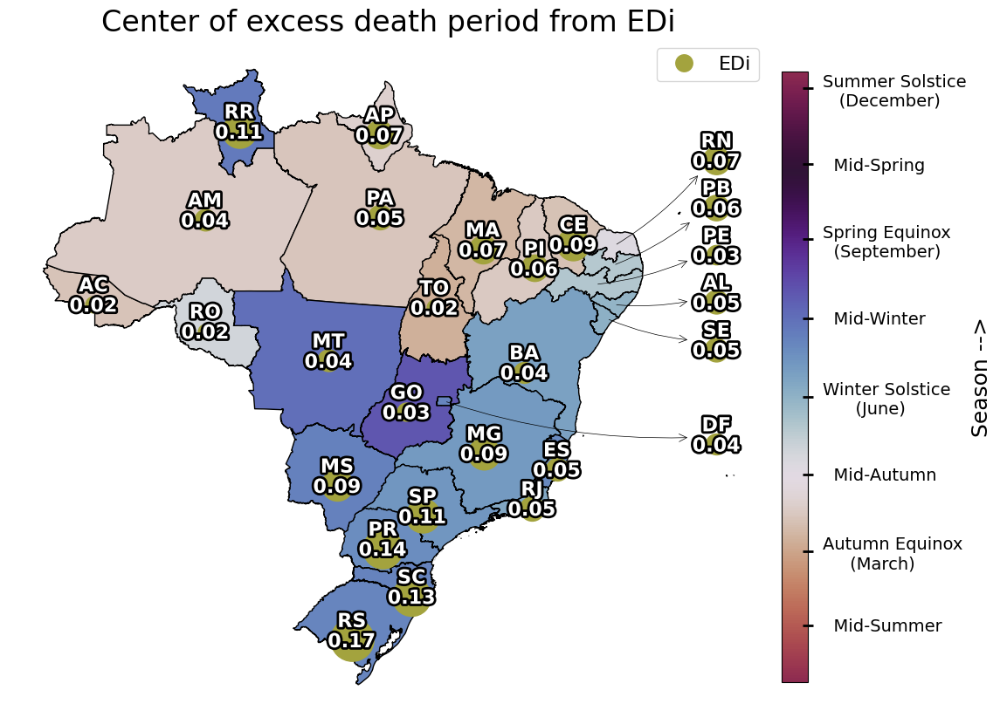

In [25]:
edi_1 = pd.read_csv(f"{path}measures/edi_1_by_state.csv")
edi_1.columns = ['state', 'center_day_edi_1', 'edi_1']

# Read Brazil state data
br = read_state(year=2020)
# Dictionary to correct state names
dic = {'Amazônas': 'Amazonas', 'Rio Grande Do Norte': 'Rio Grande do Norte',
       'Rio De Janeiro': 'Rio de Janeiro', 'Rio Grande Do Sul': 'Rio Grande do Sul',
       'Mato Grosso Do Sul': 'Mato Grosso do Sul'}
br.name_state = br.name_state.map(dic).fillna(br.name_state)

# Merge seasonality measures data with the GeoDataFrame
br = br.merge(edi_1, left_on='abbrev_state', right_on='state', how='left')
br = br.drop(columns=['state'])
br['coords'] = br['geometry'].apply(lambda x: x.representative_point().coords[:])
br['coords'] = [coords[0] for coords in br['coords']]

# Getting seasons dates
summer_solstice_day, autumn_equinox_day, winter_solstice_day, spring_equinox_day = \
 date_dict['12-21'], date_dict['03-20'], date_dict['06-20'], date_dict['09-22']
mid_summer_day = ((summer_solstice_day-364) + autumn_equinox_day)/2
mid_autumn_day = (autumn_equinox_day + winter_solstice_day)/2
mid_winter_day = (winter_solstice_day + spring_equinox_day)/2
mid_spring_day = (spring_equinox_day + summer_solstice_day)/2

# Define the colormap and normalizer
cmap = plt.get_cmap('twilight_shifted_r')
norm = mcolors.Normalize(vmin=0, vmax=45)
# Shift the colormap and normalizer
def cyclic_norm(value, n=60):
    if value+n<=364: return value+n
    else: return value+n-364
for i in range(364+1):
    norm.vmin = min(norm.vmin, cyclic_norm(i))
    norm.vmax = max(norm.vmax, cyclic_norm(i))
cmap = mcolors.LinearSegmentedColormap.from_list("twilight_shifted_cyclic",
                                                 [cmap(norm(cyclic_norm(i))) for i in range(365)])

# Plotting both datasets side by side
fig, (ax1) = plt.subplots(1, 1, figsize=(10, 10), sharey=True)
arrow_positions = {'RN':(-30, -0), 'PB':(-30, -3),'PE':(-30, -6),'AL':(-30, -9),'SE':(-30, -12),
                   'DF':(-30, -18)}
circle_color='#a3a33e'
circle_size_parameter=7500

# Define a function to plot each state with scatter points and colorbar
def plot_states(data, ax, column, measure, measure_code, title):
    data.plot(column=column, cmap=cmap, norm=norm, legend=False, edgecolor='black', ax=ax)

    offset=1
    for idx, row in data.iterrows():
        annotation = f"{row['abbrev_state']}\n{round(row[measure],2)}"
        # state_annotation = f"{row['abbrev_state']}"
        if measure=='ptr':
          circle_size = (row[measure]-1)*circle_size_parameter
          # measure_annotation = f"{measure_code}: {round(row[measure],2)}"
        else:
          circle_size = row[measure]*circle_size_parameter
          # measure_annotation=f"{measure_code}: {round(row[measure]*100,1)}%"

        if not np.isnan(row[measure]):
            if row['abbrev_state'] in arrow_positions.keys():
                # Mark the ammount of seasonality
                ax.scatter(arrow_positions[row['abbrev_state']][0],
                           arrow_positions[row['abbrev_state']][1]-offset/2,
                           s=circle_size, color=circle_color, alpha=1)
                # Annonate states and measure
                ax.annotate(annotation,
                            xy=row['coords'],
                            xytext=arrow_positions[row['abbrev_state']],  # Text is now at the position of the arrow
                            arrowprops=dict(arrowstyle="<-", lw=0.5, color='black',
                                            connectionstyle="arc3,rad=-0.1"),
                            ha='center', va='center',
                            weight='bold', fontsize=16,
                            color='white', path_effects=[
                            withStroke(linewidth=4, foreground="black")
                ])
            else:
                # Mark the ammount of seasonality
                ax.scatter(row['coords'][0],
                           row['coords'][1]-offset/2,
                           s=circle_size, color=circle_color, alpha=1)
                # Annonate states and measure
                ax.annotate(annotation, xy=row['coords'],
                            ha='center', va='center',
                            weight='bold', fontsize=16,
                            color='white', path_effects=[
                                withStroke(linewidth=4, foreground="black")
                            ])

    # Add legend
    legend_elements = [plt.Line2D([], [], marker='o', color='w', label=measure_code,
                                  markerfacecolor=circle_color, markersize=16)]
    ax.legend(handles=legend_elements, fontsize=16, loc='upper right')
    # Add title and remove axis
    ax.set_title(title, fontsize=24)
    ax.axis('off')

# Plot EDi-1
plot_states(br, ax1, 'center_day_edi_1', 'edi_1', 'EDi',
            'Center of excess death period from EDi')

# Adding a shared color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical',
                    ticks=[summer_solstice_day, autumn_equinox_day, winter_solstice_day, spring_equinox_day,
                           mid_summer_day, mid_autumn_day, mid_winter_day, mid_spring_day])

cbar.set_ticklabels(['Summer Solstice\n   (December)', 'Autumn Equinox\n     (March)',
                    'Winter Solstice\n      (June)', 'Spring Equinox\n  (September)',
                    '  Mid-Summer', '  Mid-Autumn', '  Mid-Winter', '  Mid-Spring'])
cbar.ax.tick_params(labelsize=14, width=2, length=8, direction='inout', pad=8, labelcolor='black')
cbar.set_label('Season -->', fontsize=18)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

## EDi clustering

In [26]:
data = pd.read_csv(f"{path}measures/edi_by_state_1.csv").set_index('state')
cluster_data = MinMaxScaler().fit_transform(data.fillna(0))
cluster_data.shape

(27, 2)

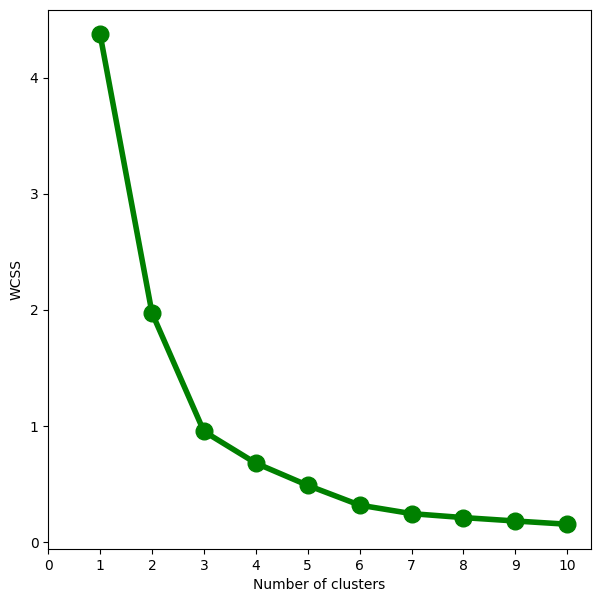

[4.373902175279907, 1.9722717351209877, 0.9515143612798271, 0.6778209916938762, 0.4863082033289778, 0.3160025005452861, 0.242696273246083, 0.2086037941168415, 0.1792161121927174, 0.15142387883662953]


In [27]:
# KNN: finding optimal number of clusters using elbow rule
WCSS = []
for i in range(1,11):
    model = KMeans(n_clusters=i,init='k-means++', random_state=42)
    model.fit(cluster_data)
    WCSS.append(model.inertia_)
fig = plt.figure(figsize = (7,7))
plt.plot(range(1,11), WCSS, linewidth=4, markersize=12, marker='o',color = 'green')
plt.xticks(np.arange(11))
plt.xlabel("Number of clusters")
plt.ylabel("WCSS")
plt.show()
print(WCSS)

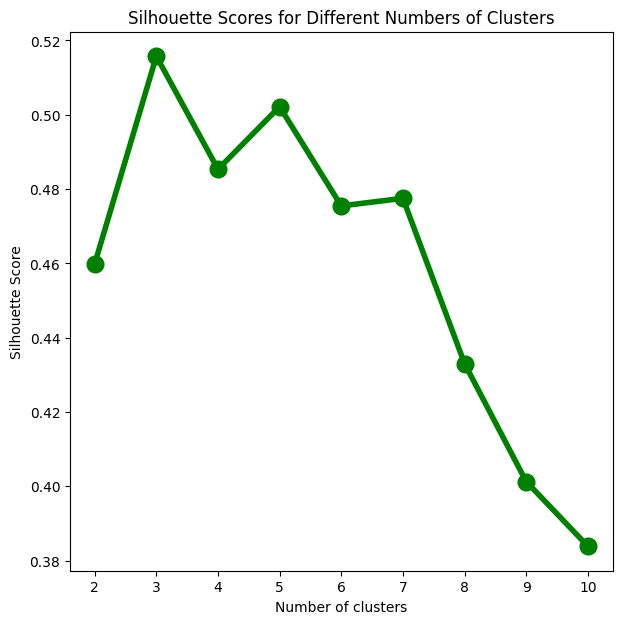

[0.45985034760782423, 0.5157667117631649, 0.4853449822215663, 0.5021797086124538, 0.475481074299244, 0.4775229252059319, 0.43302872641460427, 0.40126683964359533, 0.3838759631384807]


In [28]:
# KNN: finding optimal number of clusters using Silhouette Score
from sklearn.metrics import silhouette_score
silhouette_scores = []
for i in range(2, 11):
    model = KMeans(n_clusters=i, init='k-means++', random_state=42)
    cluster_labels = model.fit_predict(cluster_data)
    score = silhouette_score(cluster_data, cluster_labels)
    silhouette_scores.append(score)

fig = plt.figure(figsize=(7,7))
plt.plot(range(2,11), silhouette_scores, linewidth=4, markersize=12, marker='o', color='green')
plt.xticks(np.arange(2,11))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different Numbers of Clusters")
plt.show()
print(silhouette_scores)

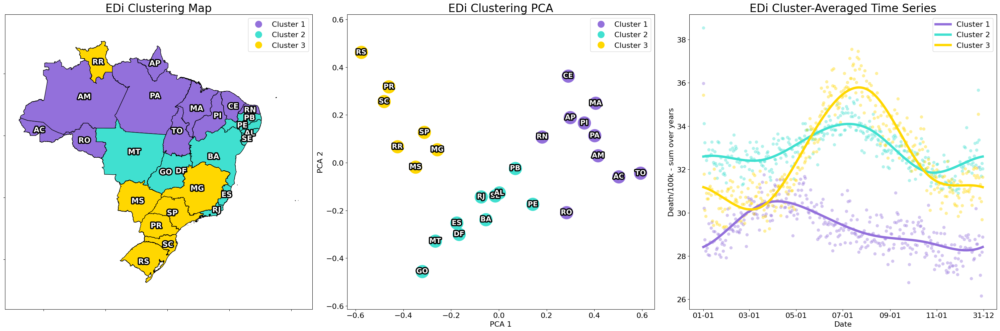

In [29]:
n=3

#https://matplotlib.org/stable/gallery/color/named_colors.html
colors = {2:['mediumpurple', 'gold'],
          3:['mediumpurple', 'turquoise', 'gold']}

#fitting chosen model
model = KMeans(n_clusters=n, init="k-means++", max_iter=300, n_init=10, random_state=42)
y_clusters = model.fit_predict(cluster_data)

#calculate clustering PCA
from sklearn.decomposition import PCA
pca = PCA(2)
data_cluster_pca = pca.fit_transform(cluster_data)
data_cluster_pca = np.concatenate((data_cluster_pca, y_clusters.reshape(-1,1),
                                   np.array(data.index).reshape(-1,1)), axis=1)
data_cluster_pca = pd.DataFrame(data_cluster_pca,
                                columns=['x', 'y', 'cluster', 'state'])

# Define each cluster from the 3 main states
cluster_sp = data_cluster_pca.loc[data_cluster_pca['state'] == 'SP', 'cluster'].iloc[0]
cluster_rj = data_cluster_pca.loc[data_cluster_pca['state'] == 'RJ', 'cluster'].iloc[0]
cluster_ce = data_cluster_pca.loc[data_cluster_pca['state'] == 'CE', 'cluster'].iloc[0]

# Update the entire cluster based on the state
data_cluster_pca.loc[data_cluster_pca['cluster'] == cluster_sp, 'cluster'] = '2'
data_cluster_pca.loc[data_cluster_pca['cluster'] == cluster_rj, 'cluster'] = '1'
data_cluster_pca.loc[data_cluster_pca['cluster'] == cluster_ce, 'cluster'] = '0'
data_cluster_pca['cluster'] = data_cluster_pca['cluster'].astype(int)

# Sort clusters
data_cluster_pca = data_cluster_pca.sort_values(by='cluster')

import geopandas as gpd
from geobr import read_state
# Read Brazil state data
br = read_state(year=2020)
# Dictionary to correct state names
dic = {'Amazônas': 'Amazonas', 'Rio Grande Do Norte': 'Rio Grande do Norte',
       'Rio De Janeiro': 'Rio de Janeiro', 'Rio Grande Do Sul': 'Rio Grande do Sul',
       'Mato Grosso Do Sul': 'Mato Grosso do Sul'}
br.name_state = br.name_state.map(dic).fillna(br.name_state)
br['coords'] = br['geometry'].apply(lambda x: x.representative_point().coords[:])
br['coords'] = [coords[0] for coords in br['coords']]
# Merge with pca data
br_df = br.merge(data_cluster_pca[['cluster', 'state']], left_on='abbrev_state', right_on='state')

#viridis is colorblind-friendly
#https://www.cta-observatory.org/wp-content/uploads/2020/10/CTA_ColourBlindness_BestPractices-1.pdf

from matplotlib.gridspec import GridSpec
import matplotlib.dates as mdates
from matplotlib.lines import Line2D
from matplotlib.patheffects import withStroke

ticks_fontsize=16
legend_fontsize=16
axlabel_fontsize = 16
title_fontsize=24

# Set up the figure and GridSpec
fig = plt.figure(figsize=(30, 10))
gs = GridSpec(1, 3, figure=fig)

# Plot 1 - clustering map
from matplotlib.colors import ListedColormap
ax1 = fig.add_subplot(gs[0, 0])
br_df.plot(column='cluster', legend=False, edgecolor='black', ax=ax1,
           cmap=ListedColormap(colors[n]))
# Create annotations
for idx, row in br.iterrows():
    plt.annotate(row['abbrev_state'], xy=row['coords'],
                 ha='center', va='center',
                 weight='bold', fontsize=legend_fontsize,
                 color='white', path_effects=[
                 withStroke(linewidth=5, foreground="black")
                  ])
# Add the custom legend
legend_elements = [Line2D([], [], marker='o', color='w', label='Cluster {}'.format(i+1),
                          markerfacecolor=colors[n][i], markersize=legend_fontsize) for i in range(n)]
ax1.legend(handles=legend_elements, loc='upper right', fontsize=legend_fontsize)

# Add title and labels
ax1.set_title('EDi Clustering Map', fontsize=title_fontsize)
ax1.tick_params(labelbottom=False, labelleft=False)
# ax1.set_xlabel('Longitude', fontsize=axlabel_fontsize)
# ax1.set_ylabel('Latitude', fontsize=axlabel_fontsize)
# ax1.tick_params(axis='x', labelsize=ticks_fontsize)
# ax1.tick_params(axis='y', labelsize=ticks_fontsize)
ax1.axis('equal')

# Plot 2 - clustering PCA
ax2 = fig.add_subplot(gs[0, 1])
for i in range(n):
    new_cluster_data = data_cluster_pca[data_cluster_pca['cluster'] == i]
    ax2.scatter(new_cluster_data['x'], new_cluster_data['y'], label=f'Cluster {i}',
                color=colors[n][i], s=750)
    # Center the text annotations for states
    for i, row in new_cluster_data.iterrows():
        ax2.text(row['x'], row['y'], str(row['state']),
                 horizontalalignment='center', verticalalignment='center',
                 color='white', path_effects=[withStroke(linewidth=5, foreground="black")],
                 fontsize=15, fontweight='bold')
# Add title and labels
ax2.set_title('EDi Clustering PCA', fontsize=title_fontsize)
legend_elements = [Line2D([], [], marker='o', color='w', label='Cluster {}'.format(i+1),
                          markerfacecolor=colors[n][i], markersize=legend_fontsize) for i in range(n)]
ax2.legend(handles=legend_elements, fontsize=legend_fontsize)
# ax2.legend(fontsize=legend_fontsize)
ax2.set_xlabel('PCA 1', fontsize=axlabel_fontsize)
ax2.set_ylabel('PCA 2', fontsize=axlabel_fontsize)
ax2.axis('equal')
ax2.tick_params(axis='x', labelsize=ticks_fontsize)
ax2.tick_params(axis='y', labelsize=ticks_fontsize)

# Plot 3 - Comparing mean values
ax3 = fig.add_subplot(gs[0, 2])
for i in range(n):
    cluster_cols = data_cluster_pca[data_cluster_pca.cluster == i].state
    mean_observed = ts_observed[cluster_cols].mean(axis=1)
    mean_predicted = ts_predicted[cluster_cols].mean(axis=1)
    sns.lineplot(data=mean_predicted, color=colors[n][i],
                 label=f'Cluster {i+1}', linewidth=5, ax=ax3)
    sns.scatterplot(data=mean_observed, color=colors[n][i], alpha=0.4, s=50, ax=ax3)
# Change xlabels and remove last one - next year
ax3.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
xtick_labels = ax3.get_xticklabels()
if xtick_labels: xtick_labels[-1].set_text('31-12')
ax3.set_xticklabels(xtick_labels)
# Title, labels, and ticks
ax3.set_title('EDi Cluster-Averaged Time Series', fontsize=title_fontsize)
ax3.legend(fontsize=legend_fontsize)
ax3.set_xlabel('Date', fontsize=axlabel_fontsize)
ax3.set_ylabel('Death/100k - sum over years', fontsize=axlabel_fontsize)
ax3.tick_params(axis='x', labelsize=ticks_fontsize)
ax3.tick_params(axis='y', labelsize=ticks_fontsize)

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

In [30]:
for i in range(2+1):
  print(f"edi1_cluster_{i+1} = {[x for x in data_cluster_pca[data_cluster_pca.cluster==i]['state']]}")

edi1_cluster_1 = ['AC', 'AP', 'MA', 'AM', 'CE', 'RN', 'PA', 'PI', 'TO', 'RO']
edi1_cluster_2 = ['GO', 'DF', 'BA', 'MT', 'SE', 'AL', 'ES', 'PE', 'PB', 'RJ']
edi1_cluster_3 = ['SP', 'PR', 'RR', 'MG', 'SC', 'MS', 'RS']


## EDi by cause

In [31]:
# Define death column
death_column = 'DEATHS_STANDARDIZED_BR'

# Define measure
measure_name = 'EDi-1'

# Calculate measure
seasonality_by_cause_calculation(measure_name)

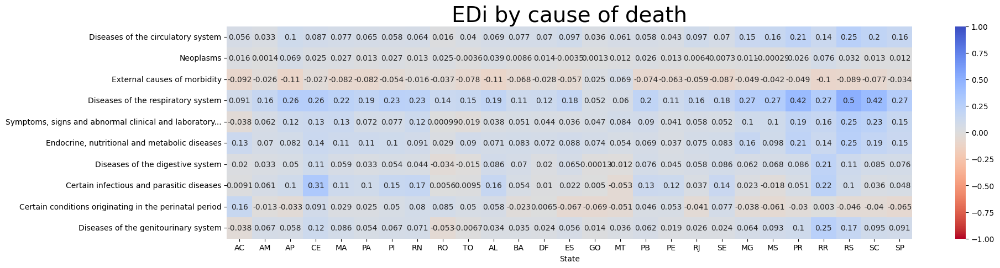

In [32]:
data = pd.read_csv(f"{path}measures/{measure_name.lower().replace('-', '_')}_by_cause_by_state.csv", index_col=0)
data.index = [' '.join(x[:x.rfind(' ', 0, 60)].split()) + '...' if len(x) > 60 else x for x in data.index]
data = data[data_cluster_pca.sort_values(by=['cluster', 'state']).state] # sort by cluster
plt.figure(figsize=(20,5))
plt.title(f'EDi by cause of death', fontsize=28)
sns.heatmap(data, vmin=-1, vmax=1, cmap='coolwarm_r', annot=True)
plt.ylabel('')
plt.xlabel('State')
plt.show()

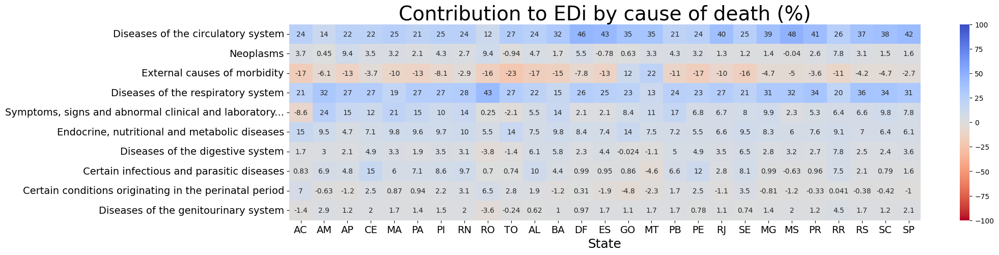

In [33]:
data = pd.read_csv(f"{path}measures/contribution_to_{measure_name.lower().replace('-', '_')}_by_cause_by_state.csv", index_col=0)
data.index = [' '.join(x[:x.rfind(' ', 0, 60)].split()) + '...' if len(x) > 60 else x for x in data.index]
data = data[data_cluster_pca.sort_values(by=['cluster', 'state']).state] # sort by cluster
plt.figure(figsize=(20,5))
plt.title(f'Contribution to EDi by cause of death (%)', fontsize=28)
sns.heatmap(data, vmin=-100, vmax=100, cmap='coolwarm_r', annot=True)
plt.ylabel('', fontsize=18)
plt.xlabel('State', fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

# EDVLi

We can also further modify the EDi to the EDVLi, also called Excess Death with Varying Lenght index (EDVLi), by removing both the position and the length constraints of the measure:

$$ EDVLi = \frac{Deaths(Excess \, Period) - \frac{n}{365-n} Deaths(Regular \, Period)}{\frac{n}{365-n} Deaths(Regular \, Period)} $$

To do so, we used a strategy different from the one we used at the EDi. We segment the aggregated yearly time-series mortality data into four periods by identifying three change points and then selecting which of these four periods would lead to a higher seasonality according to the EDVLi's equation. The choice of the number of change points is subjective, and we chose 4 to align with the common practice of dividing the year into four seasons.

The advantage of the EDVLi over the EDi is that it removes both the constraints, and the disadvantage is that, similarly to the PTR, modeling is necessary and subjective choices are made, leading to it being more challenging to reproduce while reproducing the results of the EDi is very straight-forward.

Similarly to the EDi, we calculate, cluster, and see the contributions to the seasonality using the EDVLi.

The results are very similar to the EDi, with similar values of seasonality, seasonality timings, state clusters, and causes of death contributing to seasonality. There are only slight differences limited to a few states, such as Roraima, where a particularity of External causes of morbidity influence seasonality. The clustering is slightly less geographically well-defined, with the state of Goiás being placed in a cluster different from every one of its neighbors, for which we do not see a reason, as the state does not have any marked difference from its neighbors regarding the climate and sociodemographic factors believed to influence seasonality.

OBS: I call the EDVLi by the name EDi-2 in the code, as I originally called the EDi by the name EDi-1 and the EDVLi by the name EDi-2.

## In Brazil

Brazil
EDi = 4.9%
Size = 110 days


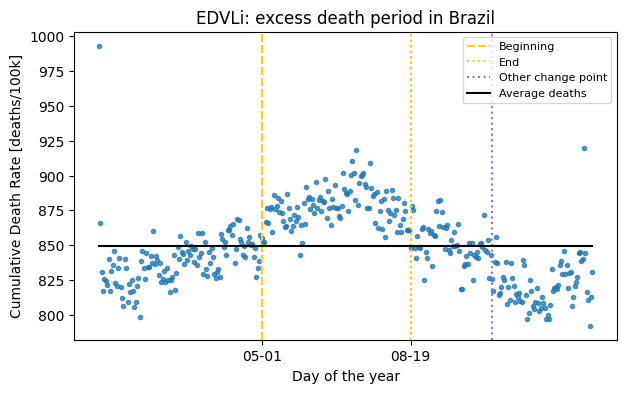

In [35]:
# DataFrame
data = df.groupby(by=['DT', 'DT_right', 'DT_numeric']).sum(numeric_only=True).reset_index()

# Create array linking yearly death counts in a cycle (0-364, 364-728)
array = np.array(data[death_column])

# Find interval in which there are more deaths
# Using change point detection
# https://centre-borelli.github.io/ruptures-docs/code-reference/detection/dynp-reference/#ruptures.detection.dynp.Dynp

# # Find the change points (7 to break the 2 year in exactly 8 seasons)
# n_bkps = 7
# Find the change points (3 to break the year in exactly 4 seasons)
n_bkps = 3
model = "rbf"
algo = rpt.Dynp(model=model, min_size=30, jump=5).fit(array)
result = algo.predict(n_bkps=n_bkps)
result.insert(0, 0)

# Find which of the periods from change points found has more deaths
max_mean = -1
for i in range(4):
  current_start_day = result[i]
  current_end_day = result[i+1]
  current_day_range = current_end_day - current_start_day
  current_sum = array[current_start_day:current_end_day].sum()
  current_mean = current_sum/current_day_range
  if current_mean > max_mean:
    max_sum = current_sum
    max_mean = max_sum/current_day_range
    start_day = current_start_day
    end_day = current_end_day
    n = current_day_range

# Get the period
start_date = data.loc[start_day]['DT_right']
end_date = data.loc[end_day]['DT_right']

# Get stats
avg_value = data[death_column].mean()

# Excess Death index (deaths in the n weeks with more deaths versus rest of the year )
# for expected deaths, we take the proportion between the n_days of greatest and n_days of the rest
expected_deaths = (data[death_column].sum() - max_sum)*(n/(365-n))
greatest_deaths = max_sum
edi = (greatest_deaths - expected_deaths)/expected_deaths

print(BOLD+f'Brazil'+END)
print(BOLD+f'EDi = {round(edi*100, 1)}%'+END)
print(BOLD+f'Size = {n} days')

# Plot results
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7,4))
ax.plot(data['DT_right'], data[death_column], 'o', alpha=0.75, ms=3)
for point in result[1:-1]:
  ax.axvline(x=point, color='mediumpurple', ls=':')
ax.axvline(x=start_date, color='gold', ls='--', label='Beginning') #start_day
ax.axvline(x=end_date, color='gold', ls=':', label='End') #end_day
ax.plot([], color='mediumpurple', ls=':', label='Other change point')
ax.plot(data['DT_right'], [avg_value]*len(data['DT_right']), color='black', label='Average deaths') #average deaths
ax.set_title(f'EDVLi: excess death period in Brazil')
ax.set_xlabel('Day of the year')
ax.set_ylabel('Cumulative Death Rate [deaths/100k]')
ax.set_xticks([start_date, end_date])
ax.legend(loc='upper right', fontsize=8)
plt.show()

## EDVLi by state in Brazil

State: RR
EDi = 9.5%
Size = 85 days


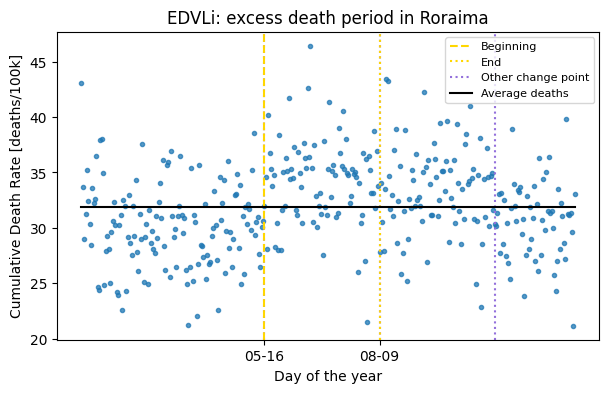

State: AP
EDi = 6.8%
Size = 120 days


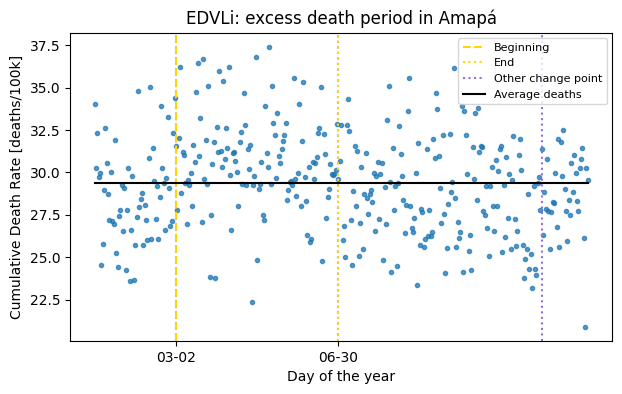

State: MA
EDi = 7.5%
Size = 85 days


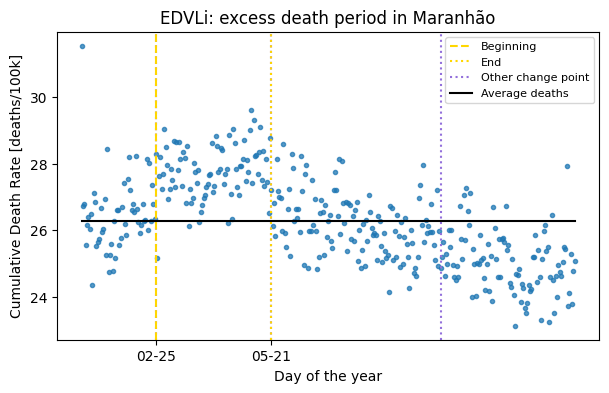

State: AM
EDi = 4.2%
Size = 125 days


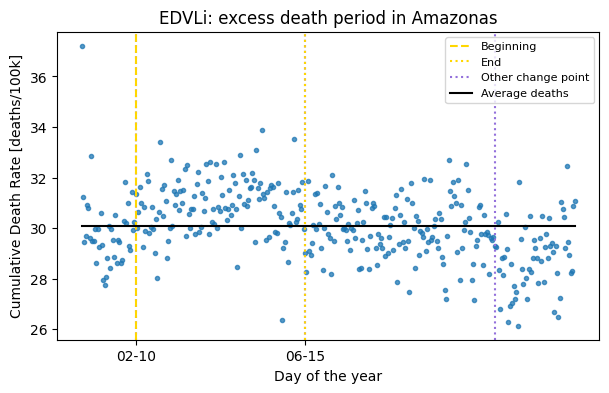

State: CE
EDi = 10.1%
Size = 90 days


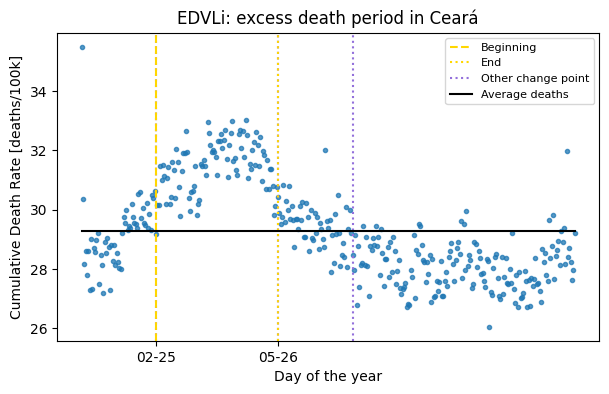

State: RN
EDi = 7.0%
Size = 155 days


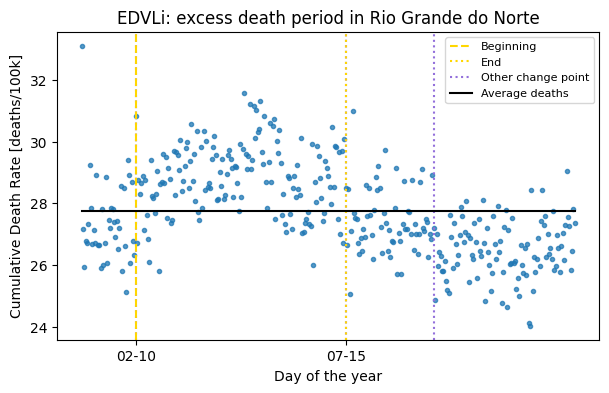

State: PA
EDi = 6.0%
Size = 75 days


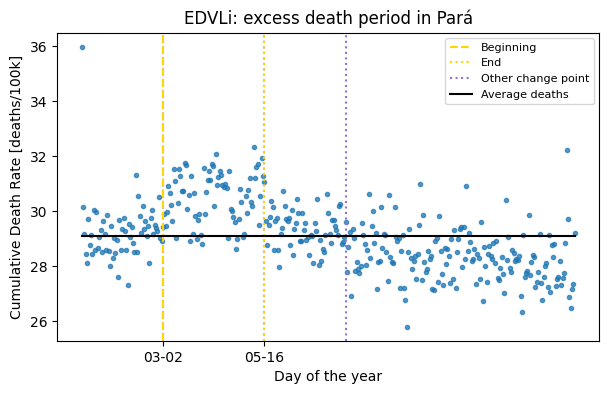

State: PB
EDi = 6.1%
Size = 145 days


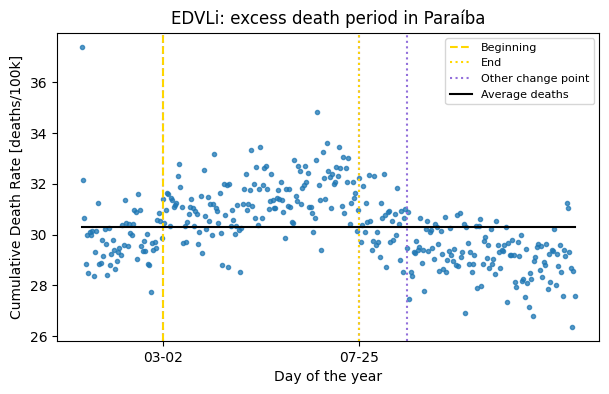

State: PI
EDi = 7.3%
Size = 75 days


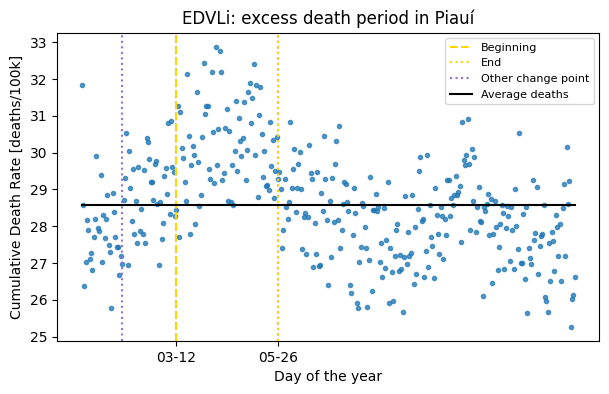

State: PE
EDi = 5.0%
Size = 40 days


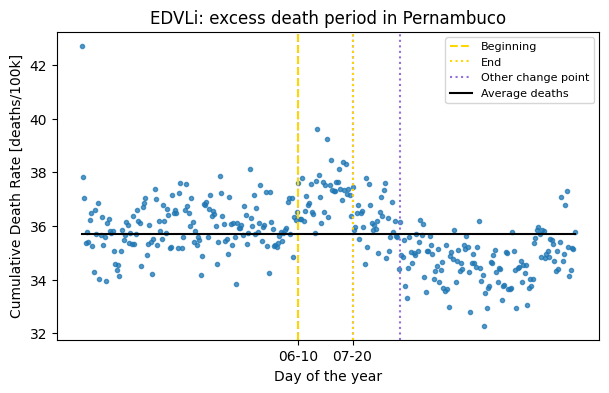

State: AC
EDi = 3.9%
Size = 55 days


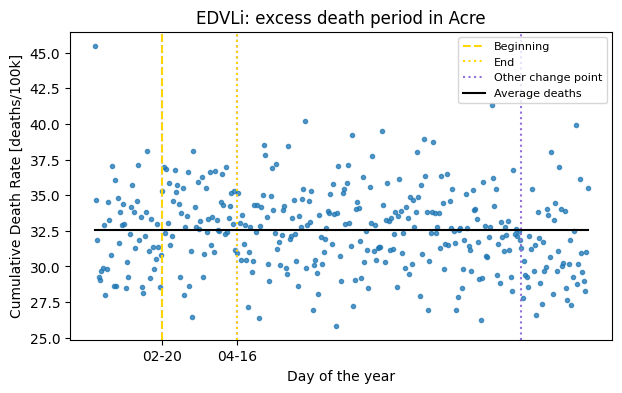

State: AL
EDi = 5.6%
Size = 105 days


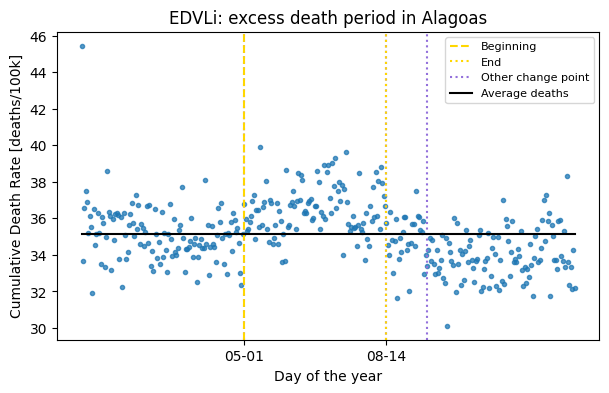

State: TO
EDi = 2.9%
Size = 65 days


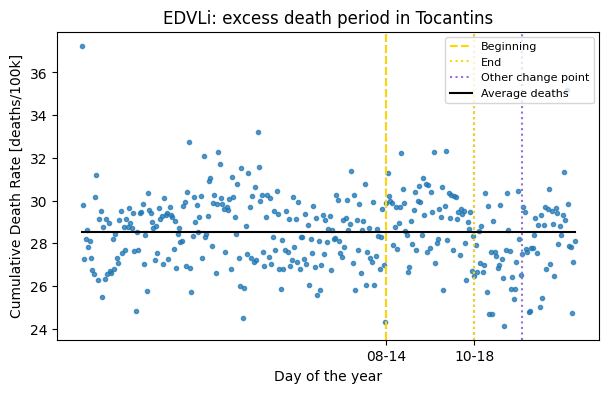

State: SE
EDi = 6.3%
Size = 50 days


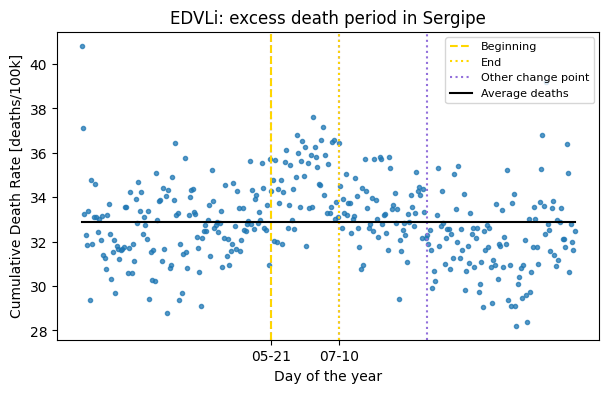

State: RO
EDi = 2.4%
Size = 90 days


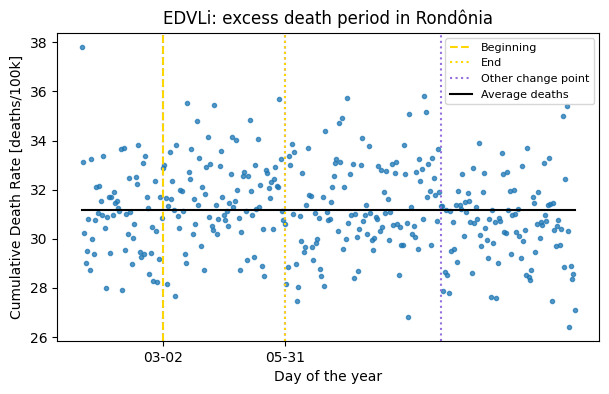

State: MT
EDi = 5.3%
Size = 90 days


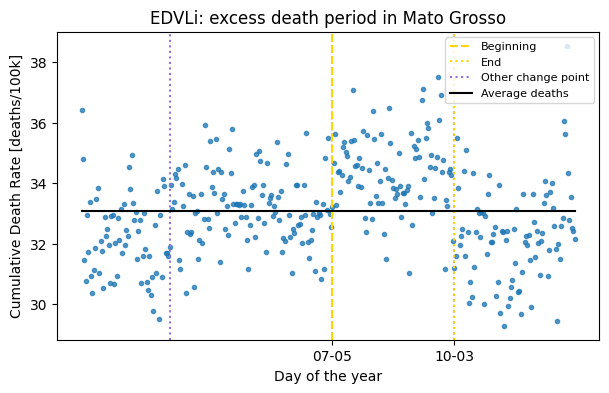

State: BA
EDi = 5.9%
Size = 45 days


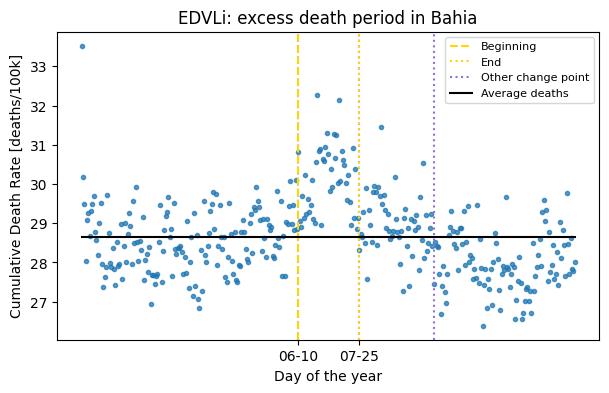

State: DF
EDi = 3.9%
Size = 140 days


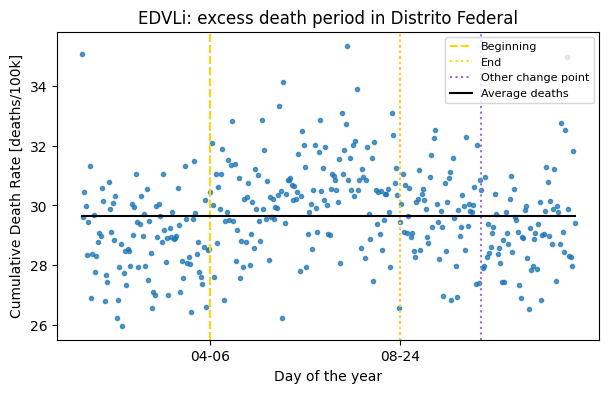

State: GO
EDi = 3.8%
Size = 220 days


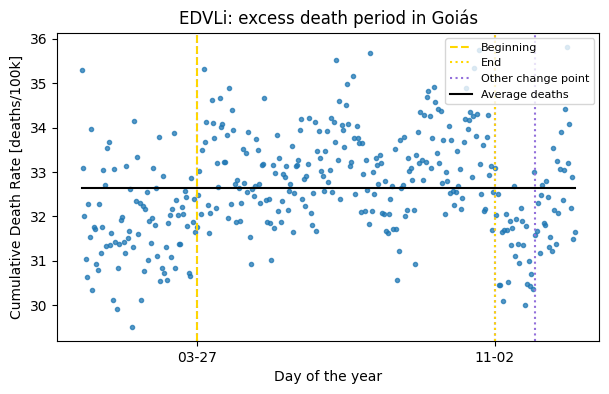

State: MG
EDi = 9.5%
Size = 100 days


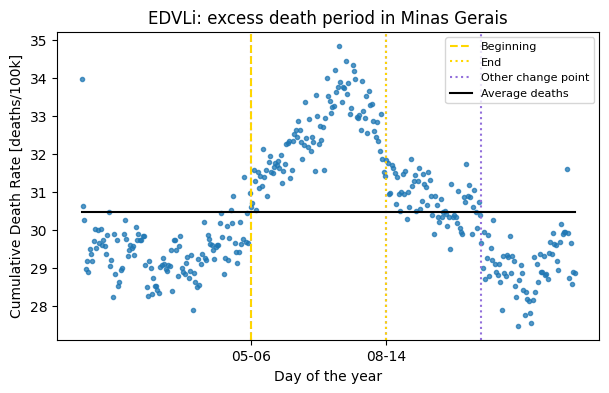

State: ES
EDi = 4.7%
Size = 95 days


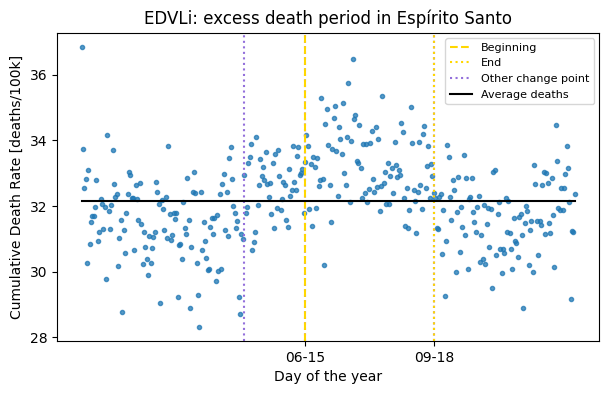

State: MS
EDi = 8.8%
Size = 115 days


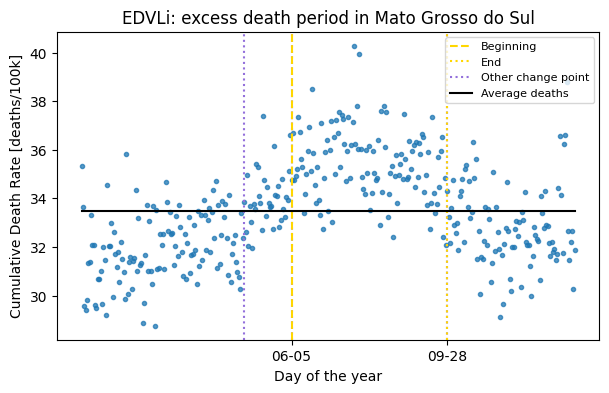

State: RJ
EDi = 5.6%
Size = 110 days


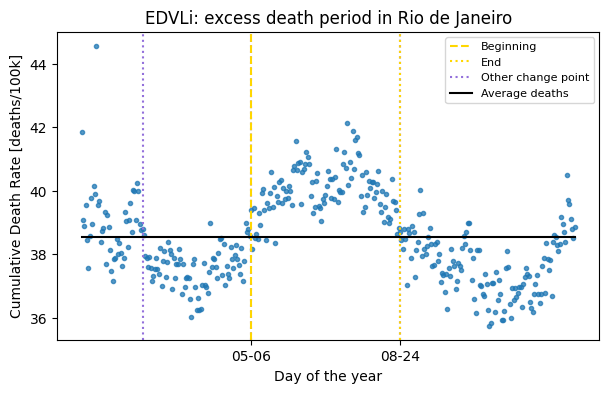

State: SP
EDi = 11.1%
Size = 90 days


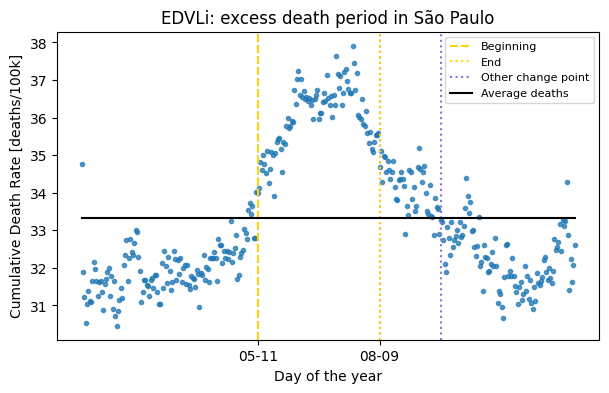

State: PR
EDi = 13.9%
Size = 105 days


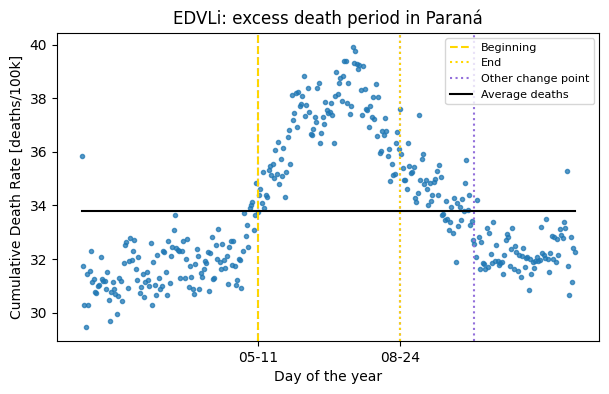

State: SC
EDi = 13.6%
Size = 115 days


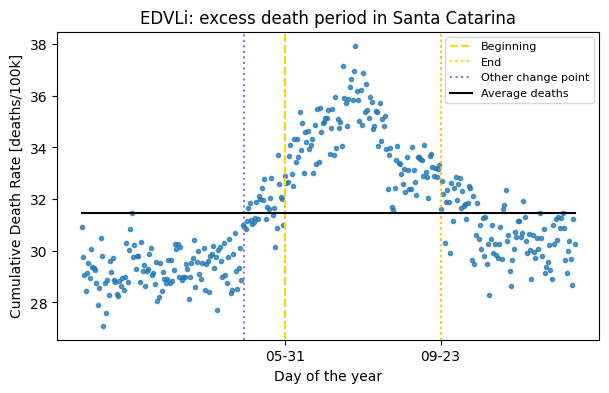

State: RS
EDi = 17.1%
Size = 110 days


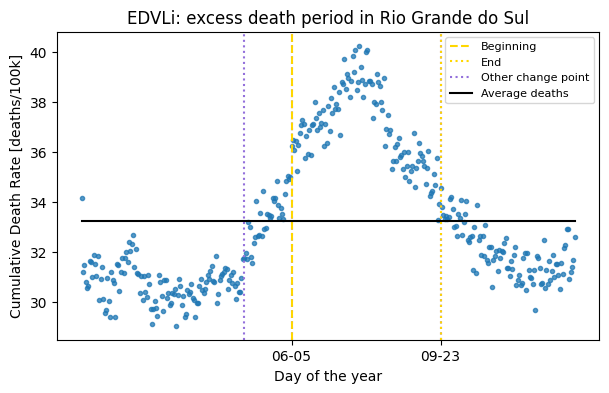

In [36]:
# Create a seaonality df that contains the state and start week of the n-week period with more deaths
seasonality_df = {}

# selected_states = ['RS', 'SP', 'RR', 'PB', 'CE', 'AC']
# for state, i in zip(selected_states, range(len(selected_states))):
for state, i in zip(states, range(len(states))):

  # DataFrame
  data = df[df.STATE==state]
  data = data.groupby(by=['DT', 'DT_right', 'DT_numeric']).sum(numeric_only=True).reset_index()

  # Create array linking yearly death counts in a cycle (0-364, 364-728)
  array = np.array(data[death_column])

  # Find interval in which there are more deaths
  # Using change point detection
  # https://centre-borelli.github.io/ruptures-docs/code-reference/detection/dynp-reference/#ruptures.detection.dynp.Dynp

  # # Find the change points (7 to break the 2 year in exactly 8 seasons)
  # n_bkps = 7
  # Find the change points (3 to break the year in exactly 4 seasons)
  n_bkps = 3
  model = "rbf"
  algo = rpt.Dynp(model=model, min_size=30, jump=5).fit(array)
  result = algo.predict(n_bkps=n_bkps)
  result.insert(0, 0)

  # Find which of the periods from change points found has more deaths
  max_mean = -1
  for i in range(4):
    current_start_day = result[i]
    current_end_day = result[i+1]
    current_day_range = current_end_day - current_start_day
    current_sum = array[current_start_day:current_end_day].sum()
    current_mean = current_sum/current_day_range
    if current_mean > max_mean:
      max_sum = current_sum
      max_mean = max_sum/current_day_range
      start_day = current_start_day
      end_day = current_end_day
      n = current_day_range

  # Get the period
  start_date = data.loc[start_day]['DT_right']
  end_date = data.loc[end_day]['DT_right']

  # Get stats
  avg_value = data[death_column].mean()

  # Excess Death index (deaths in the n weeks with more deaths versus rest of the year )
  # for expected deaths, we take the proportion between the n_days of greatest and n_days of the rest
  expected_deaths = (data[death_column].sum() - max_sum)*(n/(365-n))
  greatest_deaths = max_sum
  edi = (greatest_deaths - expected_deaths)/expected_deaths
  seasonality_df[state] = f'{start_day},{edi},{n}'

  print(BOLD+f'State: {state}'+END)
  print(BOLD+f'EDi = {round(edi*100, 1)}%'+END)
  print(BOLD+f'Size = {n} days')

  # Plot results
  fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7,4))
  ax.plot(data['DT_right'], data[death_column], 'o', alpha=0.75, ms=3)
  for point in result[1:-1]:
    ax.axvline(x=point, color='mediumpurple', ls=':')
  ax.axvline(x=start_date, color='gold', ls='--', label='Beginning') #start_day
  ax.axvline(x=end_date, color='gold', ls=':', label='End') #end_day
  ax.plot([], color='mediumpurple', ls=':', label='Other change point')
  ax.plot(data['DT_right'], [avg_value]*len(data['DT_right']), color='black', label='Average deaths') #average deaths
  ax.set_title(f'EDVLi: excess death period in {state_dict[state]}')
  ax.set_xlabel('Day of the year')
  ax.set_ylabel('Cumulative Death Rate [deaths/100k]')
  ax.set_xticks([start_date, end_date])
  ax.legend(loc='upper right', fontsize=8)
  plt.show()


# Save seasonality calculation results (edi and week)
seasonality_df = pd.DataFrame([seasonality_df]).T
seasonality_df = seasonality_df[0].str.split(',', expand=True).reset_index()
seasonality_df = seasonality_df.rename(columns={0:'start_day', 1:'edi', 'index':'state', 2:'size'})
seasonality_df['start_day'] = seasonality_df['start_day'].astype(int)
seasonality_df['edi'] = seasonality_df['edi'].astype(float)
seasonality_df['size'] = seasonality_df['size'].astype(int)
seasonality_df['center_day'] = seasonality_df['start_day'] + seasonality_df['size']/2
seasonality_df = seasonality_df[['state', 'start_day', 'center_day', 'size', 'edi']]
seasonality_df.to_csv(f"{path}/measures/edi_2_by_state.csv", index=False)

## EDVLi by state

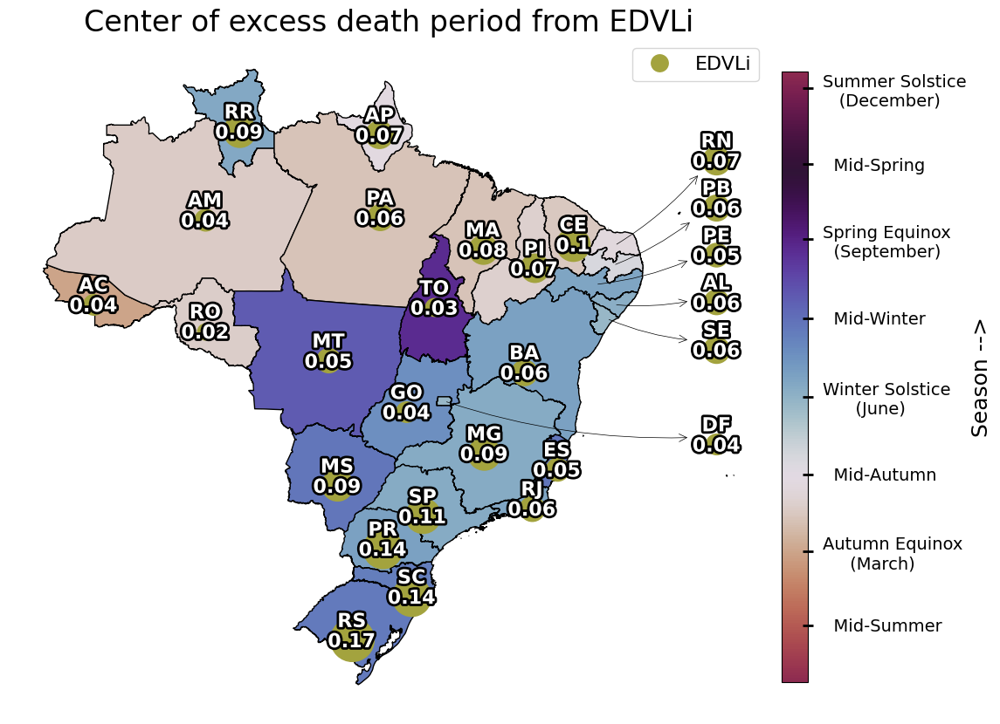

In [38]:
edi_2 = pd.read_csv(f"{path}measures/edi_2_by_state.csv",)[['state', 'center_day', 'edi']]
edi_2.columns = ['state', 'center_day_edi_2', 'edi_2']

# Read Brazil state data
br = read_state(year=2020)
# Dictionary to correct state names
dic = {'Amazônas': 'Amazonas', 'Rio Grande Do Norte': 'Rio Grande do Norte',
       'Rio De Janeiro': 'Rio de Janeiro', 'Rio Grande Do Sul': 'Rio Grande do Sul',
       'Mato Grosso Do Sul': 'Mato Grosso do Sul'}
br.name_state = br.name_state.map(dic).fillna(br.name_state)

# Merge seasonality measures data with the GeoDataFrame
br = br.merge(edi_2, left_on='abbrev_state', right_on='state', how='left')
br = br.drop(columns=['state'])
br['coords'] = br['geometry'].apply(lambda x: x.representative_point().coords[:])
br['coords'] = [coords[0] for coords in br['coords']]

# Getting seasons dates
summer_solstice_day, autumn_equinox_day, winter_solstice_day, spring_equinox_day = \
 date_dict['12-21'], date_dict['03-20'], date_dict['06-20'], date_dict['09-22']
mid_summer_day = ((summer_solstice_day-364) + autumn_equinox_day)/2
mid_autumn_day = (autumn_equinox_day + winter_solstice_day)/2
mid_winter_day = (winter_solstice_day + spring_equinox_day)/2
mid_spring_day = (spring_equinox_day + summer_solstice_day)/2

# Define the colormap and normalizer
cmap = plt.get_cmap('twilight_shifted_r')
norm = mcolors.Normalize(vmin=0, vmax=45)
# Shift the colormap and normalizer
def cyclic_norm(value, n=60):
    if value+n<=364: return value+n
    else: return value+n-364
for i in range(364+1):
    norm.vmin = min(norm.vmin, cyclic_norm(i))
    norm.vmax = max(norm.vmax, cyclic_norm(i))
cmap = mcolors.LinearSegmentedColormap.from_list("twilight_shifted_cyclic",
                                                 [cmap(norm(cyclic_norm(i))) for i in range(365)])

# Plotting both datasets side by side
fig, (ax2) = plt.subplots(1, 1, figsize=(10, 10), sharey=True)
arrow_positions = {'RN':(-30, -0), 'PB':(-30, -3),'PE':(-30, -6),'AL':(-30, -9),'SE':(-30, -12),
                   'DF':(-30, -18)}
circle_color='#a3a33e'
circle_size_parameter=7500

# Define a function to plot each state with scatter points and colorbar
def plot_states(data, ax, column, measure, measure_code, title):
    data.plot(column=column, cmap=cmap, norm=norm, legend=False, edgecolor='black', ax=ax)

    offset=1
    for idx, row in data.iterrows():
        annotation = f"{row['abbrev_state']}\n{round(row[measure],2)}"
        # state_annotation = f"{row['abbrev_state']}"
        if measure=='ptr':
          circle_size = (row[measure]-1)*circle_size_parameter
          # measure_annotation = f"{measure_code}: {round(row[measure],2)}"
        else:
          circle_size = row[measure]*circle_size_parameter
          # measure_annotation=f"{measure_code}: {round(row[measure]*100,1)}%"

        if not np.isnan(row[measure]):
            if row['abbrev_state'] in arrow_positions.keys():
                # Mark the ammount of seasonality
                ax.scatter(arrow_positions[row['abbrev_state']][0],
                           arrow_positions[row['abbrev_state']][1]-offset/2,
                           s=circle_size, color=circle_color, alpha=1)
                # Annonate states and measure
                ax.annotate(annotation,
                            xy=row['coords'],
                            xytext=arrow_positions[row['abbrev_state']],  # Text is now at the position of the arrow
                            arrowprops=dict(arrowstyle="<-", lw=0.5, color='black',
                                            connectionstyle="arc3,rad=-0.1"),
                            ha='center', va='center',
                            weight='bold', fontsize=16,
                            color='white', path_effects=[
                            withStroke(linewidth=4, foreground="black")
                ])

            else:
                # Mark the ammount of seasonality
                ax.scatter(row['coords'][0],
                           row['coords'][1]-offset/2,
                           s=circle_size, color=circle_color, alpha=1)
                # Annonate states and measure
                ax.annotate(annotation, xy=row['coords'],
                            ha='center', va='center',
                            weight='bold', fontsize=16,
                            color='white', path_effects=[
                                withStroke(linewidth=4, foreground="black")
                            ])

    # Add legend
    legend_elements = [plt.Line2D([], [], marker='o', color='w', label=measure_code,
                                  markerfacecolor=circle_color, markersize=16)]
    ax.legend(handles=legend_elements, fontsize=16, loc='upper right')
    # Add title and remove axis
    ax.set_title(title, fontsize=24)
    ax.axis('off')

# Plot EDi-2
plot_states(br, ax2, 'center_day_edi_2', 'edi_2', 'EDVLi',
            'Center of excess death period from EDVLi')

# Adding a shared color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical',
                    ticks=[summer_solstice_day, autumn_equinox_day, winter_solstice_day, spring_equinox_day,
                           mid_summer_day, mid_autumn_day, mid_winter_day, mid_spring_day])

cbar.set_ticklabels(['Summer Solstice\n   (December)', 'Autumn Equinox\n     (March)',
                    'Winter Solstice\n      (June)', 'Spring Equinox\n  (September)',
                    '  Mid-Summer', '  Mid-Autumn', '  Mid-Winter', '  Mid-Spring'])
cbar.ax.tick_params(labelsize=14, width=2, length=8, direction='inout', pad=8, labelcolor='black')
cbar.set_label('Season -->', fontsize=18)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

## EDVLi clustering

In [39]:
data = pd.read_csv(f"{path}measures/edi_2_by_state.csv").set_index('state')
cluster_data = MinMaxScaler().fit_transform(data.fillna(0))
cluster_data.shape

(27, 4)

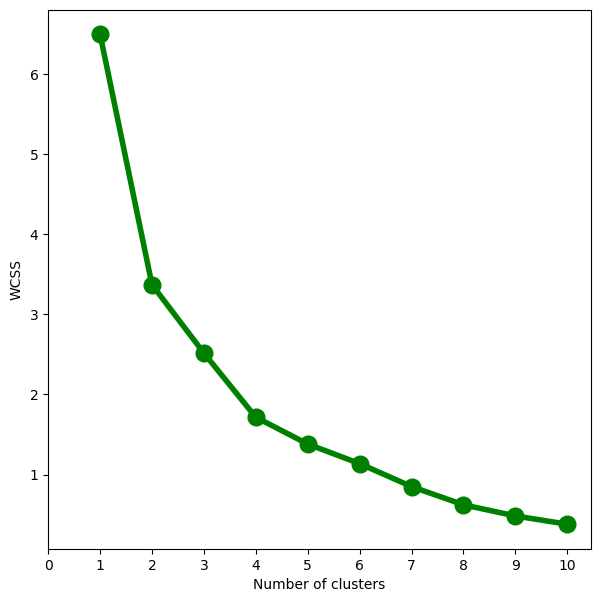

[6.494012608139979, 3.369548499635037, 2.5162615488021767, 1.715880168795746, 1.3816298277811756, 1.1373085067740798, 0.8508321116161279, 0.6235850139175783, 0.48446089995500774, 0.3813196149096128]


In [40]:
# KNN: finding optimal number of clusters using elbow rule
WCSS = []
for i in range(1,11):
    model = KMeans(n_clusters=i,init='k-means++', random_state=42)
    model.fit(cluster_data)
    WCSS.append(model.inertia_)
fig = plt.figure(figsize = (7,7))
plt.plot(range(1,11), WCSS, linewidth=4, markersize=12, marker='o',color = 'green')
plt.xticks(np.arange(11))
plt.xlabel("Number of clusters")
plt.ylabel("WCSS")
plt.show()
print(WCSS)

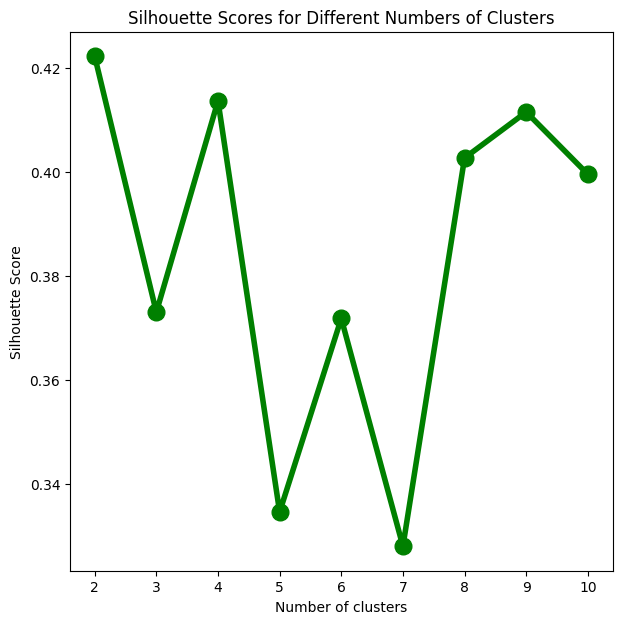

[0.42224086380756515, 0.37300583850566466, 0.4136457686120267, 0.33457413034256905, 0.3718003474743632, 0.3279925173758602, 0.40267936987088304, 0.4115092195313772, 0.39953010280154216]


In [41]:
# KNN: finding optimal number of clusters using Silhouette Score
from sklearn.metrics import silhouette_score
silhouette_scores = []
for i in range(2, 11):
    model = KMeans(n_clusters=i, init='k-means++', random_state=42)
    cluster_labels = model.fit_predict(cluster_data)
    score = silhouette_score(cluster_data, cluster_labels)
    silhouette_scores.append(score)

fig = plt.figure(figsize=(7,7))
plt.plot(range(2,11), silhouette_scores, linewidth=4, markersize=12, marker='o', color='green')
plt.xticks(np.arange(2,11))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different Numbers of Clusters")
plt.show()
print(silhouette_scores)

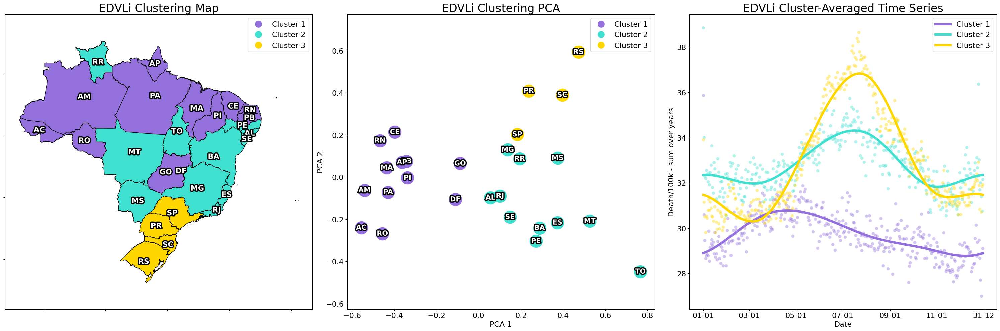

In [42]:
n=3

#https://matplotlib.org/stable/gallery/color/named_colors.html
colors = {2:['mediumpurple', 'gold'],
          3:['mediumpurple', 'turquoise', 'gold']}

#fitting chosen model
model = KMeans(n_clusters=n, init="k-means++", max_iter=300, n_init=10, random_state=42)
y_clusters = model.fit_predict(cluster_data)

#calculate clustering PCA
from sklearn.decomposition import PCA
pca = PCA(2)
data_cluster_pca = pca.fit_transform(cluster_data)
data_cluster_pca = np.concatenate((data_cluster_pca, y_clusters.reshape(-1,1),
                                   np.array(data.index).reshape(-1,1)), axis=1)
data_cluster_pca = pd.DataFrame(data_cluster_pca,
                                columns=['x', 'y', 'cluster', 'state'])

# Define each cluster from the 3 main states
cluster_sp = data_cluster_pca.loc[data_cluster_pca['state'] == 'SP', 'cluster'].iloc[0]
cluster_rj = data_cluster_pca.loc[data_cluster_pca['state'] == 'RJ', 'cluster'].iloc[0]
cluster_ce = data_cluster_pca.loc[data_cluster_pca['state'] == 'CE', 'cluster'].iloc[0]

# Update the entire cluster based on the state
data_cluster_pca.loc[data_cluster_pca['cluster'] == cluster_sp, 'cluster'] = '2'
data_cluster_pca.loc[data_cluster_pca['cluster'] == cluster_rj, 'cluster'] = '1'
data_cluster_pca.loc[data_cluster_pca['cluster'] == cluster_ce, 'cluster'] = '0'
data_cluster_pca['cluster'] = data_cluster_pca['cluster'].astype(int)

# Sort clusters
data_cluster_pca = data_cluster_pca.sort_values(by='cluster')

import geopandas as gpd
from geobr import read_state
# Read Brazil state data
br = read_state(year=2020)
# Dictionary to correct state names
dic = {'Amazônas': 'Amazonas', 'Rio Grande Do Norte': 'Rio Grande do Norte',
       'Rio De Janeiro': 'Rio de Janeiro', 'Rio Grande Do Sul': 'Rio Grande do Sul',
       'Mato Grosso Do Sul': 'Mato Grosso do Sul'}
br.name_state = br.name_state.map(dic).fillna(br.name_state)
br['coords'] = br['geometry'].apply(lambda x: x.representative_point().coords[:])
br['coords'] = [coords[0] for coords in br['coords']]
# Merge with pca data
br_df = br.merge(data_cluster_pca[['cluster', 'state']], left_on='abbrev_state', right_on='state')

#viridis is colorblind-friendly
#https://www.cta-observatory.org/wp-content/uploads/2020/10/CTA_ColourBlindness_BestPractices-1.pdf

from matplotlib.gridspec import GridSpec
import matplotlib.dates as mdates
from matplotlib.lines import Line2D
from matplotlib.patheffects import withStroke

ticks_fontsize=16
legend_fontsize=16
axlabel_fontsize = 16
title_fontsize=24

# Set up the figure and GridSpec
fig = plt.figure(figsize=(30, 10))
gs = GridSpec(1, 3, figure=fig)

# Plot 1 - clustering map
from matplotlib.colors import ListedColormap
ax1 = fig.add_subplot(gs[0, 0])
br_df.plot(column='cluster', legend=False, edgecolor='black', ax=ax1,
           cmap=ListedColormap(colors[n]))
# Create annotations
for idx, row in br.iterrows():
    plt.annotate(row['abbrev_state'], xy=row['coords'],
                 ha='center', va='center',
                 weight='bold', fontsize=legend_fontsize,
                 color='white', path_effects=[
                 withStroke(linewidth=5, foreground="black")
                  ])
# Add the custom legend
legend_elements = [Line2D([], [], marker='o', color='w', label='Cluster {}'.format(i+1),
                          markerfacecolor=colors[n][i], markersize=legend_fontsize) for i in range(n)]
ax1.legend(handles=legend_elements, loc='upper right', fontsize=legend_fontsize)

# Add title and labels
ax1.set_title('EDVLi Clustering Map', fontsize=title_fontsize)
# ax1.set_xlabel('Longitude', fontsize=axlabel_fontsize)
# ax1.set_ylabel('Latitude', fontsize=axlabel_fontsize)
# ax1.tick_params(axis='x', labelsize=ticks_fontsize)
# ax1.tick_params(axis='y', labelsize=ticks_fontsize)
ax1.tick_params(labelbottom=False, labelleft=False)
ax1.axis('equal')

# Plot 2 - clustering PCA
ax2 = fig.add_subplot(gs[0, 1])
for i in range(n):
    new_cluster_data = data_cluster_pca[data_cluster_pca['cluster'] == i]
    ax2.scatter(new_cluster_data['x'], new_cluster_data['y'], label=f'Cluster {i}',
                color=colors[n][i], s=750)
    # Center the text annotations for states
    for i, row in new_cluster_data.iterrows():
        ax2.text(row['x'], row['y'], str(row['state']),
                 horizontalalignment='center', verticalalignment='center',
                 color='white', path_effects=[withStroke(linewidth=5, foreground="black")],
                 fontsize=15, fontweight='bold')
# Add title and labels
ax2.set_title('EDVLi Clustering PCA', fontsize=title_fontsize)
legend_elements = [Line2D([], [], marker='o', color='w', label='Cluster {}'.format(i+1),
                          markerfacecolor=colors[n][i], markersize=legend_fontsize) for i in range(n)]
ax2.legend(handles=legend_elements, fontsize=legend_fontsize)
# ax2.legend(fontsize=legend_fontsize)
ax2.set_xlabel('PCA 1', fontsize=axlabel_fontsize)
ax2.set_ylabel('PCA 2', fontsize=axlabel_fontsize)
ax2.axis('equal')
ax2.tick_params(axis='x', labelsize=ticks_fontsize)
ax2.tick_params(axis='y', labelsize=ticks_fontsize)

# Plot 3 - Comparing mean values
ax3 = fig.add_subplot(gs[0, 2])
for i in range(n):
    cluster_cols = data_cluster_pca[data_cluster_pca.cluster == i].state
    mean_observed = ts_observed[cluster_cols].mean(axis=1)
    mean_predicted = ts_predicted[cluster_cols].mean(axis=1)
    sns.lineplot(data=mean_predicted, color=colors[n][i],
                 label=f'Cluster {i+1}', linewidth=5, ax=ax3)
    sns.scatterplot(data=mean_observed, color=colors[n][i], alpha=0.4, s=50, ax=ax3)
# Change xlabels and remove last one - next year
ax3.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
xtick_labels = ax3.get_xticklabels()
if xtick_labels: xtick_labels[-1].set_text('31-12')
ax3.set_xticklabels(xtick_labels)
# Title, labels, and ticks
ax3.set_title('EDVLi Cluster-Averaged Time Series', fontsize=title_fontsize)
ax3.legend(fontsize=legend_fontsize)
ax3.set_xlabel('Date', fontsize=axlabel_fontsize)
ax3.set_ylabel('Death/100k - sum over years', fontsize=axlabel_fontsize)
ax3.tick_params(axis='x', labelsize=ticks_fontsize)
ax3.tick_params(axis='y', labelsize=ticks_fontsize)

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

In [43]:
for i in range(2+1):
  print(f"edi2_cluster_{i+1} = {[x for x in data_cluster_pca[data_cluster_pca.cluster==i]['state']]}")

edi2_cluster_1 = ['PI', 'RO', 'AC', 'GO', 'PB', 'PA', 'DF', 'CE', 'AM', 'MA', 'AP', 'RN']
edi2_cluster_2 = ['RJ', 'MS', 'ES', 'MG', 'RR', 'SE', 'MT', 'TO', 'AL', 'PE', 'BA']
edi2_cluster_3 = ['SC', 'SP', 'PR', 'RS']


## EDVLi by cause

In [44]:
# Define death column
death_column = 'DEATHS_STANDARDIZED_BR'

# Define measure
measure_name = 'EDi-2'

# Calculate measure
seasonality_by_cause_calculation(measure_name)

Text(0.5, 25.722222222222214, 'State')

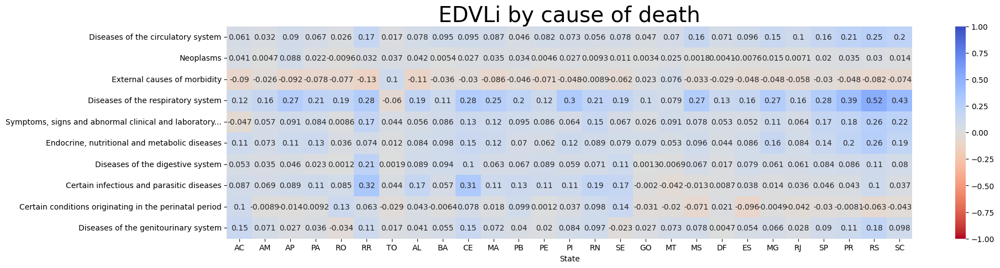

In [45]:
data = pd.read_csv(f"{path}measures/{measure_name.lower().replace('-', '_')}_by_cause_by_state.csv", index_col=0)
data.index = [' '.join(x[:x.rfind(' ', 0, 60)].split()) + '...' if len(x) > 60 else x for x in data.index]
plt.figure(figsize=(20,5))
plt.title(f'EDVLi by cause of death', fontsize=28)
sns.heatmap(data, vmin=-1, vmax=1, cmap='coolwarm_r', annot=True)
plt.ylabel('')
plt.xlabel('State')

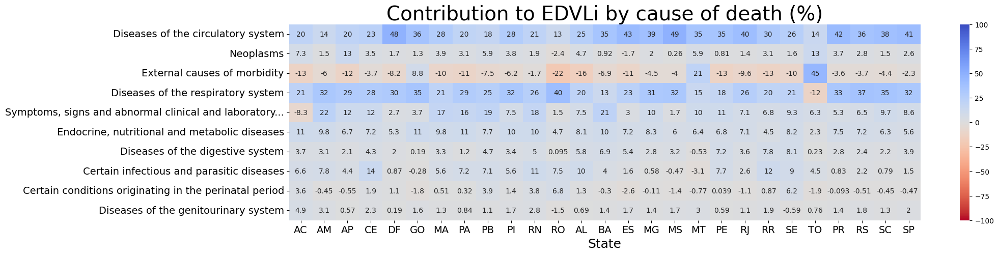

In [46]:
data = pd.read_csv(f"{path}measures/contribution_to_{measure_name.lower().replace('-', '_')}_by_cause_by_state.csv", index_col=0)
data.index = [' '.join(x[:x.rfind(' ', 0, 60)].split()) + '...' if len(x) > 60 else x for x in data.index]
data = data[data_cluster_pca.sort_values(by=['cluster', 'state']).state] # sort by cluster
plt.figure(figsize=(20,5))
plt.title(f'Contribution to EDVLi by cause of death (%)', fontsize=28)
sns.heatmap(data, vmin=-100, vmax=100, cmap='coolwarm_r', annot=True)
plt.ylabel('', fontsize=18)
plt.xlabel('State', fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

# EDi vs EDVLi

Comparing the EDi and the EDVLi.

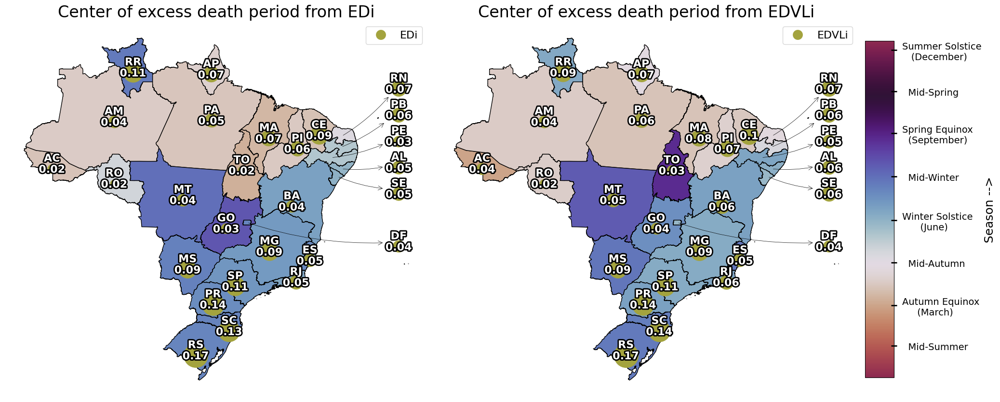

In [47]:
ptr = pd.read_csv(f"{path}measures/ptr_by_state.csv")[['state', 'peak_day', 'PTR']]
ptr.columns = ['state', 'center_day_ptr', 'ptr']
edi_1 = pd.read_csv(f"{path}measures/edi_1_by_state.csv")
edi_1.columns = ['state', 'center_day_edi_1', 'edi_1']
edi_2 = pd.read_csv(f"{path}measures/edi_2_by_state.csv",)[['state', 'center_day', 'edi']]
edi_2.columns = ['state', 'center_day_edi_2', 'edi_2']

# Read Brazil state data
br = read_state(year=2020)
# Dictionary to correct state names
dic = {'Amazônas': 'Amazonas', 'Rio Grande Do Norte': 'Rio Grande do Norte',
       'Rio De Janeiro': 'Rio de Janeiro', 'Rio Grande Do Sul': 'Rio Grande do Sul',
       'Mato Grosso Do Sul': 'Mato Grosso do Sul'}
br.name_state = br.name_state.map(dic).fillna(br.name_state)

# Merge seasonality measures data with the GeoDataFrame
br = br.merge(ptr, left_on='abbrev_state', right_on='state', how='left')
br = br.merge(edi_1, left_on='abbrev_state', right_on='state', how='left')
br = br.merge(edi_2, left_on='abbrev_state', right_on='state', how='left')
br = br.drop(columns=['state', 'state_x', 'state_y'])
br['coords'] = br['geometry'].apply(lambda x: x.representative_point().coords[:])
br['coords'] = [coords[0] for coords in br['coords']]

# Getting seasons dates
summer_solstice_day, autumn_equinox_day, winter_solstice_day, spring_equinox_day = \
 date_dict['12-21'], date_dict['03-20'], date_dict['06-20'], date_dict['09-22']
mid_summer_day = ((summer_solstice_day-364) + autumn_equinox_day)/2
mid_autumn_day = (autumn_equinox_day + winter_solstice_day)/2
mid_winter_day = (winter_solstice_day + spring_equinox_day)/2
mid_spring_day = (spring_equinox_day + summer_solstice_day)/2

# Define the colormap and normalizer
cmap = plt.get_cmap('twilight_shifted_r')
norm = mcolors.Normalize(vmin=0, vmax=45)
# Shift the colormap and normalizer
def cyclic_norm(value, n=60):
    if value+n<=364: return value+n
    else: return value+n-364
for i in range(364+1):
    norm.vmin = min(norm.vmin, cyclic_norm(i))
    norm.vmax = max(norm.vmax, cyclic_norm(i))
cmap = mcolors.LinearSegmentedColormap.from_list("twilight_shifted_cyclic",
                                                 [cmap(norm(cyclic_norm(i))) for i in range(365)])

# Plotting both datasets side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), sharey=True)
arrow_positions = {'RN':(-30, -0), 'PB':(-30, -3),'PE':(-30, -6),'AL':(-30, -9),'SE':(-30, -12),
                   'DF':(-30, -18)}
circle_color='#a3a33e'
circle_size_parameter=7500

# Define a function to plot each state with scatter points and colorbar
def plot_states(data, ax, column, measure, measure_code, title):
    data.plot(column=column, cmap=cmap, norm=norm, legend=False, edgecolor='black', ax=ax)

    offset=1
    for idx, row in data.iterrows():
        annotation = f"{row['abbrev_state']}\n{round(row[measure],2)}"
        # state_annotation = f"{row['abbrev_state']}"
        if measure=='ptr':
          circle_size = (row[measure]-1)*circle_size_parameter
          # measure_annotation = f"{measure_code}: {round(row[measure],2)}"
        else:
          circle_size = row[measure]*circle_size_parameter
          # measure_annotation=f"{measure_code}: {round(row[measure]*100,1)}%"

        if not np.isnan(row[measure]):
            if row['abbrev_state'] in arrow_positions.keys():
                # Mark the ammount of seasonality
                ax.scatter(arrow_positions[row['abbrev_state']][0],
                           arrow_positions[row['abbrev_state']][1]-offset/2,
                           s=circle_size, color=circle_color, alpha=1)
                # Annonate states and measure
                ax.annotate(annotation,
                            xy=row['coords'],
                            xytext=arrow_positions[row['abbrev_state']],  # Text is now at the position of the arrow
                            arrowprops=dict(arrowstyle="<-", lw=0.5, color='black',
                                            connectionstyle="arc3,rad=-0.1"),
                            ha='center', va='center',
                            weight='bold', fontsize=16,
                            color='white', path_effects=[
                            withStroke(linewidth=4, foreground="black")
                ])

            else:
                # Mark the ammount of seasonality
                ax.scatter(row['coords'][0],
                           row['coords'][1]-offset/2,
                           s=circle_size, color=circle_color, alpha=1)
                # Annonate states and measure
                ax.annotate(annotation, xy=row['coords'],
                            ha='center', va='center',
                            weight='bold', fontsize=16,
                            color='white', path_effects=[
                                withStroke(linewidth=4, foreground="black")
                            ])

    # Add legend
    legend_elements = [plt.Line2D([], [], marker='o', color='w', label=measure_code,
                                  markerfacecolor=circle_color, markersize=16)]
    ax.legend(handles=legend_elements, fontsize=16, loc='upper right')
    # Add title and remove axis
    ax.set_title(title, fontsize=24)
    ax.axis('off')

# Plot EDi-1
plot_states(br, ax1, 'center_day_edi_1', 'edi_1', 'EDi',
            'Center of excess death period from EDi')

# Plot EDi-2
plot_states(br, ax2, 'center_day_edi_2', 'edi_2', 'EDVLi',
            'Center of excess death period from EDVLi')

# Adding a shared color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical',
                    ticks=[summer_solstice_day, autumn_equinox_day, winter_solstice_day, spring_equinox_day,
                           mid_summer_day, mid_autumn_day, mid_winter_day, mid_spring_day])

cbar.set_ticklabels(['Summer Solstice\n   (December)', 'Autumn Equinox\n     (March)',
                    'Winter Solstice\n      (June)', 'Spring Equinox\n  (September)',
                    '  Mid-Summer', '  Mid-Autumn', '  Mid-Winter', '  Mid-Spring'])
cbar.ax.tick_params(labelsize=14, width=2, length=8, direction='inout', pad=8, labelcolor='black')
cbar.set_label('Season -->', fontsize=18)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

# Averages by cluster

Comparing each cluster of each metric.

In [48]:
ewdi_cluster_1 = ['TO', 'AP', 'AM', 'RO', 'CE', 'RN', 'PI', 'MA', 'PA']
ewdi_cluster_2 = ['SE', 'RJ', 'PE', 'PB', 'AC', 'MT', 'GO', 'ES', 'DF', 'BA', 'AL']
ewdi_cluster_3 = ['MG', 'MS', 'RS', 'RR', 'SC', 'SP', 'PR']
edi1_cluster_1 = ['AC', 'AP', 'MA', 'AM', 'CE', 'RN', 'PA', 'PI', 'TO', 'RO']
edi1_cluster_2 = ['GO', 'DF', 'BA', 'MT', 'SE', 'AL', 'ES', 'PE', 'PB', 'RJ']
edi1_cluster_3 = ['SP', 'PR', 'RR', 'MG', 'SC', 'MS', 'RS']
edi2_cluster_1 = ['PI', 'RO', 'AC', 'GO', 'PB', 'PA', 'DF', 'CE', 'AM', 'MA', 'AP', 'RN']
edi2_cluster_2 = ['RJ', 'MS', 'ES', 'MG', 'RR', 'SE', 'MT', 'TO', 'AL', 'PE', 'BA']
edi2_cluster_3 = ['SC', 'SP', 'PR', 'RS']
ptr_cluster_1 = ['AP', 'MA', 'AM', 'CE', 'RN', 'PA', 'PI', 'AC', 'RO', 'TO']
ptr_cluster_2 = ['SE', 'BA', 'MT', 'PE', 'AL', 'RJ', 'PB']
ptr_cluster_3 = ['SP', 'PR', 'MS', 'RR', 'MG', 'GO', 'DF', 'SC', 'ES', 'RS']

In [49]:
# Read data
ewdi = pd.read_csv(f'{path}measures/ewdi_by_state.csv')
ptr = pd.read_csv(f'{path}measures/ptr_by_state.csv')
edi1 = pd.read_csv(f'{path}measures/edi_1_by_state.csv')
edi2 = pd.read_csv(f'{path}measures/edi_2_by_state.csv')

# Merge data
ewdi = ewdi[['state', 'number']]
ewdi.columns = ['state', 'ewdi']
ewdi['state'] = ewdi['state'].map(
    dict(zip(state_dict.values(), state_dict.keys())))
ptr = ptr[['state', 'PTR', 'peak_day', 'trough_day']]
ptr.columns = ['state', 'ptr', 'peak_day', 'trough_day']
edi1 = edi1[['state', 'edi', 'center_day']]
edi1.columns = ['state', 'edi1', 'edi1_center_day']
edi2 = edi2[['state', 'edi', 'center_day', 'size']]
edi2.columns = ['state', 'edi2', 'edi2_center_day', 'edi2_size']
results = ewdi.merge(edi1, left_on='state', right_on='state', how='left')
results = results.merge(edi2, left_on='state', right_on='state', how='left')
results = results.merge(ptr, left_on='state', right_on='state', how='left')
results['cluster_ewdi'] = results['state']
results['cluster_edi1'] = results['state']
results['cluster_edi2'] = results['state']
results['cluster_ptr'] = results['state']

# Group clusters
def f(x, cluster_1, cluster_2, cluster_3):
  if x in cluster_1: return 'Cluster 1'
  elif x in cluster_2: return 'Cluster 2'
  elif x in cluster_3: return 'Cluster 3'
  else: return x
results['cluster_ewdi'] = results['cluster_ewdi'].apply(lambda x: f(x,
                          ewdi_cluster_1, ewdi_cluster_2, ewdi_cluster_3))
results['cluster_edi1'] = results['cluster_edi1'].apply(lambda x: f(x,
                          edi1_cluster_1, edi1_cluster_2, edi1_cluster_3))
results['cluster_edi2'] = results['cluster_edi2'].apply(lambda x: f(x,
                          edi2_cluster_1, edi2_cluster_2, edi2_cluster_3))
results['cluster_ptr'] = results['cluster_ptr'].apply(lambda x: f(x,
                          ptr_cluster_1, ptr_cluster_2, ptr_cluster_3))

results = results[['state', 'cluster_ewdi', 'ewdi', 'cluster_edi1', 'edi1', 'edi1_center_day',
                   'cluster_edi2', 'edi2', 'edi2_center_day', 'edi2_size', 'cluster_ptr', 'ptr', 'peak_day', 'trough_day']]
results = results.set_index('state')

# results.columns = ['cluster', 'EWDi', 'EDi-1', 'EDi-2', 'PTR']

# results = results.groupby(by='cluster').mean()
# display(results)

# results.groupby(by=['cluster_ewdi', 'cluster_edi1', 'cluster_edi2', 'cluster_ptr']).mean()
ewdi = results[['cluster_ewdi', 'ewdi']].groupby(by=['cluster_ewdi']).mean()
edi1 = results[['cluster_edi1', 'edi1', 'edi1_center_day']].groupby(by=['cluster_edi1']).mean()
edi2 = results[['cluster_edi2', 'edi2', 'edi2_center_day', 'edi2_size']].groupby(by=['cluster_edi2']).mean()
ptr = results[['cluster_ptr', 'ptr', 'peak_day', 'trough_day']].groupby(by=['cluster_ptr']).mean()
results = pd.concat([ewdi, edi1, edi2, ptr], axis=1)
results['edi1_center_day'] = results['edi1_center_day'].round(0).astype(int).map({k:v for (v, k) in date_dict.items()})
results['edi2_center_day'] = results['edi2_center_day'].round(0).astype(int).map({k:v for (v, k) in date_dict.items()})
results['peak_day'] = results['peak_day'].round(0).astype(int).map({k:v for (v, k) in date_dict.items()})
results['trough_day'] = results['trough_day'].round(0).astype(int).map({k:v for (v, k) in date_dict.items()})
results = results.round(2).astype(str).reset_index()
# results.columns = ['Cluster', 'EWDi', 'EDi-1', 'EDi-1: center day',
#                    'EDi-2', 'EDi-2: center day', 'EDi-2: size',
#                    'PTR', 'Peak day', 'Trough day']
results.columns = ['Cluster', 'EWDi', 'EDi', 'EDi center',
                   'EDVLi', 'EDVLi center', 'EDVLi size',
                   'PTR', 'Peak', 'Trough']
print(results.to_latex(index=False, header=True))

\begin{tabular}{llllllllll}
\toprule
Cluster & EWDi & EDi & EDi center & EDVLi & EDVLi center & EDVLi size & PTR & Peak & Trough \\
\midrule
Cluster 1 & -0.01 & 0.05 & 04-15 & 0.06 & 04-29 & 114.58 & 1.08 & 04-06 & 11-27 \\
Cluster 2 & 0.03 & 0.04 & 07-06 & 0.06 & 07-15 & 81.82 & 1.09 & 07-05 & 11-01 \\
Cluster 3 & 0.12 & 0.12 & 07-20 & 0.14 & 07-14 & 105.0 & 1.15 & 07-19 & 02-28 \\
\bottomrule
\end{tabular}



In [50]:
# use "data = pd.read_csv(f"{path}measures/{measure_name.lower()}_by_cause_by_state.csv", index_col=0)"
# to put states in latitude order


# Define clusters
ptr_cluster_1 = ['AP', 'MA', 'AM', 'CE', 'RN', 'PA', 'PI', 'AC', 'RO', 'TO']
ptr_cluster_2 = ['SE', 'BA', 'MT', 'PE', 'AL', 'RJ', 'PB']
ptr_cluster_3 = ['SP', 'PR', 'MS', 'RR', 'MG', 'GO', 'DF', 'SC', 'ES', 'RS']

# Read data
ewdi = pd.read_csv(f'{path}measures/ewdi_by_state.csv')
ptr = pd.read_csv(f'{path}measures/ptr_by_state.csv')
edi1 = pd.read_csv(f'{path}measures/edi_1_by_state.csv')
edi2 = pd.read_csv(f'{path}measures/edi_2_by_state.csv')

# Merge data
ewdi = ewdi[['state', 'number']]
ewdi.columns = ['state', 'ewdi']
ewdi['state'] = ewdi['state'].map(
    dict(zip(state_dict.values(), state_dict.keys())))
ptr = ptr[['state', 'PTR', 'peak_date', 'trough_date']]
ptr.columns = ['state', 'ptr', 'ptr_peak_day', 'ptr_trough_day']
edi1 = edi1[['state', 'edi', 'center_day']]
edi1['center_day'] = edi1['center_day'].map(inverse_date_dict)
edi1.columns = ['state', 'edi1', 'edi1_center_day']
edi2 = edi2[['state', 'edi', 'center_day', 'size']]
edi2['center_day'] = edi2['center_day'].round().map(inverse_date_dict) #date rounded
edi2.columns = ['state', 'edi2', 'edi2_center_day', 'edi2_size']
results = ewdi.merge(edi1, left_on='state', right_on='state', how='left')
results = results.merge(edi2, left_on='state', right_on='state', how='left')
results = results.merge(ptr, left_on='state', right_on='state', how='left')
results['ewdi'] = (results['ewdi']*100).round(1).astype(str)+'\%'
results['edi1'] = (results['edi1']*100).round(1).astype(str)+'\%'
results['edi2'] = (results['edi2']*100).round(1).astype(str)+'\%'
results['ptr'] = results['ptr'].round(2).astype(str)
def f(x) :
  if x in ptr_cluster_1: return '1'
  elif x in ptr_cluster_2: return '2'
  elif x in ptr_cluster_3: return '3'
results['cluster'] = results['state'].apply(lambda x: f(x))
results = results.sort_values(by=['cluster', 'ptr'])
results = results[['state', 'cluster', 'ptr',
                  'ptr_peak_day', 'ptr_trough_day', 'ewdi', 'edi1', 'edi1_center_day', 'edi2',
                  'edi2_center_day', 'edi2_size']]
# results.columns = ['State', 'PTR-Cluster',
#                    'PTR', 'PTR: peak', 'PTR: trough', 'EWDi', 'EDi-1', 'EDi1: center day',
#                    'EDi-2', 'EDi-2: center day', 'EDi-2: size']
results.columns = ['State', 'Cluster',
                   'PTR', 'Peak', 'Trough', 'EWDi', 'EDi', 'EDi center',
                   'EDVLi', 'EDVLi center', 'EDVLi size']
print(results.to_latex(index=False, header=True))

\begin{tabular}{llllllllllr}
\toprule
State & Cluster & PTR & Peak & Trough & EWDi & EDi & EDi center & EDVLi & EDVLi center & EDVLi size \\
\midrule
RO & 1 & 1.03 & 04-02 & 12-14 & 0.8\% & 2.0\% & 05-18 & 2.4\% & 04-16 & 90 \\
TO & 1 & 1.04 & 03-18 & 12-12 & 1.0\% & 1.9\% & 03-27 & 2.9\% & 09-16 & 65 \\
AC & 1 & 1.06 & 03-20 & 12-05 & 1.5\% & 2.4\% & 04-09 & 3.9\% & 03-20 & 55 \\
AM & 1 & 1.07 & 04-02 & 12-08 & 0.2\% & 4.2\% & 04-14 & 4.2\% & 04-13 & 125 \\
PA & 1 & 1.08 & 04-04 & 11-28 & -1.3\% & 5.4\% & 04-10 & 6.0\% & 04-09 & 75 \\
PI & 1 & 1.1 & 04-16 & 12-26 & -2.3\% & 6.4\% & 04-12 & 7.3\% & 04-19 & 75 \\
AP & 1 & 1.11 & 04-20 & 12-21 & -0.5\% & 7.1\% & 04-18 & 6.8\% & 05-01 & 120 \\
MA & 1 & 1.11 & 04-02 & 11-27 & -0.9\% & 7.1\% & 03-31 & 7.5\% & 04-09 & 85 \\
RN & 1 & 1.11 & 04-26 & 11-11 & -0.2\% & 6.8\% & 05-09 & 7.0\% & 04-29 & 155 \\
CE & 1 & 1.13 & 04-12 & 09-04 & -3.0\% & 9.4\% & 04-07 & 10.1\% & 04-11 & 90 \\
MT & 2 & 1.07 & 08-06 & 12-12 & 4.7\% & 4.3\% & 08-06 & 5.3\%